In [3]:
# Enze Xu
# Github: https://github.com/EnzeXu/PINN
# git clone https://github.com/EnzeXu/PINN.git

import torch
import time
import random
import argparse
import math
import os
import numpy as np
import matplotlib.pyplot as plt
from torch import nn, optim
from scipy import stats
from tqdm import tqdm
from collections import OrderedDict
from torchsummary import summary
from torch.backends import cudnn
from mpl_toolkits.mplot3d import Axes3D
from scipy.integrate import odeint
from torch.utils.tensorboard import SummaryWriter

from google.colab import drive
import sys
drive.mount("/content/drive")

main_path = '/content/drive/My Drive/enze/workspace/PINN/' # ENZE marked: you need to change your main_path if it's not here
sys.path.append(main_path)
from cyclic_lr_scheduler import CyclicLR
from utils import draw_two_dimension, draw_two_dimension_different_x

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [5]:
class ConfigPP:
    def __init__(self):
      self.model_name = "SimpleNetworkPP_Truth"
      self.T = 20.0
      self.T_all = 20.0
      self.T_unit = 0.01
      self.N = int(self.T / self.T_unit)
      self.U_start = 10.0
      self.V_start = 5.0
      self.alpha = 1.0
      self.beta = 3.0
      self.gamma = 0.3
      self.e = 0.333
      self.ub = self.T
      self.lb = 0.0

      self.continue_period = 0.2
      self.round_bit = 3
      self.continue_id = None
      self.mapping_overall_flag = False
      self.loss2_partial_flag = False

      self.only_truth_flag = False
      self.truth_rate = 0.0005 # 0.0005 * 20 / 0.01 = 1 point(s)  #0.0005#0.25 #0.0005
      self.truth_length = int(self.truth_rate * self.T / self.T_unit)
      print("self.truth_length: {} of {} all ".format(self.truth_length, self.N))

    # sliding_window_step = 50000

class SimpleNetworkPP(nn.Module):
    def __init__(self, config, truth=None):
        super(SimpleNetworkPP, self).__init__()
        self.setup_seed(1)
        self.config = config
        self.device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
        self.x, self.y0, self.t0 = None, None, None
        self.accurate_x = None
        self.generate_x()
        self.initial_start()
        self.model_name = self.config.model_name
        self.gt = GroundTruthPP(self.config.T, self.config.N)
        self.gt_data = torch.Tensor(self.gt.data).to(self.device)
        self.act = nn.Tanh()
        self.network_unit = 100
        # self.truth = truth if truth else [[], []]
        # self.truth_dic = {round(self.truth[0][i], self.config.round_bit): self.truth[1][i] for i in range(len(truth[0]))}
        # print("self.truth_dic:", self.truth_dic)
        

        # Design A
        self.fc1 = nn.Sequential(OrderedDict({
            'lin1': nn.Linear(1, self.network_unit),
            'activation1': self.act,
            'lin2': nn.Linear(self.network_unit, self.network_unit),
            'activation2': self.act,
            'lin3': nn.Linear(self.network_unit, self.network_unit),
            'activation3': self.act,
            'lin4': nn.Linear(self.network_unit, self.network_unit),#
            'activation4': self.act,#
            # 'lin5': nn.Linear(100, 100),#
            # 'activation5': self.act,#
            'lin6': nn.Linear(self.network_unit, 1),
            # 'activation5': nn.ReLU(),
        }))

        self.fc2 = nn.Sequential(OrderedDict({
            'lin1': nn.Linear(1, self.network_unit),
            'activation1': self.act,
            'lin2': nn.Linear(self.network_unit, self.network_unit),
            'activation2': self.act,
            'lin3': nn.Linear(self.network_unit, self.network_unit),
            'activation3': self.act,
            'lin4': nn.Linear(self.network_unit, self.network_unit),#
            'activation4': self.act,#
            # 'lin5': nn.Linear(100, 100),#
            # 'activation5': self.act,#
            'lin6': nn.Linear(self.network_unit, 1),
            # 'activation5': nn.ReLU(),
        }))

        # Design B
        # self.fc_start1 = nn.Sequential(OrderedDict({
        #     'lin1': nn.Linear(1, 100),
        #     'activation1': self.act,
        # }))

        # self.fc_start2 = nn.Sequential(OrderedDict({
        #     'lin1': nn.Linear(1, 100),
        #     'activation1': self.act,
        # }))

        # self.fc_end1 = nn.Sequential(OrderedDict({
        #     'lin1': nn.Linear(100, 1),
        #     # 'activation1': self.act,
        # }))

        # self.fc_end2 = nn.Sequential(OrderedDict({
        #     'lin1': nn.Linear(100, 1),
        #     # 'activation1': self.act,
        # }))

        # self.fc_middle = nn.Sequential(OrderedDict({
        #     'lin1': nn.Linear(200, 200),
        #     'activation1': self.act,
        #     'lin2': nn.Linear(200, 200),
        #     'activation2': self.act,
        # }))

        # # Design D
        # self.fc_x1_0_1 = nn.Sequential(OrderedDict({
        #     'lin1': nn.Linear(1, self.network_unit),
        #     'sig1': self.act,
        # }))

        # self.fc_x2_0_1 = nn.Sequential(OrderedDict({
        #     'lin1': nn.Linear(1, self.network_unit),
        #     'sig1': self.act,
        # }))

        # self.fc_x1_1_2 = nn.Sequential(OrderedDict({
        #     'lin1': nn.Linear(2 * self.network_unit, self.network_unit),
        #     'sig1': self.act,
        # }))

        # self.fc_x2_1_2 = nn.Sequential(OrderedDict({
        #     'lin1': nn.Linear(2 * self.network_unit, self.network_unit),
        #     'sig1': self.act,
        # }))

        # self.fc_x1_2_3 = nn.Sequential(OrderedDict({
        #     'lin1': nn.Linear(2 * self.network_unit, self.network_unit),
        #     'sig1': self.act,
        # }))

        # self.fc_x2_2_3 = nn.Sequential(OrderedDict({
        #     'lin1': nn.Linear(2 * self.network_unit, self.network_unit),
        #     'sig1': self.act,
        # }))

        # self.fc_x1_3_4 = nn.Sequential(OrderedDict({
        #     'lin1': nn.Linear(self.network_unit, 1),
        # }))

        # self.fc_x2_3_4 = nn.Sequential(OrderedDict({
        #     'lin1': nn.Linear(self.network_unit, 1),
        # }))


    def forward(self, inputs):
        # A
        u_old, v_old = torch.chunk(inputs, 2, 1)
        u_new = self.fc1(u_old)
        v_new = self.fc2(v_old)
        outputs = torch.cat((u_new, v_new), 1)

        # B
        # u_old, v_old = torch.chunk(inputs, 2, 1)
        # u_middle = self.fc_start1(u_old)
        # v_middle = self.fc_start2(v_old)
        # middle_input = torch.cat((u_middle, v_middle), 1)
        # middle_output = self.fc_middle(middle_input)
        # middle_output_chunk = torch.chunk(middle_output, 2, 1)
        # u_end_input, v_end_input = middle_output_chunk[0], middle_output_chunk[1]
        # u_new = self.fc_end1(u_end_input)
        # v_new = self.fc_end2(v_end_input)
        # outputs = torch.cat((u_new, v_new), 1)


        # # Design D
        # x1, x2 = torch.chunk(inputs, 2, 1)
        # x1_1_output = self.fc_x1_0_1(x1)
        # x2_1_output = self.fc_x2_0_1(x2)

        # x1_2_input = torch.cat((x1_1_output, x2_1_output), 1)
        # x2_2_input = torch.cat((x1_1_output, x2_1_output), 1)

        # x1_2_output = self.fc_x1_1_2(x1_2_input)
        # x2_2_output = self.fc_x2_1_2(x2_2_input)
        
        # x1_3_input = torch.cat((x1_2_output, x2_2_output), 1)
        # x2_3_input = torch.cat((x1_2_output, x2_2_output), 1)
        
        # x1_3_output = self.fc_x1_2_3(x1_3_input)
        # x2_3_output = self.fc_x2_2_3(x2_3_input)
        
        # x1_new = self.fc_x1_3_4(x1_3_output)
        # x2_new = self.fc_x2_3_4(x2_3_output)
        
        # outputs = torch.cat((x1_new, x2_new), 1)
        return outputs

    def generate_x(self):
        # lb_row = np.repeat(self.config.lb, 2).reshape([1, -1])
        # ub_row = np.repeat(self.config.ub, 2).reshape([1, -1])
        # x = lb_row + (ub_row - lb_row) * lhs(1, self.config.N)
        # x = sorted(x, key=lambda xx: xx[0])
        x = [[i*self.config.T_unit, i*self.config.T_unit] for i in range(self.config.N)]  # toy
        x = np.asarray(x)
        x = self.encode_t(x)
        print("continue_id = {}: [0, {}] is mapped to [{}, {}]".format(self.config.continue_id, self.config.T, x[0], x[-1]))
        self.x = torch.Tensor(x).float().to(self.device)

        self.accurate_x = [i*self.config.T_unit for i in range(self.config.N)]

    def initial_start(self):
        self.t0 = torch.Tensor(np.asarray([-1.0, -1.0]).reshape([1, -1])).float().to(self.device)
        # self.y0 = torch.Tensor(np.asarray([0.0, 0.0]).reshape([1, -1])).float().to(self.device)
        self.y0 = torch.Tensor(np.asarray([self.config.U_start, self.config.V_start]).reshape([1, -1])).float().to(self.device)
    
    
    def loss_only_ground_truth(self):
        self.eval()
        y = self.forward(self.x)
        self.loss_norm = torch.nn.MSELoss().to(self.device)
        # print(y.shape, self.gt_data.shape)
        loss = self.loss_norm(y, self.gt_data)
        self.train()
        return loss, [loss], []

    def loss(self):
        self.eval()
        y = self.forward(self.x)
        y0_pred = self.forward(self.t0)
        # print("y.shape:", y[:, 0:1].shape)
        # print(y[:, 0:1])
        # print("self.x.shape:", self.x[:, 0:1].shape)
        # y_t = torch.gradient(y, spacing=(self.x,))[0]  # y_t = tf.gradients(y, t)[0]
        u = y[:, 0:1]
        v = y[:, 1:2]

        u_t = torch.gradient(y[:, 0:1].reshape([self.config.N]), spacing=(self.decode_t(self.x)[:, 0:1].reshape([self.config.N]),))[0]  # u_t = y_t[:, 0:1]
        v_t = torch.gradient(y[:, 1:2].reshape([self.config.N]), spacing=(self.decode_t(self.x)[:, 1:2].reshape([self.config.N]),))[0]  # y_t[:, 1:2]
        u_t = u_t.reshape([self.config.N, 1])
        v_t = v_t.reshape([self.config.N, 1])
        # print(y_t,u_t)
        f_u = u_t - (self.config.alpha - self.config.gamma * v) * u    # nn model
        f_v = v_t - (-self.config.beta + self.config.e * self.config.gamma * u) * v    # nn model
        # f_u = u_t - torch.cos(self.decode_t(self.x)[:, 0:1])
        # f_v = v_t - torch.cos(self.decode_t(self.x)[:, 1:2])
        f_y = torch.cat((f_u, f_v), 1)

        # print((self.decode_t(self.x)[:, 0:1].reshape([self.config.N]),).shape)
        # print(u_t.shape)

        # u_tt = torch.gradient(u_t, spacing=(self.decode_t(self.x)[:, 0:1].reshape([self.config.N]),))[0]
        # v_tt = torch.gradient(v_t, spacing=(self.decode_t(self.x)[:, 1:2].reshape([self.config.N]),))[0]
        
        # print_flag = False  # True # False
        # if print_flag:
        #     print("u=", u.shape, u, "v=", v.shape, v, "t=", (self.decode_t(self.x)[:, 0:1]).shape, self.decode_t(self.x)[:, 0:1])
        #     print("u_t=", u_t, "shape=", u_t.shape, "u_t_minus=", (self.config.alpha - self.config.gamma * v) * u,
        #           "shape=", ((self.config.alpha - self.config.gamma * v) * u).shape)
        #     print("v_t=", v_t, "shape=", v_t.shape, "v_t_minus=",
        #           (-self.config.beta + self.config.e * self.config.gamma * u) * v, "shape=",
        #           ((-self.config.beta + self.config.e * self.config.gamma * u) * v).shape)
        #     print("self.t0 =", self.t0, "self.encode_y(self.t0)=", self.encode_y(self.t0), "self.y0 =", self.y0,
        #           "y0_pred =", y0_pred, "self.y0 - y0_pred =", self.y0 - y0_pred)

        # loss_2_weights = [[i, i] for i in range(20000)]  # toy
        # loss_2_weights = np.asarray(loss_2_weights)
        # loss_2_weights = torch.Tensor(loss_2_weights).float().to(self.device)

        # original
        # loss_1 = torch.mean(torch.square(self.y0 - y0_pred))
        # loss_2 = torch.mean(torch.square(f_y))  # + torch.var(torch.square(f_y))
        # loss_3 = torch.mean(torch.square((0.1/(u * u + v * v + 1e-12)))) + torch.mean(torch.square((torch.abs(u) - u))) + torch.mean(torch.square((torch.abs(v) - v)))

        # L2 norm
        self.loss_norm = torch.nn.MSELoss().to(self.device)
        zeros_1D = torch.Tensor([[0.0]] * self.config.N).to(self.device)
        zeros_2D = torch.Tensor([[0.0, 0.0]] * self.config.N).to(self.device)
        # loss_1 = self.loss_norm(y0_pred, self.y0)
        loss_1 = self.loss_norm(y[:self.config.truth_length, :], self.gt_data[:self.config.truth_length, :])



        # print("loss_1:", type(loss_1), loss_1.shape, loss_1)
        # self.loss_2_weight_numpy = generate_normal_distribution_weight_normal(self.config.N, 2, epoch_ratio)

        # self.loss_2_weight_numpy = generate_normal_distribution_weight(self.config.N, 2, (epoch % int(self.config.sliding_window_step)) / self.config.sliding_window_step)
        if self.config.loss2_partial_flag:
            new_period = int(self.config.continue_period * self.config.T_all / self.config.T_unit)
            loss_2 = self.loss_norm(f_y[-new_period:, :], zeros_2D[-new_period:, :])
        else:
            loss_2 = self.loss_norm(f_y, zeros_2D)  # + torch.var(torch.square(f_y))
        # loss_2_details_normed = torch.abs(f_y * torch.Tensor(self.loss_2_weight_numpy).to(self.device)).cpu().detach().numpy()
        # loss_2_details_original = torch.abs(f_y).cpu().detach().numpy()
        # print("loss_2_details shape:", loss_2_details.shape)
        loss_3 = self.loss_norm((0.1/(u * u + v * v + 1e-12)), zeros_1D) + self.loss_norm(torch.abs(u), u) + self.loss_norm(torch.abs(v), v)
        # loss_4 = self.match_truth(self.accurate_x, y.cpu().detach().numpy())

        # loss_3 = torch.mean(torch.square(1.0 / u - (self.config.e * self.config.gamma / self.config.beta))) + \
        #     torch.mean(torch.square(1.0 / v - (self.config.gamma / self.config.alpha)))
        # loss_3 = torch.mean(torch.square((torch.abs(u) - u)))

        # loss_3 = torch.mean(torch.square((1/(u * u+ 1e-12)))) + torch.mean(torch.square((1/(v * v + 1e-12)))) + torch.mean((torch.abs(u) - u)) + torch.mean((torch.abs(v) - v))

        # loss_3 = torch.mean(torch.square((1/(u * u + v * v)))) + torch.mean((torch.abs(u) - u)) + torch.mean((torch.abs(v) - v))  # torch.mean(torch.square((1/(u * u + v * v + 1e-12)))) + torch.mean((torch.abs(u) - u)) + torch.mean((torch.abs(v) - v))
        # loss_4 = torch.mean(0.001 / (torch.abs(u_t)+1e-8)) + torch.mean(0.001 / (torch.abs(v_t)+1e-8))
        # loss_5 = torch.mean(0.001 / (torch.abs(u_tt)+1e-8)) + torch.mean(0.001 / (torch.abs(v_tt)+1e-8))
        loss = (loss_1 + loss_2 + loss_3)#+ loss_4 + loss_5) / 1e5
        # if loss < 2.0:
        #     f_y_square_pure = torch.square(f_y).cpu().detach().numpy()
        #     for i in range(20000):
        #         print(i, f_y_square_pure[i])
        self.train()
        return loss, [loss_1, loss_2, loss_3], []
        # return torch.mean(torch.square(y_hat - y))
        # return F.mse_loss(torch.cat((u_hat, v_hat), 1), torch.cat((u, v), 1))
        # return torch.abs(u_hat - u) + torch.abs(v_hat - v)  # F.mse_loss(x_hat, x) + beta * self.kl_div(rho)
    
    # def match_truth(self, x, y):
    #     # print(type(x), type(y))
    #     if len(self.truth[0]) == 0:
    #         return torch.Tensor([0.0]).to(self.device)
    #     diff = [np.abs(y_tmp - self.truth_dic.get(round(x_tmp, self.config.round_bit))) for x_tmp, y_tmp in zip(x, y) if round(x_tmp, self.config.round_bit) in self.truth_dic]
    #     diff = torch.Tensor(diff).to(self.device)
    #     zeros_2D = torch.Tensor([[0.0, 0.0]] * len(diff)).to(self.device)
    #     loss_truth_match = self.loss_norm(diff, zeros_2D)
    #     if len(diff) != len(self.truth[0]):
    #         print("Error: match_truth: {} / {} items to match, loss_truth_match = {}".format(len(diff), len(self.truth[0]), loss_truth_match.item()))
    #     return loss_truth_match
        

    # def encode_y(self, num):
    #     return num
    #     # return (num - self.config.y_lb) / (self.config.y_ub - self.config.y_lb) * 2.0 - 1.0

    # def decode_y(self, num):
    #     return num
    #     # return self.config.y_lb + (num + 1.0) / 2.0 * (self.config.y_ub - self.config.y_lb)

    def encode_t(self, num):
        if not self.config.mapping_overall_flag:
            return (num - self.config.lb) / (self.config.ub - self.config.lb) * 2.0 - 1.0
        return num / self.config.T_all * 2.0 - 1.0

    def decode_t(self, num):
        if not self.config.mapping_overall_flag:
            return self.config.lb + (num + 1.0) / 2.0 * (self.config.ub - self.config.lb)
        return (num + 1.0) / 2.0 * self.config.T_all

    @staticmethod
    def setup_seed(seed):
        torch.manual_seed(seed)
        torch.cuda.manual_seed_all(seed)
        np.random.seed(seed)
        random.seed(seed)
        cudnn.deterministic = True



In [6]:
class GroundTruthPP:
  def __init__(self, t_max, length):
    U_start = 10.0
    V_start = 5.0
    alpha = 1.0
    beta = 3.0
    gamma = 0.3
    e = 0.333
    self.t = np.linspace(0, t_max, length)
    # print(t)
    y0 = np.asarray([U_start, V_start])
    self.data = odeint(self.pend, y0, self.t, args=(alpha, beta, gamma, e))
  
  @staticmethod
  def pend(y, t, a, b, c, d):
    map = y
    dydt = np.asarray([(a * map[0]) - c * map[0] * map[1], - b * map[1] + d * c * map[0] * map[1]])
    return dydt

  def print(self):
    plt.figure(figsize=(8, 6))
    plt.plot(self.t, self.data[:, 0], 'b', label='u')
    plt.plot(self.t, self.data[:, 1], 'r', label='v')
    plt.show()
    plt.clf()
    plt.close()


def generate_normal_distribution_weight(length, width, mu_location):
  mu = mu_location * length
  sigma = length // 10
  x = np.linspace(0, length, length)
  y = 1e2 * length * stats.norm.pdf(x, mu, sigma)
  y = y / y.sum() * length
  # print(y)
  # plt.plot(x, y)
  # print(x[:5], x[-5:])
  # print(y.shape)
  # print(y)
  # plt.show()
  res = np.column_stack([y for i in range(width)])
  # print(res.shape)
  return res

def generate_normal_distribution_weight_normal(length, width, epoch_ratio, epoch_freeze=0.15, epoch_moving=0.05, epoch_final=0.40):
  # epoch_ratio = epoch / epoch_max
  if epoch_ratio <= epoch_freeze:
    weight_range = [0, 0.25 * length]
  elif epoch_freeze < epoch_ratio <= epoch_freeze + epoch_moving:
    weight_range = [0, (0.25 + (epoch_ratio - (1 * epoch_freeze)) / epoch_moving * 0.25) * length]
  elif epoch_freeze + epoch_moving < epoch_ratio <= 2 * epoch_freeze + epoch_moving:
    weight_range = [0, 0.5 * length]
  elif 2 * epoch_freeze + epoch_moving < epoch_ratio <= 2 * epoch_freeze + 2 * epoch_moving:
    weight_range = [0, (0.5 + (epoch_ratio - (2 * epoch_freeze + epoch_moving)) / epoch_moving * 0.25) * length]
  elif 2 * epoch_freeze + 2 * epoch_moving < epoch_ratio <= 3 * epoch_freeze + 2 * epoch_moving:
    weight_range = [0, 0.75 * length]
  elif 3 * epoch_freeze + 2 * epoch_moving < epoch_ratio <= 3 * epoch_freeze + 3 * epoch_moving:
    weight_range = [0, (0.75 + (epoch_ratio - (3 * epoch_freeze + 2 * epoch_moving)) / epoch_moving * 0.25) * length]
  elif 3 * epoch_freeze + 3 * epoch_moving < epoch_ratio <= 1.0:
    weight_range = [0, 1.0 * length]

  weight_high = length * 1 / (weight_range[1] - weight_range[0])
  y = [weight_high if i < weight_range[1] else 0 for i in range(length)]
  y = np.asarray(y)
  y = y / y.sum() * length
  # print("weight range = {}".format(weight_range))
  # x = np.linspace(0, length, length)
  # plt.plot(x, y)
  # plt.show()

  # mu = mu_location * length
  # sigma = length // 10
  # x = np.linspace(0, length, length)
  # y = 1e2 * length * stats.norm.pdf(x, mu, sigma)
  # y = y / y.sum() * length * 0.8 + 0.2
  # print(y)
  # plt.plot(x, y)
  # print(x[:5], x[-5:])
  # print(y.shape)
  # print(y)
  # plt.show()
  res = np.column_stack([y for i in range(width)])
  # print(res.shape)
  return res


# def generate_normal_distribution_weight_normal(length, width, epoch, epoch_freeze=500000, epoch_step=50000, freeze_range=0.5):
#   if epoch <= epoch_freeze:
#     weight_range = [0, freeze_range * length]
#   else:
#     weight_range = [0, (((epoch - epoch_freeze) % epoch_step) / epoch_step * (1 - freeze_range) + freeze_range) * length]
#   weight_high = length * 1 / (weight_range[1] - weight_range[0])
#   y = [weight_high if i < weight_range[1] else 0 for i in range(length)]
#   y = np.asarray(y)
#   y = y / y.sum() * length
#   # print("weight range = {}".format(weight_range))
#   # x = np.linspace(0, length, length)
#   # plt.plot(x, y)

#   # mu = mu_location * length
#   # sigma = length // 10
#   # x = np.linspace(0, length, length)
#   # y = 1e2 * length * stats.norm.pdf(x, mu, sigma)
#   # y = y / y.sum() * length * 0.8 + 0.2
#   # print(y)
#   # plt.plot(x, y)
#   # print(x[:5], x[-5:])
#   # print(y.shape)
#   # print(y)
#   # plt.show()
#   res = np.column_stack([y for i in range(width)])
#   # print(res.shape)
#   return res

def get_now_string():
    return time.strftime("%Y-%m-%d-%H-%M-%S", time.localtime(time.time()))


def draw_loss(loss_list):
    draw_two_dimension(
        y_lists=[loss_list],
        x_list=range(1, len(loss_list) + 1),
        color_list=["blue"],
        legend_list=["loss"],
        line_style_list=["solid"],
        fig_title="Loss - {} epochs".format(len(loss_list)),
        fig_x_label="epoch",
        fig_y_label="loss",
        fig_size=(8, 6),
        show_flag=True,
        save_flag=False,
        save_path=None
    )

# optimizer = optim.LBFGS(model.parameters(), lr=1, max_iter=20, max_eval=None, tolerance_grad=1e-07, tolerance_change=1e-09, history_size=100, line_search_fn=None)

def train_pp(model, args, config, now_string):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    # model = model_framework(config).to(device)
    model.train()
    model_save_path_last = f"{args.main_path}/train/{model.model_name}_{args.epoch}_{args.epoch_step}_{args.lr}_{now_string}_last.pt"
    model_save_path_best = f"{args.main_path}/train/{model.model_name}_{args.epoch}_{args.epoch_step}_{args.lr}_{now_string}_best.pt"
    loss_save_path = f"{args.main_path}/loss/{model.model_name}_{args.epoch}_{args.epoch_step}_{args.lr}_{now_string}_loss_{args.epoch}.npy"
    board_save_path = f"{args.main_path}/board/{model.model_name}_{args.epoch}_{args.epoch_step}_{args.lr}_{now_string}_board"
    print("using " + str(device))
    print("epoch = {}".format(args.epoch))
    print("epoch_step = {}".format(args.epoch_step))
    print("model_name = {}".format(model.model_name))
    print("now_string = {}".format(now_string))
    print("model_save_path_last = {}".format(model_save_path_last))
    print("model_save_path_best = {}".format(model_save_path_best))
    print("loss_save_path = {}".format(loss_save_path))
    print("args = {}".format({item[0]: item[1] for item in args.__dict__.items() if item[0][0] != "_"}))
    print("config = {}".format({item[0]: item[1] for item in config.__dict__.items() if item[0][0] != "_"}))
    # gt = GroundTruthPP(config.T, config.N)
    writer = SummaryWriter(board_save_path)

    # optimizer = optim.Adam(model.parameters(), lr=args.lr)
    initial_lr = args.lr
    optimizer = optim.Adam(model.parameters(), lr = initial_lr)

    scheduler = optim.lr_scheduler.LambdaLR(optimizer, lr_lambda=lambda epoch: 1/(epoch/10000+1)) # decade
    # scheduler = CyclicLR(optimizer, base_lr=0.001, max_lr=0.01, step_size=10000) # cyclic
    epoch_step = args.epoch_step
    start_time = time.time()
    start_time_0 = start_time
    best_loss = 999999
    now_time = 0
    loss_record = []
    for epoch in range(1, args.epoch + 1):
        optimizer.zero_grad()
        inputs = model.x
        outputs = model(inputs)
        if config.only_truth_flag:
          loss, loss_list, _ = model.loss_only_ground_truth()
        else:
          loss, loss_list, _ = model.loss()
        writer.add_scalar('Loss/train', loss.item(), epoch)
        
        # loss_1, loss_2, loss_3 = loss_list[0], loss_list[1], loss_list[2]
        loss.backward()
        # options = {'closure': closure, 'current_loss': loss, 'max_ls': 10}
        # _loss, _, lr, _, F_eval, G_eval, _, _ = optimizer.step(closure)
        optimizer.step()
        scheduler.step()
        loss_record.append(float(loss.item()))
        if epoch % epoch_step == 0:
            now_time = time.time()
            loss_print_part = " ".join(["Loss_{0:d}:{1:.6f}".format(i + 1, loss_part.item()) for i, loss_part in enumerate(loss_list)])
            # print("Epoch [{0:05d}/{1:05d}] Loss:{2:.6f} Loss_1:{3:.6f} Loss_2:{4:.6f} Loss_3: {5:.6f} Lr:{6:.6f} Time:{7:.6f}s ({8:.2f}min in total)".format(epoch, args.epoch, loss.item(), loss_1.item(), loss_2.item(), loss_3.item(), optimizer.param_groups[0]["lr"], now_time - start_time, (now_time - start_time_0) / 60.0))
            print("Epoch [{0:05d}/{1:05d}] Loss:{2:.6f} {3} Lr:{4:.6f} Time:{5:.6f}s ({6:.2f}min in total, {7:.2f}min remains)".format(epoch, args.epoch, loss.item(), loss_print_part, optimizer.param_groups[0]["lr"], now_time - start_time, (now_time - start_time_0) / 60.0, (now_time - start_time_0) / 60.0 / epoch * (args.epoch - epoch)))
            start_time = time.time()
            torch.save(
                {
                    'epoch': args.epoch,
                    'model_state_dict': model.state_dict(),
                    # 'optimizer_state_dict': optimizer.state_dict(),
                    'loss': loss.item()
                }, model_save_path_last)
            # print(inputs.shape)
            if loss.item() < best_loss:
                best_loss = loss.item()
                torch.save(
                    {
                        'epoch': args.epoch,
                        'model_state_dict': model.state_dict(),
                        # 'optimizer_state_dict': optimizer.state_dict(),
                        'loss': loss.item()
                    }, model_save_path_best)
        if epoch % args.save_step == 0:
            test_pp(model, args, config, now_string, True, model.gt, None)
            draw_loss(np.asarray(loss_record))
            np.save(loss_save_path, np.asarray(loss_record))
    
    num_parameter = -1  # get_model_parameters(model, config)
    best_loss = best_loss
    time_cost = (now_time - start_time_0) / 60.0
    loss_record = np.asarray(loss_record)
    np.save(loss_save_path, loss_record)
    # draw_loss(loss_record)
    print("tensor board path: {}".format(board_save_path))
    print("%load_ext tensorboard")
    print("%tensorboard --logdir={}".format(board_save_path.replace(" ", "\ ")))
    # return [num_parameter, best_loss, time_cost, loss_record]
    return model


def test_pp(model, args, config, now_string, show_flag=True, gt=None, loss_2_details=None):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    # model = model_framework(config).to(device)
    model_save_path = f"{args.main_path}/train/{model.model_name}_{args.epoch}_{args.epoch_step}_{args.lr}_{now_string}_last.pt"
    model.load_state_dict(torch.load(model_save_path, map_location=device)["model_state_dict"])
    model.eval()
    print("Testing & drawing...")
    t = model.x
    y = model(t)
    y0_pred = model(model.t0)
    # print("t=", t)
    # print("t0=", model.t0)
    # print("y=", y)
    # print("y0_pred=", y0_pred)
    u, v = torch.chunk(y, 2, 1)
    # print("u=", u)
    # print("v=", v)
    # u = model.decode_y(u)
    # v = model.decode_y(v)
    u = [item[0] for item in u.cpu().detach().numpy()]
    v = [item[0] for item in v.cpu().detach().numpy()]
    x = [item[0] for item in model.decode_t(t).cpu().detach().numpy()]
    pairs = [[uu, vv, xx] for uu, vv, xx in zip(u, v, x)]
    pairs.sort(key=lambda xx: xx[2])
    u = [item[0] for item in pairs]
    v = [item[1] for item in pairs]
    x = [item[2] for item in pairs]
    print("u=", u[:10], "...", u[-10:])
    print("v=", v[:10], "...", v[-10:])
    print("x=", x[:10], "...", x[-10:])
    # plt.plot(x, u, marker='.', markersize=0.2, linewidth=0.1, c="b")
    # plt.plot(x, v, marker='.', markersize=0.2, linewidth=0.1, c="r")
    # sw_weight = [item[0] for item in model.loss_2_weight_numpy]
    figure_save_path = f"{args.main_path}/figure/{model.model_name}_{args.epoch}_{args.epoch_step}_{args.lr}_{now_string}_{int(time.time())}.png"
    # draw_two_dimension(
    #     y_lists=[u, v],
    #     x_list=x,
    #     color_list=["red", "blue"],
    #     legend_list=["u_pred", "v_pred"],
    #     line_style_list=["solid", "solid"],
    #     fig_title="PP - design D - Adam - noncyclic - norm2",
    #     fig_size=(8, 6),
    #     show_flag=True,
    #     save_flag=True,
    #     save_path=figure_save_path
    # )
    # x_model_memorized_truth = np.asarray(model.truth[0])
    # u_model_memorized_truth = np.asarray([item[0] for item in model.truth[1]])
    # v_model_memorized_truth = np.asarray([item[1] for item in model.truth[1]])
    if gt:
        draw_two_dimension_different_x(
            y_lists=[gt.data[:config.N, 0:1], gt.data[:config.N, 1:2], u, v],
            x_lists=[x, x, x, x],
            color_list=["black", "black", "red", "blue"],
            legend_list=["u_truth", "v_truth", "u_pred", "v_pred"],
            line_style_list=["dashed", "dashed", "solid", "solid"],
            fig_title="PP - only truth - Adam - noncyclic - norm2",
            fig_size=(8, 6),
            show_flag=True,
            save_flag=True,
            save_path=figure_save_path
        )
    # plt.savefig(figure_save_path, dpi=300)
    # if show_flag:
    #     plt.show()
    # plt.clf()
    print("Saved as {}".format(figure_save_path))

class Args:
    epoch = 10000000
    epoch_step = 10000
    lr = 0.01
    main_path = "."
    save_step = 500000
  


def run_pp_truth(main_path=None):
    args = Args
    if main_path:
        args.main_path = main_path
    if not os.path.exists("{}/train".format(args.main_path)):
        os.makedirs("{}/train".format(args.main_path))
    if not os.path.exists("{}/figure".format(args.main_path)):
        os.makedirs("{}/figure".format(args.main_path))
    if not os.path.exists("{}/loss".format(args.main_path)):
        os.makedirs("{}/loss".format(args.main_path))
    now_string = get_now_string()
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    config = ConfigPP()
    model = SimpleNetworkPP(config).to(device)
    train_pp(model, args, config, now_string)

    # print("\n[Training Summary]")
    # print("num_parameter: {}".format(res_list[0]))
    # print("best_loss: {}".format(res_list[1]))
    # print("time_cost: {}".format(res_list[2]))

In [ ]:
# PP - 0.0005 truth + loss2 + loss3 - 10,000,000
main_path = '/content/drive/My Drive/enze/workspace/PINN/' # ENZE marked: you need to change your main_path if it's not here
run_pp_truth(main_path)

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
# PP - 0.125 truth + loss2 + loss3 - 10,000,000
main_path = '/content/drive/My Drive/enze/workspace/PINN/' # ENZE marked: you need to change your main_path if it's not here
run_pp_truth(main_path)

Output hidden; open in https://colab.research.google.com to view.

continue_id = None: [0, 20.0] is mapped to [[-1. -1.], [0.999 0.999]]
using cuda
epoch = 100000
epoch_step = 1000
model_name = SimpleNetworkPP_Truth
now_string = 2022-06-04-01-51-42
model_save_path_last = /content/drive/My Drive/Workspace/PINN//train/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-04-01-51-42_last.pt
model_save_path_best = /content/drive/My Drive/Workspace/PINN//train/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-04-01-51-42_best.pt
loss_save_path = /content/drive/My Drive/Workspace/PINN//loss/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-04-01-51-42_loss_100000.npy
args = {'epoch': 100000, 'epoch_step': 1000, 'lr': 0.001, 'main_path': '/content/drive/My Drive/Workspace/PINN/', 'save_step': 5000}
config = {'model_name': 'SimpleNetworkPP_Truth', 'T': 20.0, 'T_all': 20.0, 'T_unit': 0.01, 'N': 2000, 'U_start': 10.0, 'V_start': 5.0, 'alpha': 1.0, 'beta': 3.0, 'gamma': 0.3, 'e': 0.333, 'ub': 20.0, 'lb': 0.0, 'continue_period': 0.2, 'round_bit': 3, 'continue_id': None, '

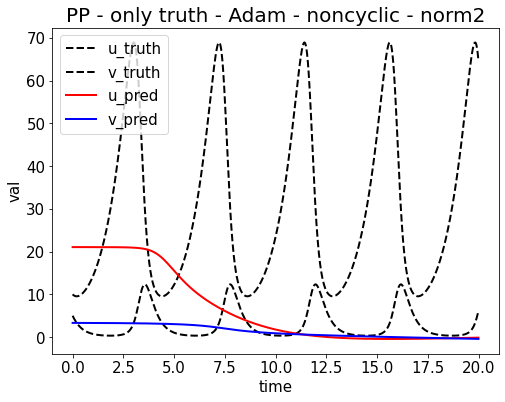

Saved as /content/drive/My Drive/Workspace/PINN//figure/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-04-01-51-42_1654307536.png


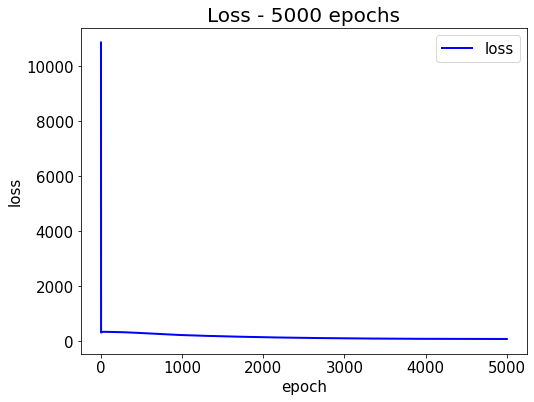

Epoch [06000/100000] Loss:85.657097 Loss_1:78.809288 Loss_2:6.463441 Loss_3:0.384371 Lr:0.000625 Time:7.621348s (0.68min in total, 10.67min remains)
Epoch [07000/100000] Loss:84.716698 Loss_1:78.370239 Loss_2:6.130323 Loss_3:0.216134 Lr:0.000588 Time:6.735825s (0.79min in total, 10.54min remains)
Epoch [08000/100000] Loss:83.649086 Loss_1:78.078987 Loss_2:5.526388 Loss_3:0.043706 Lr:0.000556 Time:6.645709s (0.90min in total, 10.40min remains)
Epoch [09000/100000] Loss:15.069969 Loss_1:10.357024 Loss_2:4.666119 Loss_3:0.046826 Lr:0.000526 Time:6.649163s (1.02min in total, 10.26min remains)
Epoch [10000/100000] Loss:6.240618 Loss_1:2.474323 Loss_2:3.715162 Loss_3:0.051133 Lr:0.000500 Time:6.675181s (1.13min in total, 10.14min remains)
Testing & drawing...
u= [8.787255, 8.815717, 8.844486, 8.873564, 8.902952, 8.932665, 8.962698, 8.993059, 9.023754, 9.054788] ... [0.6021911, 0.6020509, 0.6019106, 0.6017684, 0.60162723, 0.6014857, 0.601341, 0.60120094, 0.60105515, 0.6009121]
v= [2.4763582, 

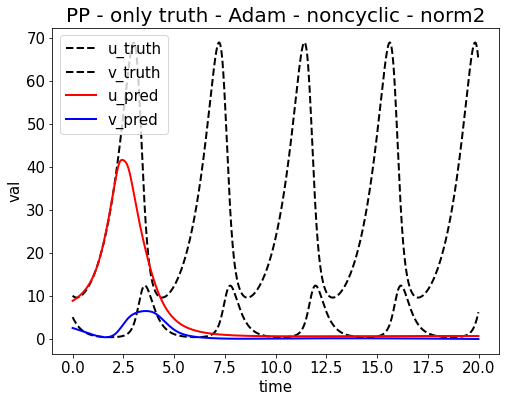

Saved as /content/drive/My Drive/Workspace/PINN//figure/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-04-01-51-42_1654307570.png


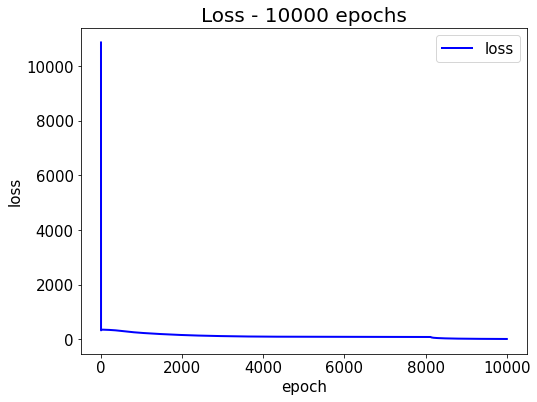

Epoch [11000/100000] Loss:3.944877 Loss_1:0.755832 Loss_2:3.135906 Loss_3:0.053138 Lr:0.000476 Time:7.650933s (1.25min in total, 10.14min remains)
Epoch [12000/100000] Loss:3.160412 Loss_1:0.333571 Loss_2:2.773834 Loss_3:0.053007 Lr:0.000455 Time:6.762784s (1.37min in total, 10.02min remains)
Epoch [13000/100000] Loss:940.950378 Loss_1:11.778698 Loss_2:929.171692 Loss_3:0.000000 Lr:0.000435 Time:6.663668s (1.48min in total, 9.89min remains)
Epoch [14000/100000] Loss:97.358696 Loss_1:6.731543 Loss_2:90.627151 Loss_3:0.000000 Lr:0.000417 Time:6.660889s (1.59min in total, 9.76min remains)
Epoch [15000/100000] Loss:16.588560 Loss_1:6.788568 Loss_2:9.799992 Loss_3:0.000000 Lr:0.000400 Time:6.623291s (1.70min in total, 9.63min remains)
Testing & drawing...
u= [8.075996, 8.127183, 8.17862, 8.230316, 8.282269, 8.3344755, 8.386951, 8.439704, 8.492727, 8.546035] ... [17.434616, 17.429073, 17.423542, 17.41803, 17.412525, 17.407032, 17.401552, 17.396088, 17.390633, 17.38519]
v= [2.623861, 2.591251

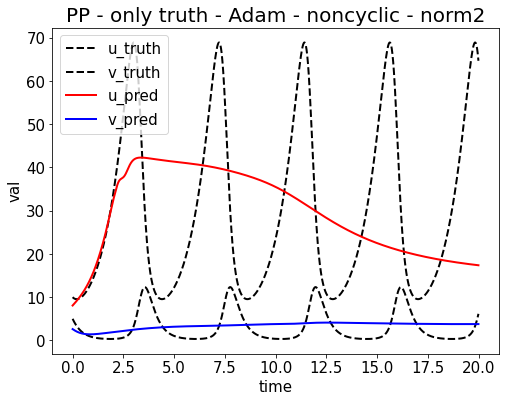

Saved as /content/drive/My Drive/Workspace/PINN//figure/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-04-01-51-42_1654307604.png


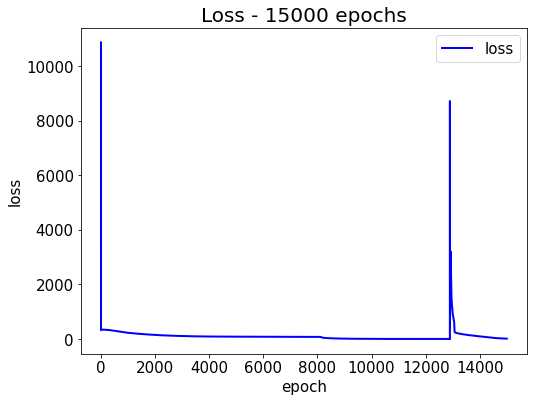

Epoch [16000/100000] Loss:9.342163 Loss_1:3.691499 Loss_2:5.650664 Loss_3:0.000000 Lr:0.000385 Time:7.708833s (1.83min in total, 9.59min remains)
Epoch [17000/100000] Loss:6.880390 Loss_1:2.855588 Loss_2:4.024802 Loss_3:0.000000 Lr:0.000370 Time:6.628120s (1.94min in total, 9.46min remains)
Epoch [18000/100000] Loss:5.802175 Loss_1:2.402083 Loss_2:3.400092 Loss_3:0.000000 Lr:0.000357 Time:6.613186s (2.05min in total, 9.33min remains)
Epoch [19000/100000] Loss:5.007923 Loss_1:2.044206 Loss_2:2.963717 Loss_3:0.000000 Lr:0.000345 Time:6.623863s (2.16min in total, 9.20min remains)
Epoch [20000/100000] Loss:4.297648 Loss_1:1.723072 Loss_2:2.574576 Loss_3:0.000000 Lr:0.000333 Time:6.592390s (2.27min in total, 9.07min remains)
Testing & drawing...
u= [8.368487, 8.40515, 8.442037, 8.479155, 8.516505, 8.554094, 8.591932, 8.630028, 8.668376, 8.706989] ... [30.483315, 30.48192, 30.48051, 30.479103, 30.477684, 30.476255, 30.474812, 30.473373, 30.47192, 30.470465]
v= [3.4448864, 3.4074104, 3.369121

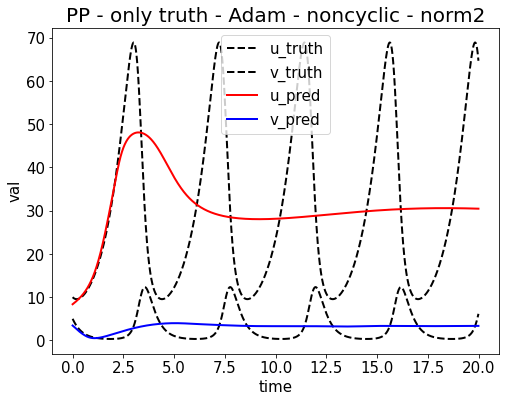

Saved as /content/drive/My Drive/Workspace/PINN//figure/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-04-01-51-42_1654307638.png


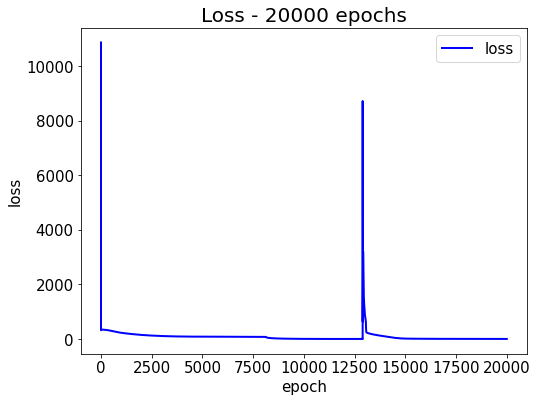

Epoch [21000/100000] Loss:3.619049 Loss_1:1.420106 Loss_2:2.198943 Loss_3:0.000000 Lr:0.000323 Time:7.619319s (2.40min in total, 9.01min remains)
Epoch [22000/100000] Loss:2.987238 Loss_1:1.142495 Loss_2:1.844743 Loss_3:0.000000 Lr:0.000313 Time:6.666149s (2.51min in total, 8.89min remains)
Epoch [23000/100000] Loss:2.433442 Loss_1:0.908701 Loss_2:1.524741 Loss_3:0.000000 Lr:0.000303 Time:6.744804s (2.62min in total, 8.77min remains)
Epoch [24000/100000] Loss:1.978548 Loss_1:0.726574 Loss_2:1.251974 Loss_3:0.000000 Lr:0.000294 Time:6.596684s (2.73min in total, 8.64min remains)
Epoch [25000/100000] Loss:1.584335 Loss_1:0.571513 Loss_2:1.012822 Loss_3:0.000000 Lr:0.000286 Time:6.653072s (2.84min in total, 8.52min remains)
Testing & drawing...
u= [9.159551, 9.179958, 9.20055, 9.221336, 9.242318, 9.263495, 9.2848835, 9.306487, 9.328311, 9.350364] ... [29.02108, 29.01702, 29.012947, 29.008886, 29.004816, 29.000751, 28.996683, 28.992615, 28.988544, 28.984474]
v= [3.8234136, 3.7797992, 3.7337

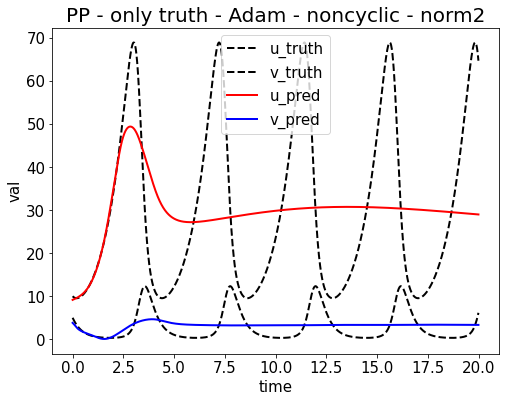

Saved as /content/drive/My Drive/Workspace/PINN//figure/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-04-01-51-42_1654307673.png


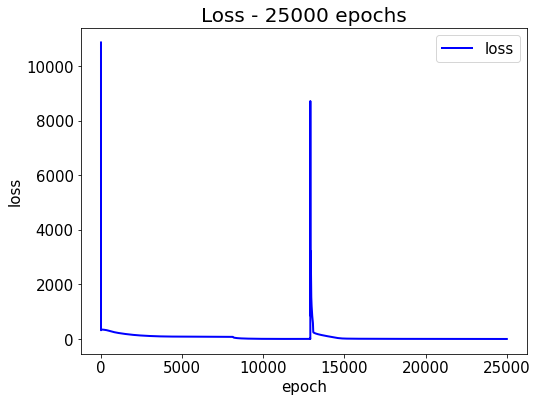

Epoch [26000/100000] Loss:1.192145 Loss_1:0.406556 Loss_2:0.785589 Loss_3:0.000000 Lr:0.000278 Time:7.647841s (2.97min in total, 8.45min remains)
Epoch [27000/100000] Loss:0.914607 Loss_1:0.297892 Loss_2:0.616715 Loss_3:0.000000 Lr:0.000270 Time:6.670004s (3.08min in total, 8.32min remains)
Epoch [28000/100000] Loss:0.734586 Loss_1:0.236259 Loss_2:0.498327 Loss_3:0.000000 Lr:0.000263 Time:6.652411s (3.19min in total, 8.20min remains)
Epoch [29000/100000] Loss:0.614983 Loss_1:0.195067 Loss_2:0.419916 Loss_3:0.000000 Lr:0.000256 Time:6.660652s (3.30min in total, 8.08min remains)
Epoch [30000/100000] Loss:0.511882 Loss_1:0.164194 Loss_2:0.347688 Loss_3:0.000000 Lr:0.000250 Time:6.858101s (3.41min in total, 7.97min remains)
Testing & drawing...
u= [9.947303, 9.912202, 9.878472, 9.846174, 9.815362, 9.786077, 9.758368, 9.732268, 9.707816, 9.685038] ... [30.309744, 30.30916, 30.308573, 30.307981, 30.307379, 30.306767, 30.306152, 30.30554, 30.304907, 30.304272]
v= [4.880118, 4.795494, 4.707343

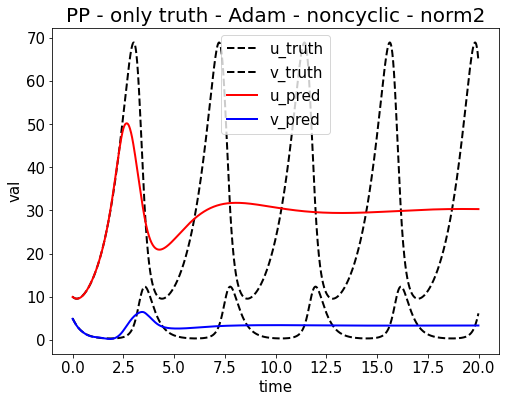

Saved as /content/drive/My Drive/Workspace/PINN//figure/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-04-01-51-42_1654307707.png


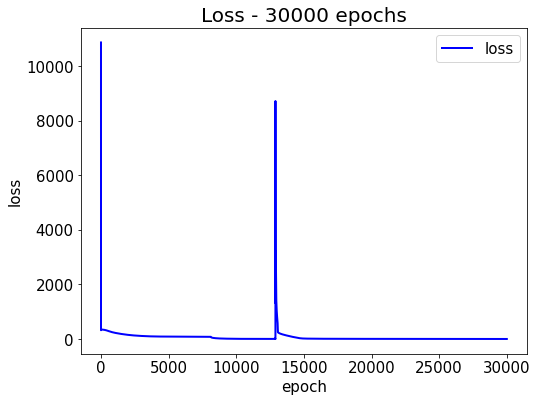

Epoch [31000/100000] Loss:0.407975 Loss_1:0.133218 Loss_2:0.274758 Loss_3:0.000000 Lr:0.000244 Time:7.613284s (3.54min in total, 7.88min remains)
Epoch [32000/100000] Loss:0.327976 Loss_1:0.101012 Loss_2:0.226964 Loss_3:0.000000 Lr:0.000238 Time:6.657565s (3.65min in total, 7.76min remains)
Epoch [33000/100000] Loss:0.286246 Loss_1:0.073241 Loss_2:0.213005 Loss_3:0.000000 Lr:0.000233 Time:6.700932s (3.76min in total, 7.64min remains)
Epoch [34000/100000] Loss:0.229592 Loss_1:0.051550 Loss_2:0.178042 Loss_3:0.000000 Lr:0.000227 Time:6.709625s (3.88min in total, 7.52min remains)
Epoch [35000/100000] Loss:0.199355 Loss_1:0.035473 Loss_2:0.163882 Loss_3:0.000000 Lr:0.000222 Time:6.742989s (3.99min in total, 7.41min remains)
Testing & drawing...
u= [9.9947605, 9.947747, 9.903499, 9.862015, 9.823296, 9.787333, 9.754103, 9.723574, 9.695711, 9.670469] ... [30.097971, 30.099457, 30.100958, 30.10248, 30.104013, 30.105572, 30.107153, 30.108742, 30.110357, 30.111982]
v= [4.970631, 4.877437, 4.7812

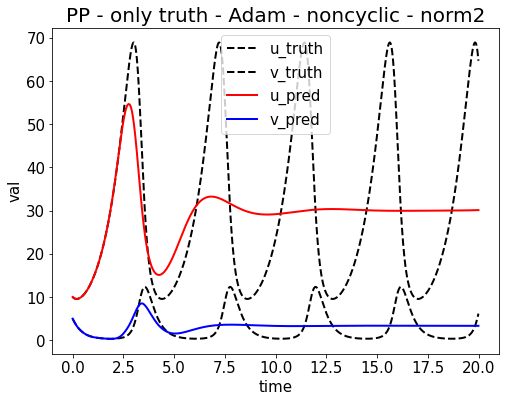

Saved as /content/drive/My Drive/Workspace/PINN//figure/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-04-01-51-42_1654307742.png


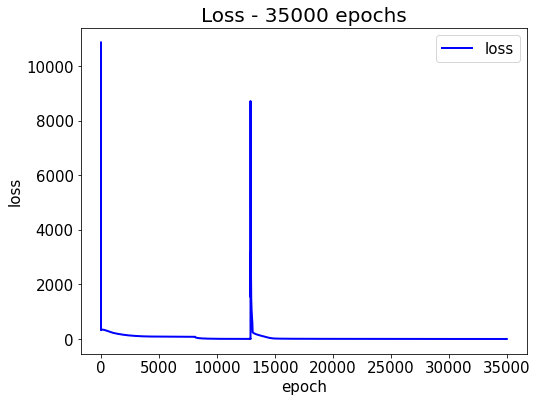

Epoch [36000/100000] Loss:0.177798 Loss_1:0.024897 Loss_2:0.152901 Loss_3:0.000000 Lr:0.000217 Time:7.636873s (4.12min in total, 7.32min remains)
Epoch [37000/100000] Loss:0.204106 Loss_1:0.018002 Loss_2:0.186104 Loss_3:0.000000 Lr:0.000213 Time:6.683095s (4.23min in total, 7.20min remains)
Epoch [38000/100000] Loss:0.159051 Loss_1:0.014074 Loss_2:0.144977 Loss_3:0.000000 Lr:0.000208 Time:6.694344s (4.34min in total, 7.08min remains)
Epoch [39000/100000] Loss:0.144323 Loss_1:0.010482 Loss_2:0.133841 Loss_3:0.000000 Lr:0.000204 Time:6.709568s (4.45min in total, 6.96min remains)
Epoch [40000/100000] Loss:0.141718 Loss_1:0.008438 Loss_2:0.133279 Loss_3:0.000000 Lr:0.000200 Time:6.651911s (4.56min in total, 6.84min remains)
Testing & drawing...
u= [10.018574, 9.970849, 9.925822, 9.883519, 9.843957, 9.807148, 9.773086, 9.741737, 9.713095, 9.687123] ... [29.85881, 29.856642, 29.854485, 29.852308, 29.850132, 29.847948, 29.845764, 29.843578, 29.841393, 29.839205]
v= [4.990162, 4.893009, 4.7950

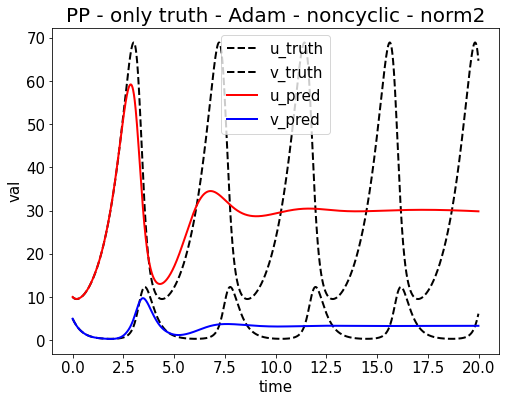

Saved as /content/drive/My Drive/Workspace/PINN//figure/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-04-01-51-42_1654307776.png


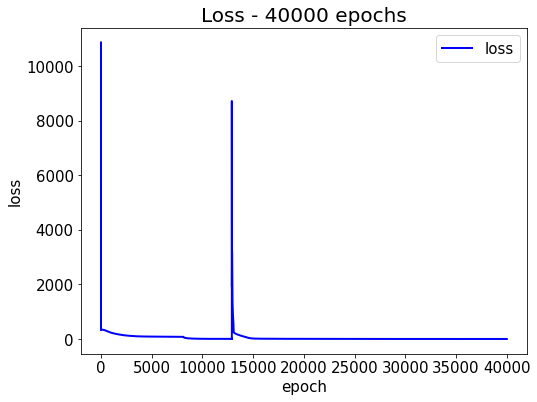

Epoch [41000/100000] Loss:0.410835 Loss_1:0.016462 Loss_2:0.394372 Loss_3:0.000000 Lr:0.000196 Time:7.688094s (4.69min in total, 6.75min remains)
Epoch [42000/100000] Loss:0.131757 Loss_1:0.006434 Loss_2:0.125322 Loss_3:0.000000 Lr:0.000192 Time:6.756304s (4.80min in total, 6.63min remains)
Epoch [43000/100000] Loss:0.130730 Loss_1:0.005714 Loss_2:0.125016 Loss_3:0.000000 Lr:0.000189 Time:6.739122s (4.91min in total, 6.51min remains)
Epoch [44000/100000] Loss:0.249792 Loss_1:0.008659 Loss_2:0.241133 Loss_3:0.000000 Lr:0.000185 Time:6.732182s (5.03min in total, 6.40min remains)
Epoch [45000/100000] Loss:0.124813 Loss_1:0.005064 Loss_2:0.119749 Loss_3:0.000000 Lr:0.000182 Time:6.673969s (5.14min in total, 6.28min remains)
Testing & drawing...
u= [9.998711, 9.951129, 9.90617, 9.863878, 9.82428, 9.787375, 9.75317, 9.721661, 9.692825, 9.666631] ... [29.95897, 29.960546, 29.962164, 29.96379, 29.965454, 29.967146, 29.968851, 29.970585, 29.972359, 29.974148]
v= [4.9982886, 4.899855, 4.8018885,

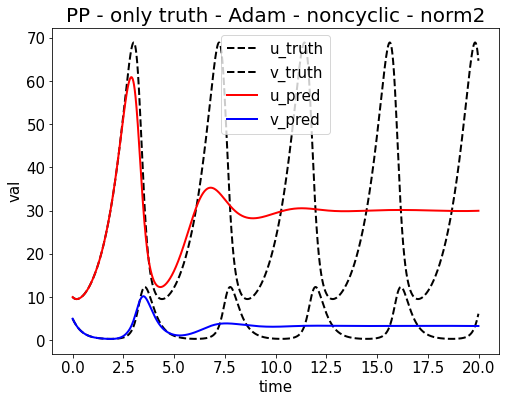

Saved as /content/drive/My Drive/Workspace/PINN//figure/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-04-01-51-42_1654307811.png


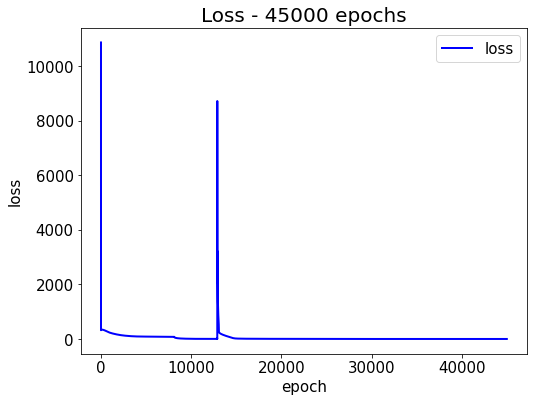

Epoch [46000/100000] Loss:0.121504 Loss_1:0.004636 Loss_2:0.116868 Loss_3:0.000000 Lr:0.000179 Time:7.671524s (5.27min in total, 6.18min remains)
Epoch [47000/100000] Loss:0.118879 Loss_1:0.004331 Loss_2:0.114548 Loss_3:0.000000 Lr:0.000175 Time:6.666886s (5.38min in total, 6.06min remains)
Epoch [48000/100000] Loss:0.118642 Loss_1:0.004250 Loss_2:0.114392 Loss_3:0.000000 Lr:0.000172 Time:6.715343s (5.49min in total, 5.95min remains)
Epoch [49000/100000] Loss:0.115545 Loss_1:0.003936 Loss_2:0.111610 Loss_3:0.000000 Lr:0.000169 Time:6.660452s (5.60min in total, 5.83min remains)
Epoch [50000/100000] Loss:0.114117 Loss_1:0.003816 Loss_2:0.110301 Loss_3:0.000000 Lr:0.000167 Time:6.634610s (5.71min in total, 5.71min remains)
Testing & drawing...
u= [10.00204, 9.954294, 9.909215, 9.866834, 9.827181, 9.790249, 9.756037, 9.724528, 9.695702, 9.669525] ... [30.051477, 30.055414, 30.059402, 30.063427, 30.067486, 30.071575, 30.075708, 30.079893, 30.084105, 30.088356]
v= [4.998333, 4.899322, 4.8013

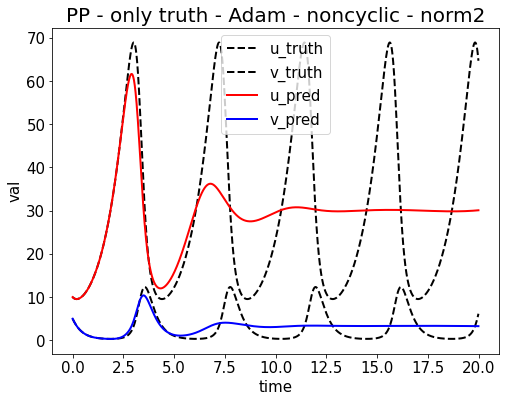

Saved as /content/drive/My Drive/Workspace/PINN//figure/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-04-01-51-42_1654307845.png


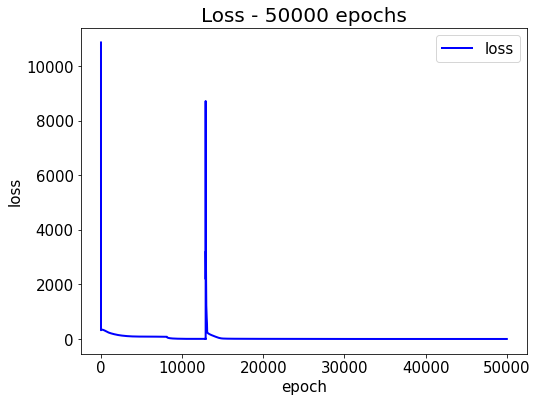

Epoch [51000/100000] Loss:0.112762 Loss_1:0.003703 Loss_2:0.109059 Loss_3:0.000000 Lr:0.000164 Time:7.840679s (5.84min in total, 5.61min remains)
Epoch [52000/100000] Loss:0.111404 Loss_1:0.003579 Loss_2:0.107824 Loss_3:0.000000 Lr:0.000161 Time:6.664883s (5.95min in total, 5.49min remains)
Epoch [53000/100000] Loss:0.222798 Loss_1:0.004209 Loss_2:0.218590 Loss_3:0.000000 Lr:0.000159 Time:6.849849s (6.07min in total, 5.38min remains)
Epoch [54000/100000] Loss:0.108984 Loss_1:0.003432 Loss_2:0.105552 Loss_3:0.000000 Lr:0.000156 Time:6.668063s (6.18min in total, 5.26min remains)
Epoch [55000/100000] Loss:0.109274 Loss_1:0.003190 Loss_2:0.106084 Loss_3:0.000000 Lr:0.000154 Time:6.656677s (6.29min in total, 5.15min remains)
Testing & drawing...
u= [9.99867, 9.9509945, 9.9060335, 9.863806, 9.8243265, 9.78759, 9.753588, 9.722296, 9.693688, 9.667728] ... [30.133926, 30.139212, 30.144543, 30.149918, 30.15534, 30.160814, 30.16634, 30.171902, 30.177502, 30.183172]
v= [4.9997416, 4.900649, 4.8030

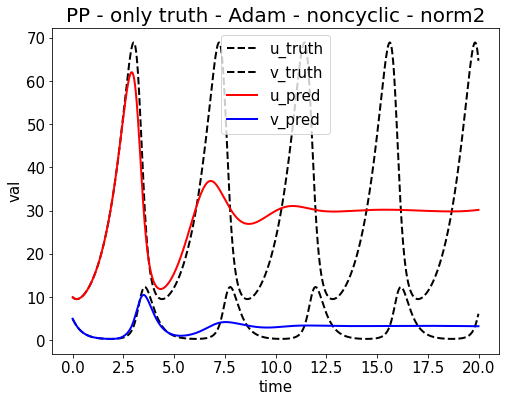

Saved as /content/drive/My Drive/Workspace/PINN//figure/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-04-01-51-42_1654307880.png


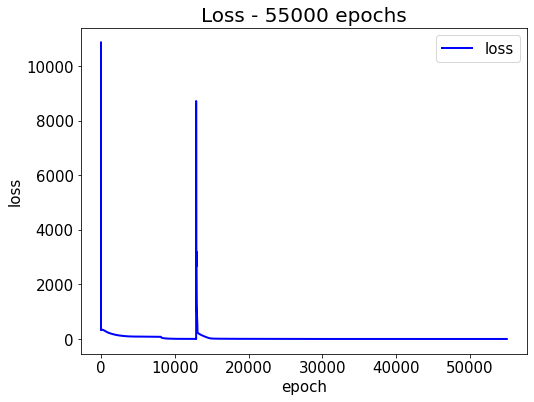

Epoch [56000/100000] Loss:0.106530 Loss_1:0.003210 Loss_2:0.103320 Loss_3:0.000000 Lr:0.000152 Time:7.653463s (6.42min in total, 5.04min remains)
Epoch [57000/100000] Loss:0.104668 Loss_1:0.003058 Loss_2:0.101610 Loss_3:0.000000 Lr:0.000149 Time:6.710739s (6.53min in total, 4.92min remains)
Epoch [58000/100000] Loss:0.111369 Loss_1:0.003732 Loss_2:0.107637 Loss_3:0.000000 Lr:0.000147 Time:6.710418s (6.64min in total, 4.81min remains)
Epoch [59000/100000] Loss:0.107900 Loss_1:0.003128 Loss_2:0.104772 Loss_3:0.000000 Lr:0.000145 Time:6.660239s (6.75min in total, 4.69min remains)
Epoch [60000/100000] Loss:0.100104 Loss_1:0.002845 Loss_2:0.097259 Loss_3:0.000000 Lr:0.000143 Time:6.651829s (6.86min in total, 4.57min remains)
Testing & drawing...
u= [10.001, 9.953162, 9.908043, 9.865665, 9.82604, 9.789169, 9.75503, 9.723603, 9.69486, 9.668767] ... [30.119753, 30.124327, 30.128933, 30.133585, 30.138283, 30.143013, 30.147808, 30.152632, 30.1575, 30.162413]
v= [4.9987803, 4.8993034, 4.8015633, 

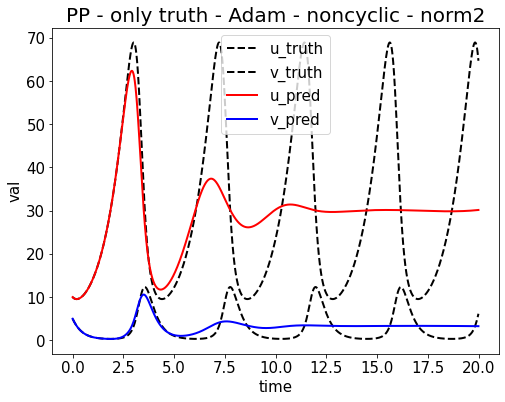

Saved as /content/drive/My Drive/Workspace/PINN//figure/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-04-01-51-42_1654307914.png


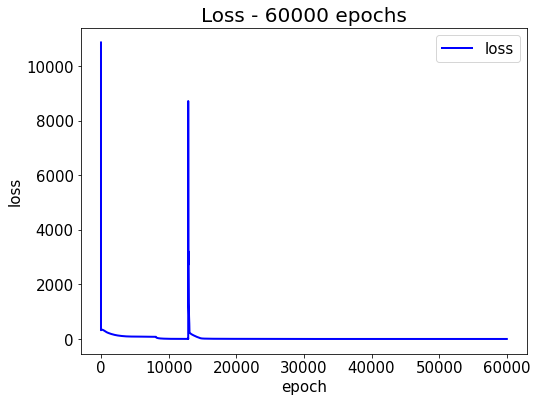

Epoch [61000/100000] Loss:0.098391 Loss_1:0.002761 Loss_2:0.095630 Loss_3:0.000000 Lr:0.000141 Time:7.638917s (6.99min in total, 4.47min remains)
Epoch [62000/100000] Loss:0.096759 Loss_1:0.002894 Loss_2:0.093866 Loss_3:0.000000 Lr:0.000139 Time:6.725880s (7.10min in total, 4.35min remains)
Epoch [63000/100000] Loss:0.097579 Loss_1:0.002734 Loss_2:0.094846 Loss_3:0.000000 Lr:0.000137 Time:6.611115s (7.21min in total, 4.24min remains)
Epoch [64000/100000] Loss:0.093096 Loss_1:0.002602 Loss_2:0.090494 Loss_3:0.000000 Lr:0.000135 Time:6.612271s (7.32min in total, 4.12min remains)
Epoch [65000/100000] Loss:0.092101 Loss_1:0.002547 Loss_2:0.089554 Loss_3:0.000000 Lr:0.000133 Time:6.629761s (7.43min in total, 4.00min remains)
Testing & drawing...
u= [10.001162, 9.953532, 9.908613, 9.866419, 9.826963, 9.790246, 9.75625, 9.724949, 9.696323, 9.67033] ... [30.00158, 30.003038, 30.004538, 30.006046, 30.00759, 30.009148, 30.01075, 30.012377, 30.014025, 30.015707]
v= [5.0005393, 4.901108, 4.803585,

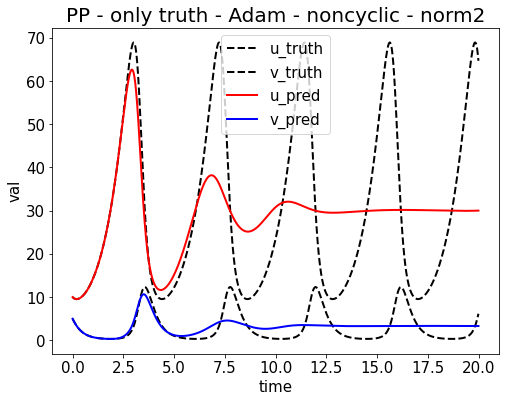

Saved as /content/drive/My Drive/Workspace/PINN//figure/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-04-01-51-42_1654307948.png


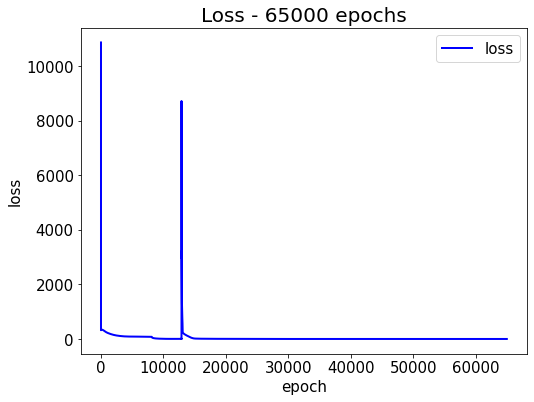

Epoch [66000/100000] Loss:0.091094 Loss_1:0.002469 Loss_2:0.088625 Loss_3:0.000000 Lr:0.000132 Time:7.764303s (7.56min in total, 3.90min remains)
Epoch [67000/100000] Loss:0.089511 Loss_1:0.002449 Loss_2:0.087062 Loss_3:0.000000 Lr:0.000130 Time:6.673832s (7.67min in total, 3.78min remains)
Epoch [68000/100000] Loss:0.319157 Loss_1:0.010965 Loss_2:0.308191 Loss_3:0.000000 Lr:0.000128 Time:6.663045s (7.78min in total, 3.66min remains)
Epoch [69000/100000] Loss:0.087241 Loss_1:0.002293 Loss_2:0.084948 Loss_3:0.000000 Lr:0.000127 Time:6.661361s (7.89min in total, 3.55min remains)
Epoch [70000/100000] Loss:0.097595 Loss_1:0.002386 Loss_2:0.095209 Loss_3:0.000000 Lr:0.000125 Time:6.730035s (8.01min in total, 3.43min remains)
Testing & drawing...
u= [10.012177, 9.964114, 9.91875, 9.876103, 9.836199, 9.799027, 9.764568, 9.732809, 9.70372, 9.677271] ... [29.890942, 29.892189, 29.893463, 29.894756, 29.896078, 29.89744, 29.898834, 29.900244, 29.901678, 29.90315]
v= [4.993651, 4.8935323, 4.795446

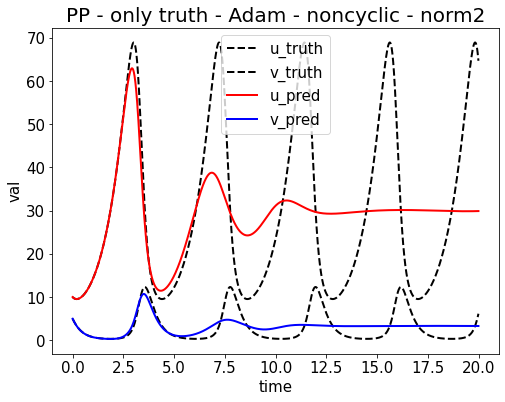

Saved as /content/drive/My Drive/Workspace/PINN//figure/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-04-01-51-42_1654307983.png


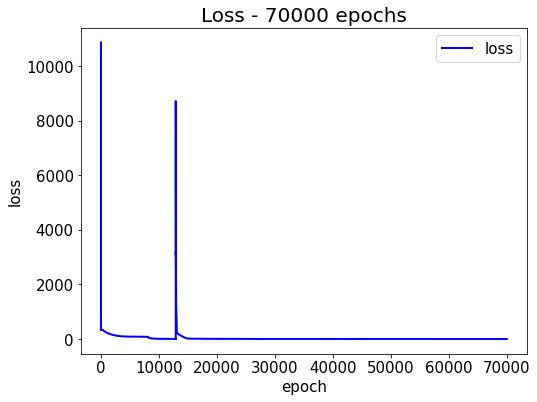

Epoch [71000/100000] Loss:0.086228 Loss_1:0.002212 Loss_2:0.084015 Loss_3:0.000000 Lr:0.000123 Time:7.696601s (8.13min in total, 3.32min remains)
Epoch [72000/100000] Loss:0.099812 Loss_1:0.002654 Loss_2:0.097158 Loss_3:0.000000 Lr:0.000122 Time:6.639612s (8.25min in total, 3.21min remains)
Epoch [73000/100000] Loss:0.084385 Loss_1:0.002112 Loss_2:0.082272 Loss_3:0.000000 Lr:0.000120 Time:6.635225s (8.36min in total, 3.09min remains)
Epoch [74000/100000] Loss:0.083821 Loss_1:0.002067 Loss_2:0.081755 Loss_3:0.000000 Lr:0.000119 Time:6.593253s (8.47min in total, 2.97min remains)
Epoch [75000/100000] Loss:0.088297 Loss_1:0.002203 Loss_2:0.086094 Loss_3:0.000000 Lr:0.000118 Time:6.678279s (8.58min in total, 2.86min remains)
Testing & drawing...
u= [10.013049, 9.965304, 9.920282, 9.8779955, 9.838455, 9.801651, 9.7675705, 9.736184, 9.707466, 9.681375] ... [29.94673, 29.948618, 29.950542, 29.95251, 29.954498, 29.95653, 29.958582, 29.960678, 29.962795, 29.964945]
v= [4.9946604, 4.895089, 4.797

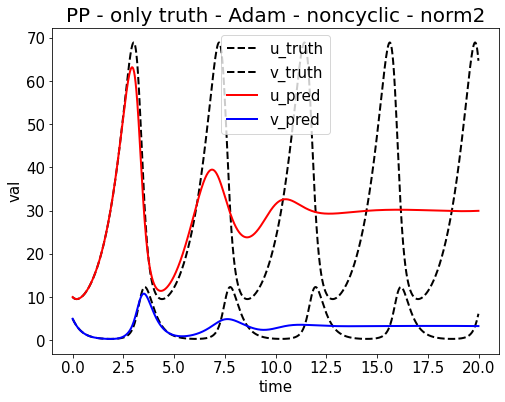

Saved as /content/drive/My Drive/Workspace/PINN//figure/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-04-01-51-42_1654308017.png


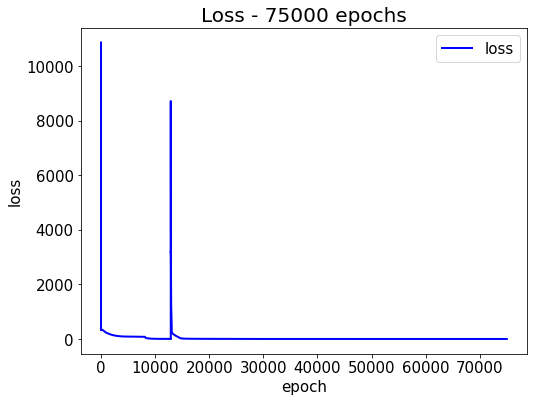

Epoch [76000/100000] Loss:0.128398 Loss_1:0.002465 Loss_2:0.125932 Loss_3:0.000000 Lr:0.000116 Time:7.819322s (8.71min in total, 2.75min remains)
Epoch [77000/100000] Loss:0.082413 Loss_1:0.001945 Loss_2:0.080468 Loss_3:0.000000 Lr:0.000115 Time:6.660420s (8.82min in total, 2.63min remains)
Epoch [78000/100000] Loss:0.082017 Loss_1:0.001906 Loss_2:0.080110 Loss_3:0.000000 Lr:0.000114 Time:6.633268s (8.93min in total, 2.52min remains)
Epoch [79000/100000] Loss:0.098579 Loss_1:0.002499 Loss_2:0.096080 Loss_3:0.000000 Lr:0.000112 Time:6.642586s (9.04min in total, 2.40min remains)
Epoch [80000/100000] Loss:0.081388 Loss_1:0.001848 Loss_2:0.079540 Loss_3:0.000000 Lr:0.000111 Time:6.738513s (9.15min in total, 2.29min remains)
Testing & drawing...
u= [10.002893, 9.955128, 9.910102, 9.867836, 9.828318, 9.791546, 9.757497, 9.726154, 9.697473, 9.671421] ... [29.967602, 29.969988, 29.972412, 29.974867, 29.977346, 29.979868, 29.982433, 29.985037, 29.98767, 29.990337]
v= [4.998345, 4.8987465, 4.801

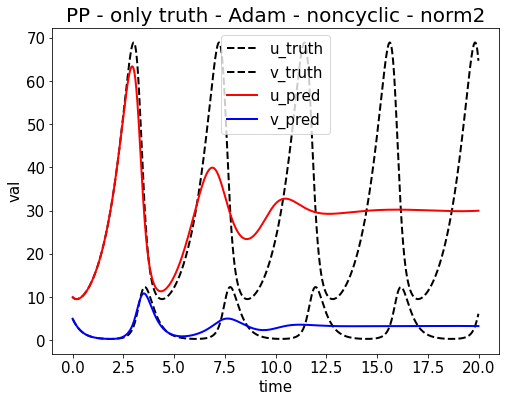

Saved as /content/drive/My Drive/Workspace/PINN//figure/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-04-01-51-42_1654308051.png


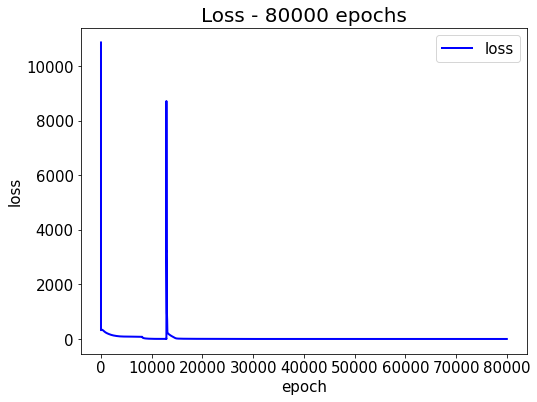

Epoch [81000/100000] Loss:0.082253 Loss_1:0.001856 Loss_2:0.080397 Loss_3:0.000000 Lr:0.000110 Time:7.744598s (9.28min in total, 2.18min remains)
Epoch [82000/100000] Loss:0.080664 Loss_1:0.001784 Loss_2:0.078880 Loss_3:0.000000 Lr:0.000109 Time:6.664651s (9.39min in total, 2.06min remains)
Epoch [83000/100000] Loss:0.082135 Loss_1:0.001756 Loss_2:0.080379 Loss_3:0.000000 Lr:0.000108 Time:6.635937s (9.50min in total, 1.95min remains)
Epoch [84000/100000] Loss:0.081260 Loss_1:0.001825 Loss_2:0.079435 Loss_3:0.000000 Lr:0.000106 Time:6.686863s (9.61min in total, 1.83min remains)
Epoch [85000/100000] Loss:0.079860 Loss_1:0.001707 Loss_2:0.078152 Loss_3:0.000000 Lr:0.000105 Time:6.673913s (9.73min in total, 1.72min remains)
Testing & drawing...
u= [10.000787, 9.952977, 9.907925, 9.865637, 9.826115, 9.789345, 9.755307, 9.723973, 9.69531, 9.669267] ... [29.970503, 29.97314, 29.975817, 29.978525, 29.981266, 29.984058, 29.986883, 29.989744, 29.992643, 29.995588]
v= [4.99875, 4.8991647, 4.80161

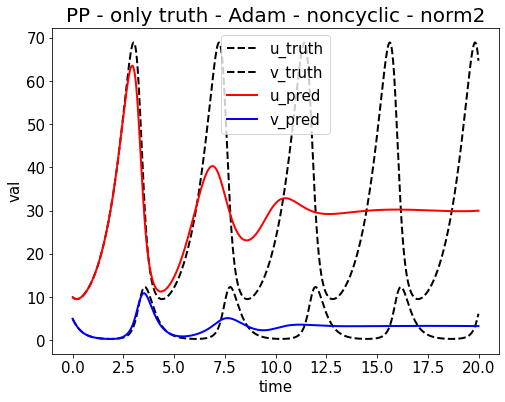

Saved as /content/drive/My Drive/Workspace/PINN//figure/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-04-01-51-42_1654308086.png


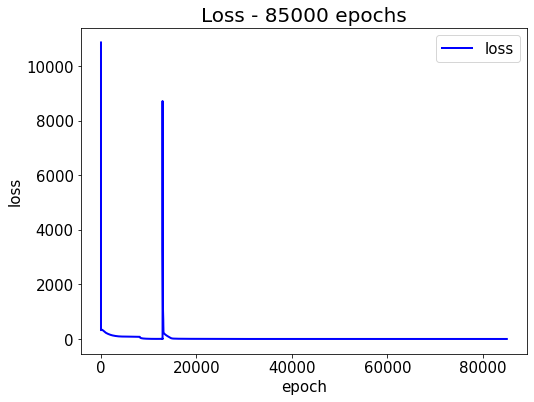

Epoch [86000/100000] Loss:0.079611 Loss_1:0.001672 Loss_2:0.077939 Loss_3:0.000000 Lr:0.000104 Time:7.705999s (9.85min in total, 1.60min remains)
Epoch [87000/100000] Loss:0.080122 Loss_1:0.001710 Loss_2:0.078411 Loss_3:0.000000 Lr:0.000103 Time:6.700418s (9.97min in total, 1.49min remains)
Epoch [88000/100000] Loss:0.079384 Loss_1:0.001654 Loss_2:0.077729 Loss_3:0.000000 Lr:0.000102 Time:6.670441s (10.08min in total, 1.37min remains)
Epoch [89000/100000] Loss:0.079621 Loss_1:0.001662 Loss_2:0.077959 Loss_3:0.000000 Lr:0.000101 Time:6.728897s (10.19min in total, 1.26min remains)
Epoch [90000/100000] Loss:0.082917 Loss_1:0.001723 Loss_2:0.081195 Loss_3:0.000000 Lr:0.000100 Time:6.641317s (10.30min in total, 1.14min remains)
Testing & drawing...
u= [9.994428, 9.94662, 9.901593, 9.859336, 9.819861, 9.78314, 9.74916, 9.717884, 9.689274, 9.663302] ... [29.985275, 29.988132, 29.991009, 29.99393, 29.996895, 29.9999, 30.002949, 30.006023, 30.009142, 30.012314]
v= [4.998141, 4.898675, 4.8012433

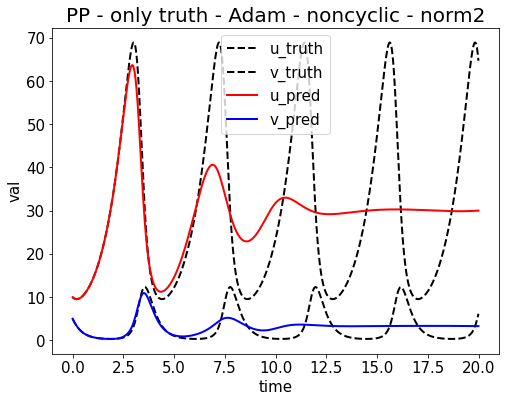

Saved as /content/drive/My Drive/Workspace/PINN//figure/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-04-01-51-42_1654308120.png


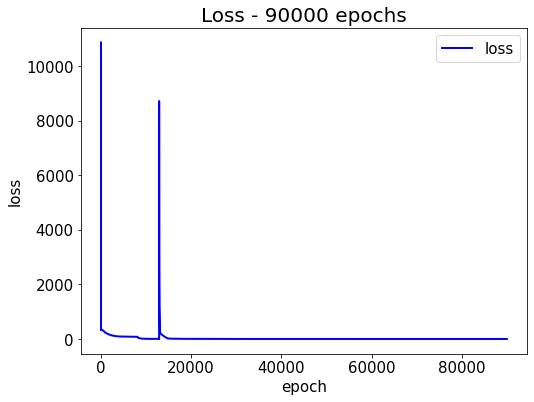

Epoch [91000/100000] Loss:0.078494 Loss_1:0.001570 Loss_2:0.076923 Loss_3:0.000000 Lr:0.000099 Time:7.692251s (10.43min in total, 1.03min remains)
Epoch [92000/100000] Loss:0.078251 Loss_1:0.001552 Loss_2:0.076699 Loss_3:0.000000 Lr:0.000098 Time:6.643363s (10.54min in total, 0.92min remains)
Epoch [93000/100000] Loss:0.082187 Loss_1:0.001681 Loss_2:0.080506 Loss_3:0.000000 Lr:0.000097 Time:6.743612s (10.65min in total, 0.80min remains)
Epoch [94000/100000] Loss:0.077897 Loss_1:0.001530 Loss_2:0.076367 Loss_3:0.000000 Lr:0.000096 Time:6.718470s (10.76min in total, 0.69min remains)
Epoch [95000/100000] Loss:0.077661 Loss_1:0.001505 Loss_2:0.076156 Loss_3:0.000000 Lr:0.000095 Time:6.622227s (10.87min in total, 0.57min remains)
Testing & drawing...
u= [10.000973, 9.95311, 9.908029, 9.865728, 9.826213, 9.789459, 9.755438, 9.724124, 9.695479, 9.669466] ... [29.96794, 29.971151, 29.974422, 29.977716, 29.981058, 29.984442, 29.987865, 29.991331, 29.994835, 29.998373]
v= [4.9985557, 4.898971, 4

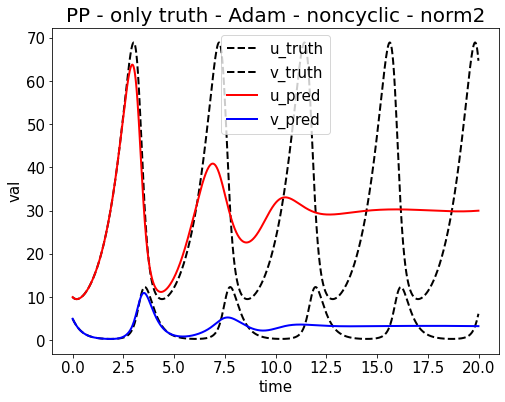

Saved as /content/drive/My Drive/Workspace/PINN//figure/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-04-01-51-42_1654308155.png


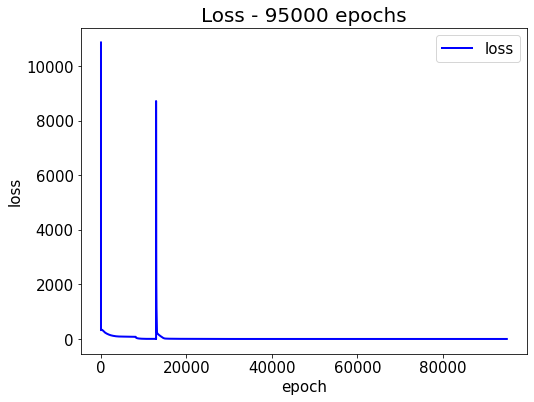

Epoch [96000/100000] Loss:0.077454 Loss_1:0.001485 Loss_2:0.075968 Loss_3:0.000000 Lr:0.000094 Time:7.802256s (11.00min in total, 0.46min remains)
Epoch [97000/100000] Loss:0.083171 Loss_1:0.001678 Loss_2:0.081493 Loss_3:0.000000 Lr:0.000093 Time:6.620003s (11.11min in total, 0.34min remains)
Epoch [98000/100000] Loss:0.077001 Loss_1:0.001451 Loss_2:0.075550 Loss_3:0.000000 Lr:0.000093 Time:6.666634s (11.23min in total, 0.23min remains)
Epoch [99000/100000] Loss:0.077734 Loss_1:0.001426 Loss_2:0.076308 Loss_3:0.000000 Lr:0.000092 Time:6.782216s (11.34min in total, 0.11min remains)
Epoch [100000/100000] Loss:0.076506 Loss_1:0.001413 Loss_2:0.075093 Loss_3:0.000000 Lr:0.000091 Time:6.636554s (11.45min in total, 0.00min remains)
Testing & drawing...
u= [10.0009, 9.953029, 9.907947, 9.865655, 9.826149, 9.789406, 9.755403, 9.724104, 9.695485, 9.669487] ... [29.975304, 29.978783, 29.982286, 29.985847, 29.989443, 29.993092, 29.996765, 30.000475, 30.004229, 30.008049]
v= [4.998805, 4.8992157, 

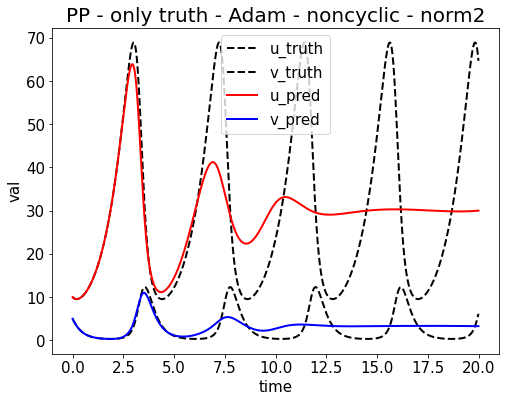

Saved as /content/drive/My Drive/Workspace/PINN//figure/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-04-01-51-42_1654308189.png


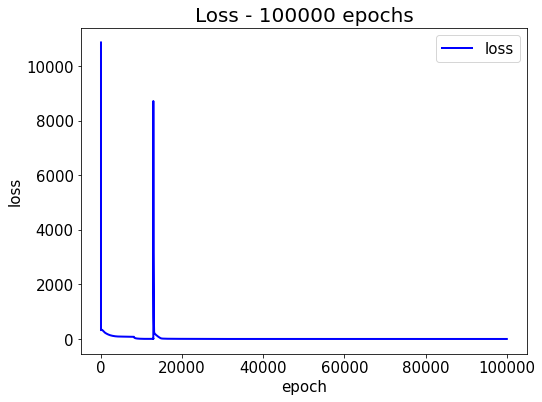

tensor board path: /content/drive/My Drive/Workspace/PINN//board/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-04-01-51-42_board
%load_ext tensorboard
%tensorboard --logdir=/content/drive/My\ Drive/Workspace/PINN//board/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-04-01-51-42_board


In [ ]:
# PP - 0.125 truth + loss2 + loss3
main_path = '/content/drive/My Drive/Workspace/PINN/' # ENZE marked: you need to change your main_path if it's not here
run_pp_truth(main_path)

continue_id = None: [0, 20.0] is mapped to [[-1. -1.], [0.999 0.999]]
using cuda
epoch = 100000
epoch_step = 1000
model_name = SimpleNetworkPP_Truth
now_string = 2022-06-04-00-28-49
model_save_path_last = /content/drive/My Drive/Workspace/PINN//train/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-04-00-28-49_last.pt
model_save_path_best = /content/drive/My Drive/Workspace/PINN//train/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-04-00-28-49_best.pt
loss_save_path = /content/drive/My Drive/Workspace/PINN//loss/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-04-00-28-49_loss_100000.npy
args = {'epoch': 100000, 'epoch_step': 1000, 'lr': 0.001, 'main_path': '/content/drive/My Drive/Workspace/PINN/', 'save_step': 5000}
config = {'model_name': 'SimpleNetworkPP_Truth', 'T': 20.0, 'T_all': 20.0, 'T_unit': 0.01, 'N': 2000, 'U_start': 10.0, 'V_start': 5.0, 'alpha': 1.0, 'beta': 3.0, 'gamma': 0.3, 'e': 0.333, 'ub': 20.0, 'lb': 0.0, 'continue_period': 0.2, 'round_bit': 3, 'continue_id': None, '

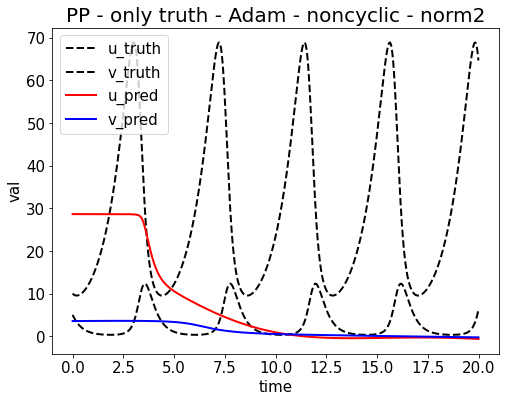

Saved as /content/drive/My Drive/Workspace/PINN//figure/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-04-00-28-49_1654302562.png


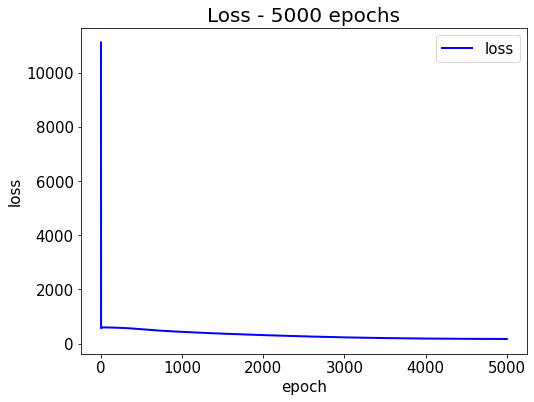

Epoch [06000/100000] Loss:165.280579 Loss_1:156.913666 Loss_2:8.308961 Loss_3:0.057953 Lr:0.000625 Time:7.854034s (0.69min in total, 10.79min remains)
Epoch [07000/100000] Loss:160.141251 Loss_1:154.153702 Loss_2:5.923225 Loss_3:0.064335 Lr:0.000588 Time:6.666482s (0.80min in total, 10.63min remains)
Epoch [08000/100000] Loss:156.442047 Loss_1:152.027695 Loss_2:4.364321 Loss_3:0.050035 Lr:0.000556 Time:6.694473s (0.91min in total, 10.48min remains)
Epoch [09000/100000] Loss:117.257469 Loss_1:113.063286 Loss_2:4.194180 Loss_3:0.000000 Lr:0.000526 Time:6.779532s (1.02min in total, 10.36min remains)
Epoch [10000/100000] Loss:45.170895 Loss_1:41.093925 Loss_2:4.076970 Loss_3:0.000000 Lr:0.000500 Time:6.641835s (1.14min in total, 10.22min remains)
Testing & drawing...
u= [16.918793, 16.922945, 16.927149, 16.931398, 16.935701, 16.940054, 16.944458, 16.948915, 16.953432, 16.958002] ... [30.535196, 30.534376, 30.53356, 30.532745, 30.531927, 30.531105, 30.530293, 30.529478, 30.52866, 30.527847]

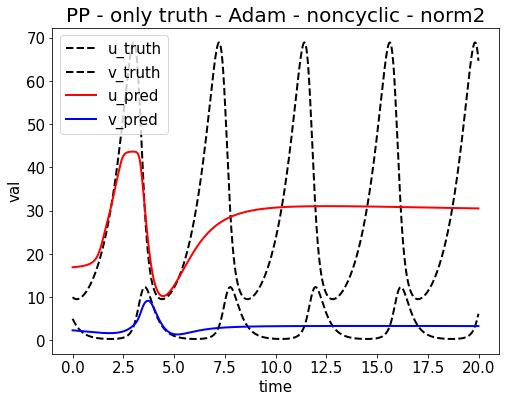

Saved as /content/drive/My Drive/Workspace/PINN//figure/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-04-00-28-49_1654302597.png


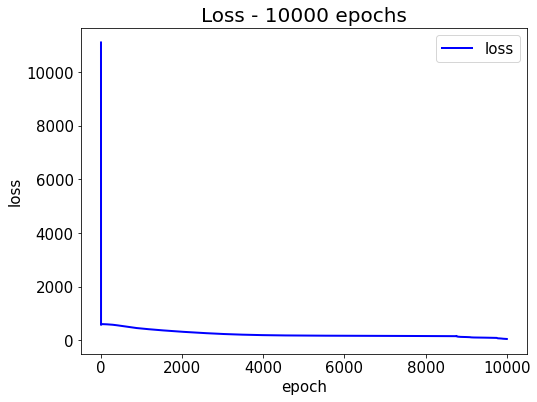

Epoch [11000/100000] Loss:7.576736 Loss_1:6.116715 Loss_2:1.460021 Loss_3:0.000000 Lr:0.000476 Time:7.663460s (1.26min in total, 10.22min remains)
Epoch [12000/100000] Loss:2.065975 Loss_1:1.279773 Loss_2:0.786202 Loss_3:0.000000 Lr:0.000455 Time:6.635937s (1.37min in total, 10.07min remains)
Epoch [13000/100000] Loss:0.506426 Loss_1:0.152013 Loss_2:0.354413 Loss_3:0.000000 Lr:0.000435 Time:6.672948s (1.48min in total, 9.94min remains)
Epoch [14000/100000] Loss:0.280709 Loss_1:0.027680 Loss_2:0.253029 Loss_3:0.000000 Lr:0.000417 Time:6.879367s (1.60min in total, 9.83min remains)
Epoch [15000/100000] Loss:0.237592 Loss_1:0.016595 Loss_2:0.220997 Loss_3:0.000000 Lr:0.000400 Time:6.687155s (1.71min in total, 9.70min remains)
Testing & drawing...
u= [9.354434, 9.3612585, 9.368334, 9.375674, 9.383288, 9.3911915, 9.399395, 9.407913, 9.416762, 9.425957] ... [30.451454, 30.452765, 30.454077, 30.455381, 30.456692, 30.457998, 30.459305, 30.460615, 30.461922, 30.463226]
v= [3.9750388, 3.919479, 3

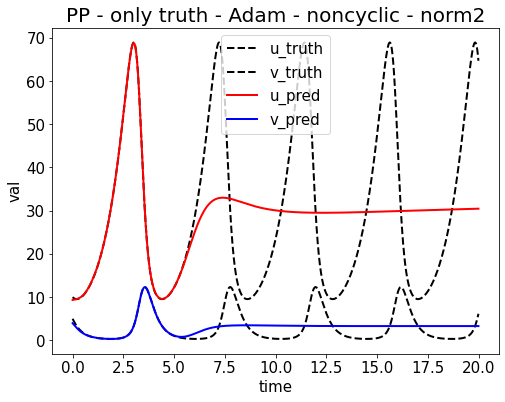

Saved as /content/drive/My Drive/Workspace/PINN//figure/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-04-00-28-49_1654302631.png


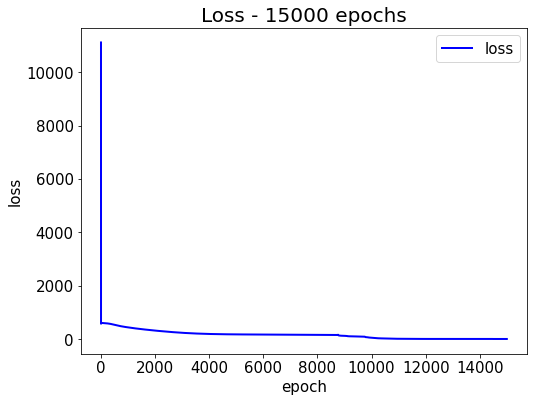

Epoch [16000/100000] Loss:0.220194 Loss_1:0.014228 Loss_2:0.205966 Loss_3:0.000000 Lr:0.000385 Time:7.773792s (1.84min in total, 9.66min remains)
Epoch [17000/100000] Loss:0.208667 Loss_1:0.012783 Loss_2:0.195884 Loss_3:0.000000 Lr:0.000370 Time:6.731578s (1.95min in total, 9.53min remains)
Epoch [18000/100000] Loss:0.199250 Loss_1:0.011865 Loss_2:0.187384 Loss_3:0.000000 Lr:0.000357 Time:6.768155s (2.07min in total, 9.41min remains)
Epoch [19000/100000] Loss:0.190825 Loss_1:0.011193 Loss_2:0.179632 Loss_3:0.000000 Lr:0.000345 Time:6.718760s (2.18min in total, 9.28min remains)
Epoch [20000/100000] Loss:0.182981 Loss_1:0.010625 Loss_2:0.172355 Loss_3:0.000000 Lr:0.000333 Time:6.683378s (2.29min in total, 9.16min remains)
Testing & drawing...
u= [9.396746, 9.398873, 9.401127, 9.4035225, 9.406072, 9.408791, 9.411694, 9.414803, 9.4181385, 9.42172] ... [29.964603, 29.964182, 29.963758, 29.96334, 29.96292, 29.9625, 29.96208, 29.961658, 29.961246, 29.960821]
v= [4.310628, 4.2379336, 4.1653166

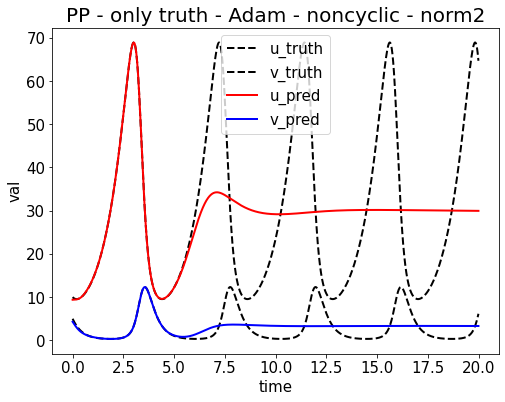

Saved as /content/drive/My Drive/Workspace/PINN//figure/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-04-00-28-49_1654302666.png


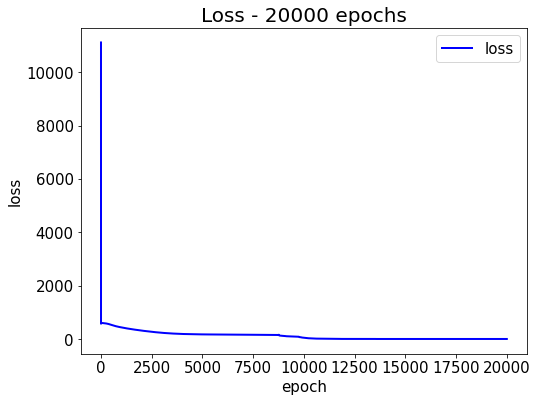

Epoch [21000/100000] Loss:0.450681 Loss_1:0.033301 Loss_2:0.417379 Loss_3:0.000000 Lr:0.000323 Time:7.673504s (2.42min in total, 9.09min remains)
Epoch [22000/100000] Loss:0.168678 Loss_1:0.009719 Loss_2:0.158959 Loss_3:0.000000 Lr:0.000313 Time:6.712777s (2.53min in total, 8.97min remains)
Epoch [23000/100000] Loss:0.162041 Loss_1:0.009412 Loss_2:0.152629 Loss_3:0.000000 Lr:0.000303 Time:6.752099s (2.64min in total, 8.84min remains)
Epoch [24000/100000] Loss:0.156576 Loss_1:0.009056 Loss_2:0.147519 Loss_3:0.000000 Lr:0.000294 Time:6.689569s (2.75min in total, 8.72min remains)
Epoch [25000/100000] Loss:0.150684 Loss_1:0.008843 Loss_2:0.141842 Loss_3:0.000000 Lr:0.000286 Time:6.661008s (2.86min in total, 8.59min remains)
Testing & drawing...
u= [9.428367, 9.429087, 9.429851, 9.43067, 9.431553, 9.432508, 9.433551, 9.434691, 9.435951, 9.437349] ... [29.888191, 29.887829, 29.887459, 29.887098, 29.886738, 29.886372, 29.886011, 29.885653, 29.885292, 29.884932]
v= [4.3855667, 4.307184, 4.2291

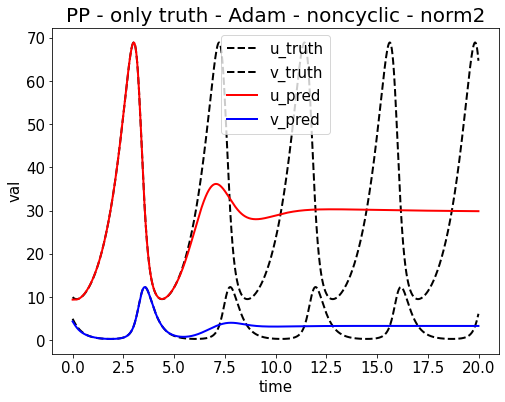

Saved as /content/drive/My Drive/Workspace/PINN//figure/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-04-00-28-49_1654302701.png


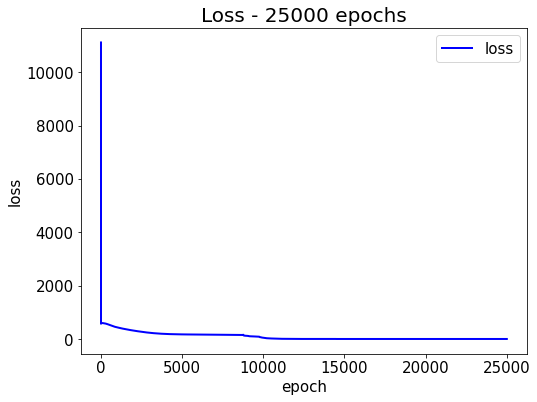

Epoch [26000/100000] Loss:0.145962 Loss_1:0.008576 Loss_2:0.137386 Loss_3:0.000000 Lr:0.000278 Time:7.685529s (2.99min in total, 8.52min remains)
Epoch [27000/100000] Loss:0.481489 Loss_1:0.042515 Loss_2:0.438974 Loss_3:0.000000 Lr:0.000270 Time:6.742843s (3.10min in total, 8.39min remains)
Epoch [28000/100000] Loss:0.138762 Loss_1:0.008186 Loss_2:0.130576 Loss_3:0.000000 Lr:0.000263 Time:6.690639s (3.22min in total, 8.27min remains)
Epoch [29000/100000] Loss:0.135899 Loss_1:0.008049 Loss_2:0.127851 Loss_3:0.000000 Lr:0.000256 Time:6.746484s (3.33min in total, 8.15min remains)
Epoch [30000/100000] Loss:0.133281 Loss_1:0.008041 Loss_2:0.125239 Loss_3:0.000000 Lr:0.000250 Time:6.667068s (3.44min in total, 8.03min remains)
Testing & drawing...
u= [9.442912, 9.443273, 9.443648, 9.444041, 9.444455, 9.444897, 9.445374, 9.445895, 9.446471, 9.447116] ... [30.08217, 30.083046, 30.083923, 30.084795, 30.085672, 30.086548, 30.087427, 30.088308, 30.089186, 30.090063]
v= [4.424734, 4.341633, 4.25929

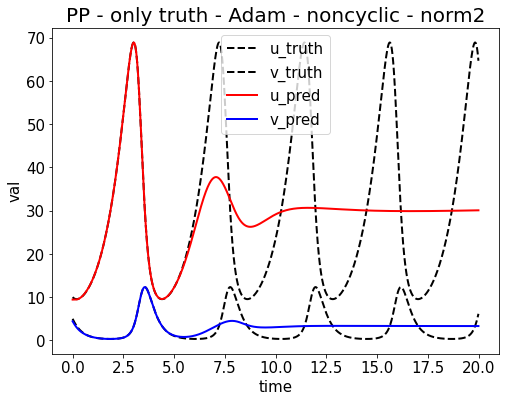

Saved as /content/drive/My Drive/Workspace/PINN//figure/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-04-00-28-49_1654302735.png


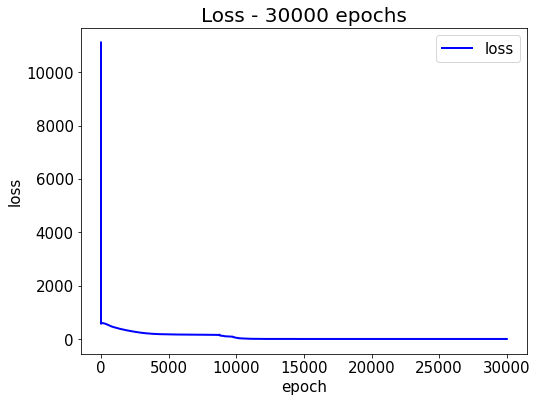

Epoch [31000/100000] Loss:0.130643 Loss_1:0.007847 Loss_2:0.122796 Loss_3:0.000000 Lr:0.000244 Time:7.702973s (3.57min in total, 7.94min remains)
Epoch [32000/100000] Loss:0.117079 Loss_1:0.004150 Loss_2:0.112929 Loss_3:0.000000 Lr:0.000238 Time:6.748527s (3.68min in total, 7.82min remains)
Epoch [33000/100000] Loss:0.106775 Loss_1:0.001264 Loss_2:0.105511 Loss_3:0.000000 Lr:0.000233 Time:6.616858s (3.79min in total, 7.70min remains)
Epoch [34000/100000] Loss:0.117538 Loss_1:0.002231 Loss_2:0.115307 Loss_3:0.000000 Lr:0.000227 Time:6.640999s (3.90min in total, 7.57min remains)
Epoch [35000/100000] Loss:0.098865 Loss_1:0.000402 Loss_2:0.098463 Loss_3:0.000000 Lr:0.000222 Time:6.663767s (4.01min in total, 7.45min remains)
Testing & drawing...
u= [9.934829, 9.895823, 9.854535, 9.812815, 9.772522, 9.735169, 9.701715, 9.672556, 9.647635, 9.626608] ... [30.243574, 30.244522, 30.245478, 30.246428, 30.247383, 30.248327, 30.24928, 30.250229, 30.251175, 30.252125]
v= [4.9062815, 4.81496, 4.72362

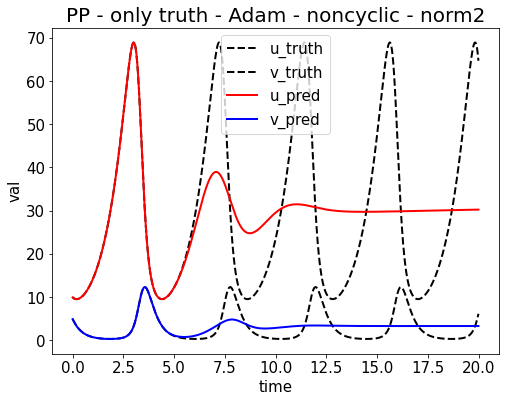

Saved as /content/drive/My Drive/Workspace/PINN//figure/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-04-00-28-49_1654302769.png


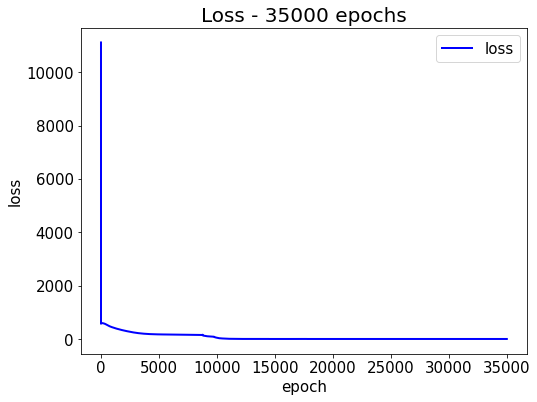

Epoch [36000/100000] Loss:0.096181 Loss_1:0.000325 Loss_2:0.095857 Loss_3:0.000000 Lr:0.000217 Time:7.679764s (4.14min in total, 7.36min remains)
Epoch [37000/100000] Loss:0.095042 Loss_1:0.000369 Loss_2:0.094674 Loss_3:0.000000 Lr:0.000213 Time:6.658129s (4.25min in total, 7.24min remains)
Epoch [38000/100000] Loss:0.090779 Loss_1:0.000232 Loss_2:0.090547 Loss_3:0.000000 Lr:0.000208 Time:6.664697s (4.36min in total, 7.12min remains)
Epoch [39000/100000] Loss:0.088624 Loss_1:0.000194 Loss_2:0.088430 Loss_3:0.000000 Lr:0.000204 Time:6.683618s (4.47min in total, 7.00min remains)
Epoch [40000/100000] Loss:0.087185 Loss_1:0.000205 Loss_2:0.086980 Loss_3:0.000000 Lr:0.000200 Time:6.709236s (4.59min in total, 6.88min remains)
Testing & drawing...
u= [9.98547, 9.939956, 9.894847, 9.851574, 9.811168, 9.774205, 9.740865, 9.711046, 9.684486, 9.660859] ... [30.00367, 30.002974, 30.002277, 30.00158, 30.00088, 30.000177, 29.99948, 29.998775, 29.998075, 29.997368]
v= [4.9662247, 4.8728356, 4.7795806

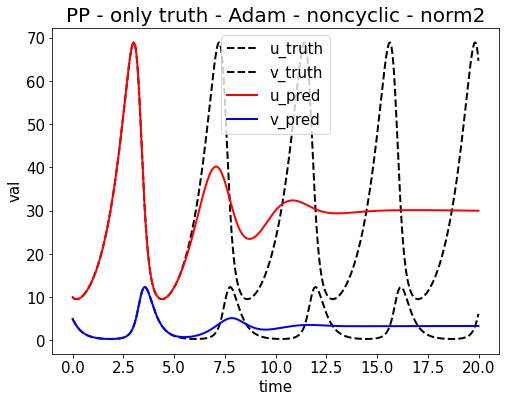

Saved as /content/drive/My Drive/Workspace/PINN//figure/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-04-00-28-49_1654302804.png


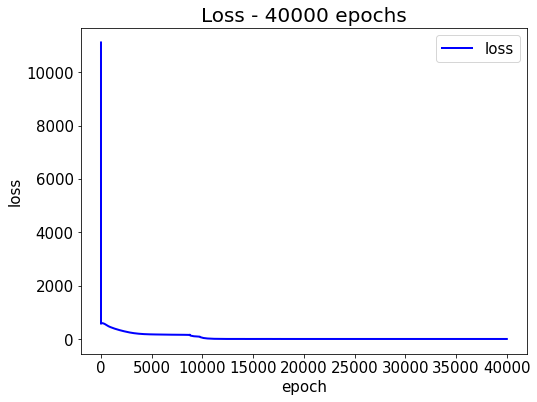

Epoch [41000/100000] Loss:0.085117 Loss_1:0.000170 Loss_2:0.084947 Loss_3:0.000000 Lr:0.000196 Time:7.722391s (4.71min in total, 6.78min remains)
Epoch [42000/100000] Loss:0.083840 Loss_1:0.000152 Loss_2:0.083688 Loss_3:0.000000 Lr:0.000192 Time:6.665340s (4.83min in total, 6.66min remains)
Epoch [43000/100000] Loss:0.082670 Loss_1:0.000130 Loss_2:0.082540 Loss_3:0.000000 Lr:0.000189 Time:6.753559s (4.94min in total, 6.55min remains)
Epoch [44000/100000] Loss:0.092847 Loss_1:0.001436 Loss_2:0.091411 Loss_3:0.000000 Lr:0.000185 Time:6.740488s (5.05min in total, 6.43min remains)
Epoch [45000/100000] Loss:0.080339 Loss_1:0.000140 Loss_2:0.080199 Loss_3:0.000000 Lr:0.000182 Time:6.682348s (5.16min in total, 6.31min remains)
Testing & drawing...
u= [9.991206, 9.944526, 9.8990135, 9.855808, 9.815663, 9.778944, 9.745702, 9.715786, 9.688946, 9.664904] ... [29.837717, 29.83612, 29.834524, 29.832926, 29.831318, 29.82972, 29.828115, 29.82651, 29.824903, 29.823298]
v= [4.9765587, 4.881943, 4.78762

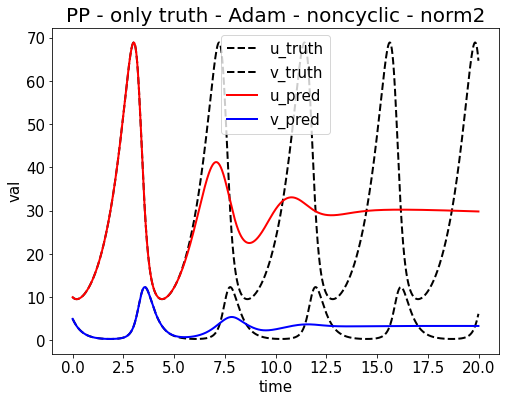

Saved as /content/drive/My Drive/Workspace/PINN//figure/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-04-00-28-49_1654302838.png


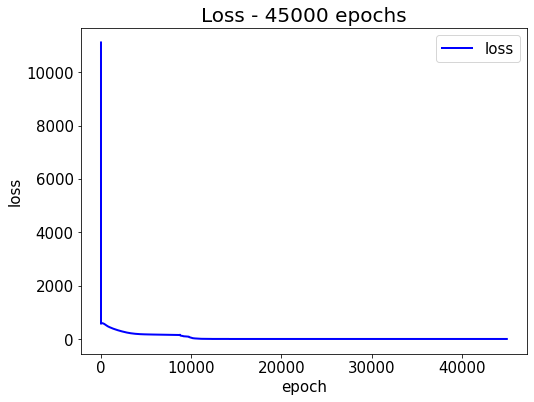

Epoch [46000/100000] Loss:0.079408 Loss_1:0.000133 Loss_2:0.079275 Loss_3:0.000000 Lr:0.000179 Time:7.645758s (5.29min in total, 6.21min remains)
Epoch [47000/100000] Loss:0.082609 Loss_1:0.000188 Loss_2:0.082420 Loss_3:0.000000 Lr:0.000175 Time:6.640446s (5.40min in total, 6.09min remains)
Epoch [48000/100000] Loss:0.077738 Loss_1:0.000119 Loss_2:0.077619 Loss_3:0.000000 Lr:0.000172 Time:6.667566s (5.51min in total, 5.97min remains)
Epoch [49000/100000] Loss:0.077370 Loss_1:0.000168 Loss_2:0.077202 Loss_3:0.000000 Lr:0.000169 Time:6.690320s (5.62min in total, 5.85min remains)
Epoch [50000/100000] Loss:0.100325 Loss_1:0.002674 Loss_2:0.097651 Loss_3:0.000000 Lr:0.000167 Time:6.688972s (5.73min in total, 5.73min remains)
Testing & drawing...
u= [9.986849, 9.939874, 9.894621, 9.85201, 9.812587, 9.7765665, 9.7439165, 9.714456, 9.687943, 9.664127] ... [29.760965, 29.759129, 29.757288, 29.755445, 29.753607, 29.75176, 29.74992, 29.748072, 29.74623, 29.744385]
v= [4.964897, 4.869168, 4.773868

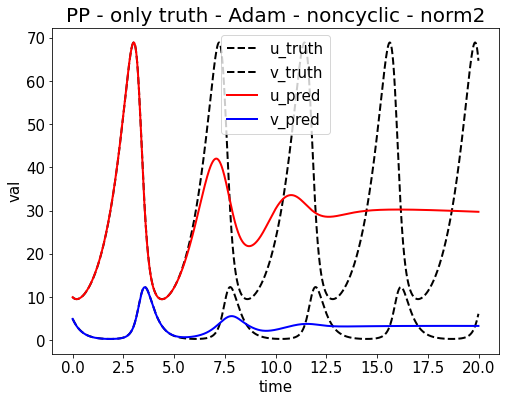

Saved as /content/drive/My Drive/Workspace/PINN//figure/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-04-00-28-49_1654302873.png


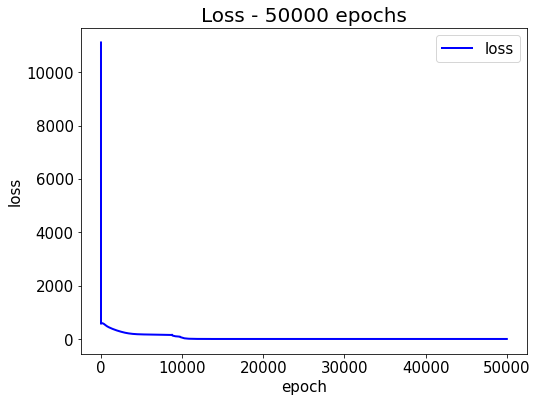

Epoch [51000/100000] Loss:0.075646 Loss_1:0.000117 Loss_2:0.075528 Loss_3:0.000000 Lr:0.000164 Time:7.669803s (5.86min in total, 5.63min remains)
Epoch [52000/100000] Loss:0.075180 Loss_1:0.000105 Loss_2:0.075075 Loss_3:0.000000 Lr:0.000161 Time:6.722355s (5.97min in total, 5.51min remains)
Epoch [53000/100000] Loss:0.074414 Loss_1:0.000098 Loss_2:0.074316 Loss_3:0.000000 Lr:0.000159 Time:6.754047s (6.09min in total, 5.40min remains)
Epoch [54000/100000] Loss:0.073867 Loss_1:0.000095 Loss_2:0.073773 Loss_3:0.000000 Lr:0.000156 Time:6.739137s (6.20min in total, 5.28min remains)
Epoch [55000/100000] Loss:0.073470 Loss_1:0.000086 Loss_2:0.073383 Loss_3:0.000000 Lr:0.000154 Time:6.695263s (6.31min in total, 5.16min remains)
Testing & drawing...
u= [9.996488, 9.948909, 9.903111, 9.859957, 9.819957, 9.783311, 9.749991, 9.719838, 9.692626, 9.668121] ... [29.775547, 29.773752, 29.771955, 29.770157, 29.76836, 29.76656, 29.76476, 29.762962, 29.761164, 29.75937]
v= [4.9873185, 4.8917017, 4.796592

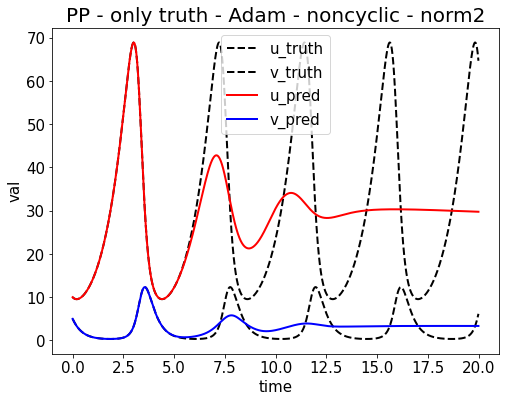

Saved as /content/drive/My Drive/Workspace/PINN//figure/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-04-00-28-49_1654302907.png


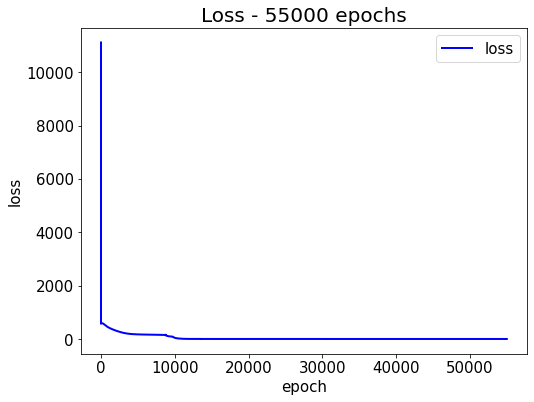

Epoch [56000/100000] Loss:0.072802 Loss_1:0.000096 Loss_2:0.072705 Loss_3:0.000000 Lr:0.000152 Time:7.990939s (6.44min in total, 5.06min remains)
Epoch [57000/100000] Loss:0.074009 Loss_1:0.000178 Loss_2:0.073831 Loss_3:0.000000 Lr:0.000149 Time:6.757500s (6.56min in total, 4.95min remains)
Epoch [58000/100000] Loss:0.115359 Loss_1:0.004238 Loss_2:0.111121 Loss_3:0.000000 Lr:0.000147 Time:6.691246s (6.67min in total, 4.83min remains)
Epoch [59000/100000] Loss:0.071476 Loss_1:0.000083 Loss_2:0.071393 Loss_3:0.000000 Lr:0.000145 Time:6.780602s (6.78min in total, 4.71min remains)
Epoch [60000/100000] Loss:0.071401 Loss_1:0.000081 Loss_2:0.071320 Loss_3:0.000000 Lr:0.000143 Time:6.704080s (6.89min in total, 4.59min remains)
Testing & drawing...
u= [9.996854, 9.948991, 9.903164, 9.860108, 9.820246, 9.783705, 9.750436, 9.720264, 9.692982, 9.66837] ... [29.797039, 29.795557, 29.794073, 29.792595, 29.791115, 29.789637, 29.788158, 29.786684, 29.785212, 29.78374]
v= [4.988805, 4.8927994, 4.79739

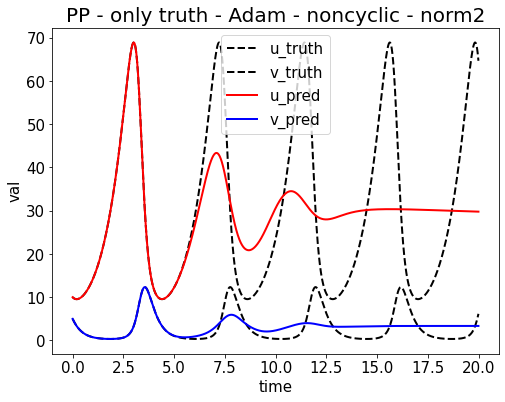

Saved as /content/drive/My Drive/Workspace/PINN//figure/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-04-00-28-49_1654302942.png


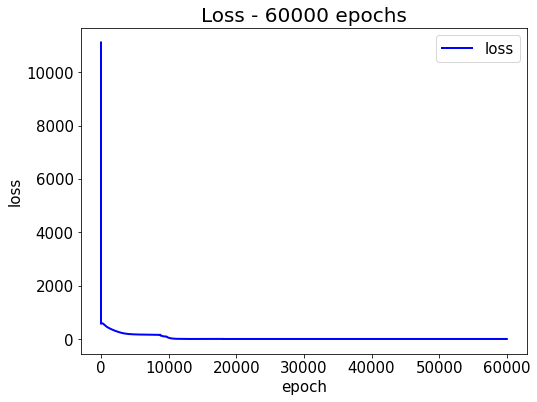

Epoch [61000/100000] Loss:0.070776 Loss_1:0.000081 Loss_2:0.070695 Loss_3:0.000000 Lr:0.000141 Time:7.699743s (7.02min in total, 4.49min remains)
Epoch [62000/100000] Loss:0.070463 Loss_1:0.000080 Loss_2:0.070383 Loss_3:0.000000 Lr:0.000139 Time:6.660345s (7.13min in total, 4.37min remains)
Epoch [63000/100000] Loss:0.070183 Loss_1:0.000079 Loss_2:0.070104 Loss_3:0.000000 Lr:0.000137 Time:6.755766s (7.24min in total, 4.25min remains)
Epoch [64000/100000] Loss:0.069958 Loss_1:0.000089 Loss_2:0.069869 Loss_3:0.000000 Lr:0.000135 Time:6.715693s (7.36min in total, 4.14min remains)
Epoch [65000/100000] Loss:0.070610 Loss_1:0.000149 Loss_2:0.070461 Loss_3:0.000000 Lr:0.000133 Time:6.656512s (7.47min in total, 4.02min remains)
Testing & drawing...
u= [10.000146, 9.951908, 9.90589, 9.862736, 9.822792, 9.786147, 9.752727, 9.722361, 9.69485, 9.669994] ... [29.813288, 29.812073, 29.810871, 29.809666, 29.808466, 29.807266, 29.806068, 29.804882, 29.803688, 29.802494]
v= [4.9926457, 4.896339, 4.8007

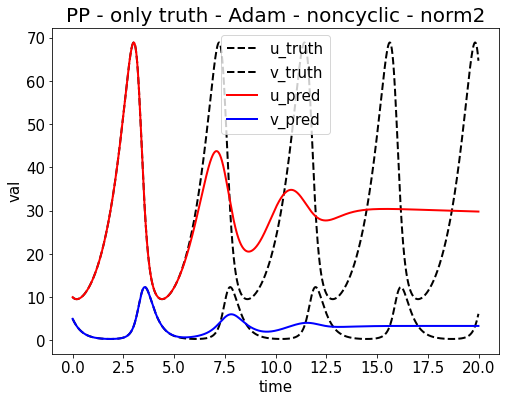

Saved as /content/drive/My Drive/Workspace/PINN//figure/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-04-00-28-49_1654302977.png


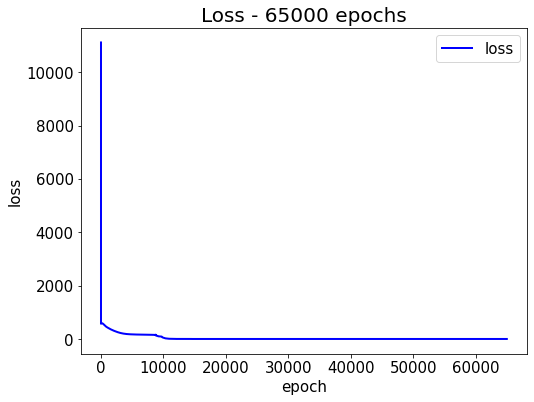

Epoch [66000/100000] Loss:0.070578 Loss_1:0.000152 Loss_2:0.070426 Loss_3:0.000000 Lr:0.000132 Time:7.675075s (7.60min in total, 3.91min remains)
Epoch [67000/100000] Loss:0.080736 Loss_1:0.001346 Loss_2:0.079390 Loss_3:0.000000 Lr:0.000130 Time:6.669813s (7.71min in total, 3.80min remains)
Epoch [68000/100000] Loss:0.068886 Loss_1:0.000072 Loss_2:0.068814 Loss_3:0.000000 Lr:0.000128 Time:6.694943s (7.82min in total, 3.68min remains)
Epoch [69000/100000] Loss:0.068666 Loss_1:0.000073 Loss_2:0.068592 Loss_3:0.000000 Lr:0.000127 Time:6.659605s (7.93min in total, 3.56min remains)
Epoch [70000/100000] Loss:0.068689 Loss_1:0.000095 Loss_2:0.068593 Loss_3:0.000000 Lr:0.000125 Time:6.680921s (8.04min in total, 3.45min remains)
Testing & drawing...
u= [9.994296, 9.946125, 9.900468, 9.857821, 9.818411, 9.782263, 9.749263, 9.719236, 9.691995, 9.667356] ... [29.832954, 29.832188, 29.831432, 29.830679, 29.829927, 29.82918, 29.828438, 29.827702, 29.826967, 29.826237]
v= [4.989483, 4.892826, 4.79691

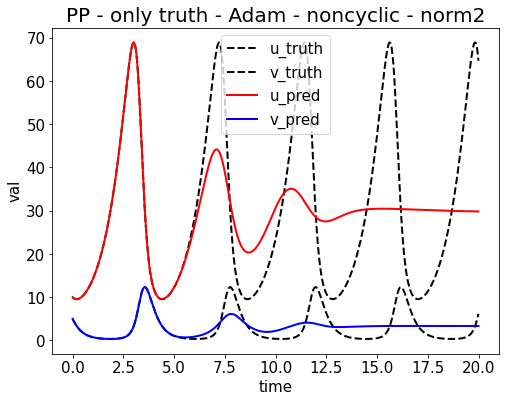

Saved as /content/drive/My Drive/Workspace/PINN//figure/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-04-00-28-49_1654303011.png


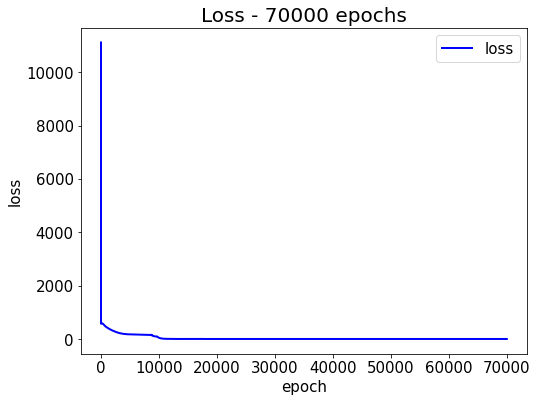

Epoch [71000/100000] Loss:0.088419 Loss_1:0.002246 Loss_2:0.086172 Loss_3:0.000000 Lr:0.000123 Time:7.610201s (8.17min in total, 3.34min remains)
Epoch [72000/100000] Loss:0.068336 Loss_1:0.000053 Loss_2:0.068282 Loss_3:0.000000 Lr:0.000122 Time:6.752220s (8.28min in total, 3.22min remains)
Epoch [73000/100000] Loss:0.067720 Loss_1:0.000074 Loss_2:0.067646 Loss_3:0.000000 Lr:0.000120 Time:6.671957s (8.39min in total, 3.10min remains)
Epoch [74000/100000] Loss:0.067448 Loss_1:0.000072 Loss_2:0.067375 Loss_3:0.000000 Lr:0.000119 Time:6.707582s (8.50min in total, 2.99min remains)
Epoch [75000/100000] Loss:0.067164 Loss_1:0.000071 Loss_2:0.067093 Loss_3:0.000000 Lr:0.000118 Time:6.766791s (8.62min in total, 2.87min remains)
Testing & drawing...
u= [9.999364, 9.950826, 9.904924, 9.8620825, 9.822479, 9.786108, 9.752858, 9.722553, 9.695019, 9.670085] ... [29.907484, 29.907999, 29.90852, 29.909052, 29.909586, 29.910126, 29.910671, 29.911226, 29.911781, 29.912355]
v= [4.993733, 4.896909, 4.8008

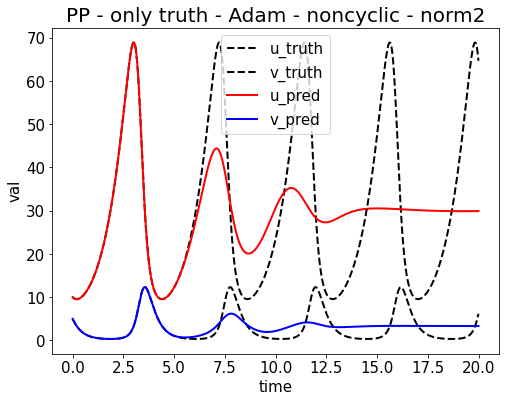

Saved as /content/drive/My Drive/Workspace/PINN//figure/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-04-00-28-49_1654303046.png


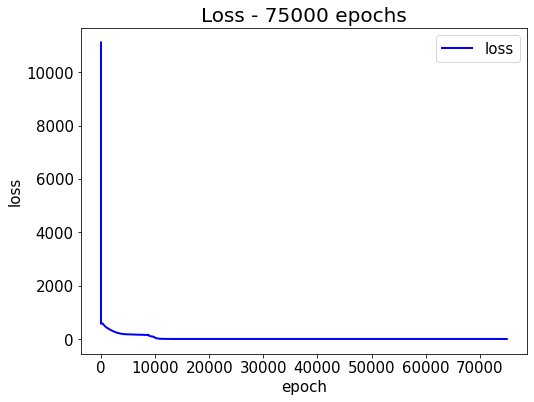

Epoch [76000/100000] Loss:0.068110 Loss_1:0.000131 Loss_2:0.067979 Loss_3:0.000000 Lr:0.000116 Time:7.698598s (8.74min in total, 2.76min remains)
Epoch [77000/100000] Loss:0.075279 Loss_1:0.000633 Loss_2:0.074647 Loss_3:0.000000 Lr:0.000115 Time:6.676596s (8.85min in total, 2.64min remains)
Epoch [78000/100000] Loss:0.065774 Loss_1:0.000068 Loss_2:0.065706 Loss_3:0.000000 Lr:0.000114 Time:6.649613s (8.97min in total, 2.53min remains)
Epoch [79000/100000] Loss:0.065258 Loss_1:0.000070 Loss_2:0.065189 Loss_3:0.000000 Lr:0.000112 Time:6.673326s (9.08min in total, 2.41min remains)
Epoch [80000/100000] Loss:0.065074 Loss_1:0.000069 Loss_2:0.065005 Loss_3:0.000000 Lr:0.000111 Time:6.686354s (9.19min in total, 2.30min remains)
Testing & drawing...
u= [9.999922, 9.9511795, 9.905288, 9.862546, 9.823057, 9.78677, 9.7535515, 9.723233, 9.695648, 9.670643] ... [30.252203, 30.25563, 30.259062, 30.262497, 30.265932, 30.26937, 30.272812, 30.276258, 30.279705, 30.283152]
v= [4.995807, 4.898857, 4.80274

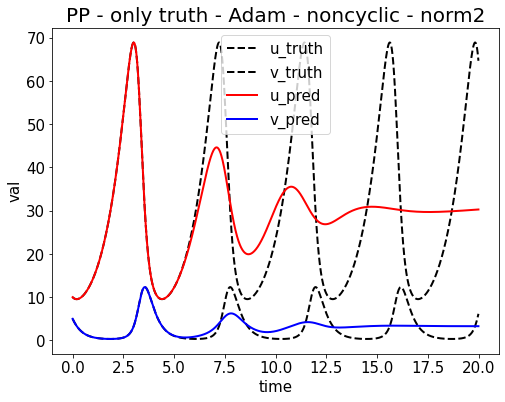

Saved as /content/drive/My Drive/Workspace/PINN//figure/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-04-00-28-49_1654303080.png


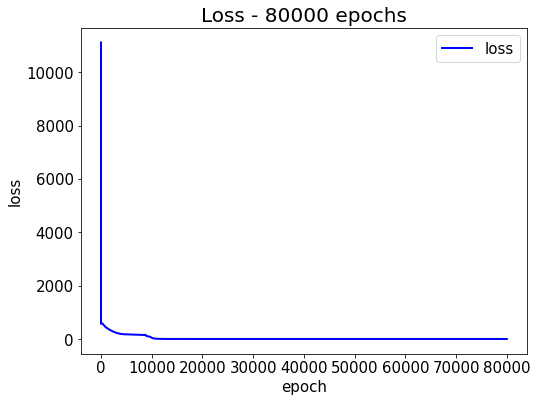

Epoch [81000/100000] Loss:0.064358 Loss_1:0.000065 Loss_2:0.064292 Loss_3:0.000000 Lr:0.000110 Time:7.725285s (9.32min in total, 2.19min remains)
Epoch [82000/100000] Loss:0.064129 Loss_1:0.000058 Loss_2:0.064071 Loss_3:0.000000 Lr:0.000109 Time:6.645518s (9.43min in total, 2.07min remains)
Epoch [83000/100000] Loss:0.063800 Loss_1:0.000062 Loss_2:0.063739 Loss_3:0.000000 Lr:0.000108 Time:6.693075s (9.54min in total, 1.95min remains)
Epoch [84000/100000] Loss:0.064244 Loss_1:0.000176 Loss_2:0.064068 Loss_3:0.000000 Lr:0.000106 Time:6.674139s (9.65min in total, 1.84min remains)
Epoch [85000/100000] Loss:0.063250 Loss_1:0.000067 Loss_2:0.063183 Loss_3:0.000000 Lr:0.000105 Time:6.666565s (9.76min in total, 1.72min remains)
Testing & drawing...
u= [9.999634, 9.950768, 9.9049225, 9.862293, 9.82292, 9.786713, 9.753532, 9.723215, 9.695599, 9.670549] ... [30.363895, 30.367628, 30.371355, 30.37509, 30.37882, 30.38255, 30.386284, 30.390015, 30.393742, 30.39747]
v= [4.9945073, 4.8973575, 4.801092

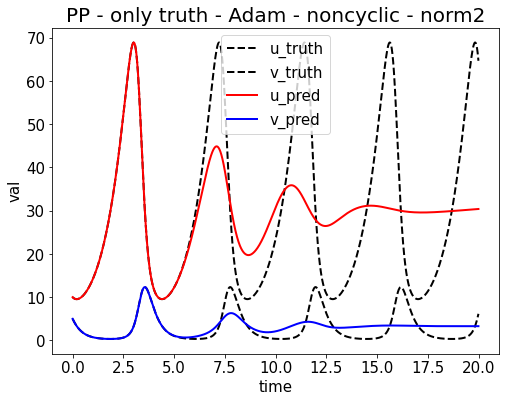

Saved as /content/drive/My Drive/Workspace/PINN//figure/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-04-00-28-49_1654303114.png


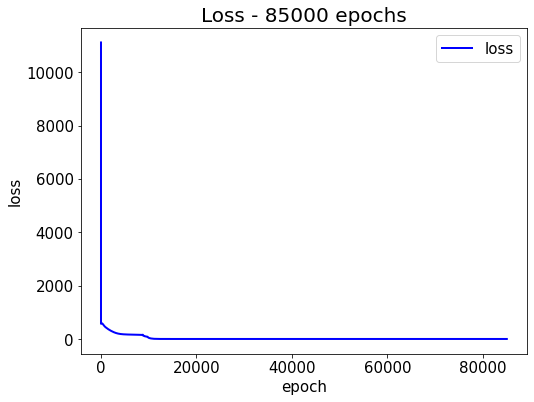

Epoch [86000/100000] Loss:0.063018 Loss_1:0.000065 Loss_2:0.062953 Loss_3:0.000000 Lr:0.000104 Time:7.743135s (9.89min in total, 1.61min remains)
Epoch [87000/100000] Loss:0.070336 Loss_1:0.000842 Loss_2:0.069493 Loss_3:0.000000 Lr:0.000103 Time:6.728540s (10.00min in total, 1.49min remains)
Epoch [88000/100000] Loss:0.062559 Loss_1:0.000069 Loss_2:0.062490 Loss_3:0.000000 Lr:0.000102 Time:6.696696s (10.11min in total, 1.38min remains)
Epoch [89000/100000] Loss:0.069278 Loss_1:0.000296 Loss_2:0.068982 Loss_3:0.000000 Lr:0.000101 Time:6.712260s (10.23min in total, 1.26min remains)
Epoch [90000/100000] Loss:0.063538 Loss_1:0.000134 Loss_2:0.063404 Loss_3:0.000000 Lr:0.000100 Time:6.700150s (10.34min in total, 1.15min remains)
Testing & drawing...
u= [10.001545, 9.95245, 9.906454, 9.863703, 9.8242, 9.787855, 9.75452, 9.724038, 9.696256, 9.671039] ... [30.382252, 30.38567, 30.389086, 30.3925, 30.395914, 30.399332, 30.40274, 30.406149, 30.40956, 30.412966]
v= [4.99005, 4.8927217, 4.796326, 

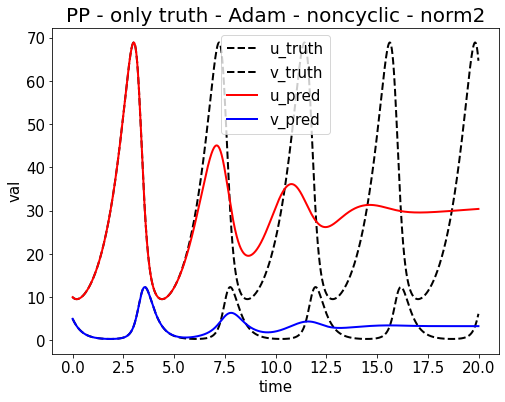

Saved as /content/drive/My Drive/Workspace/PINN//figure/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-04-00-28-49_1654303149.png


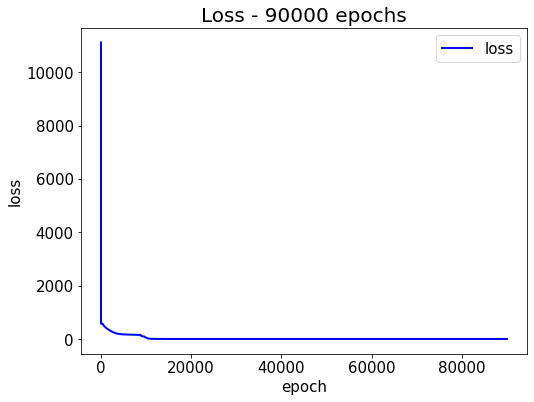

Epoch [91000/100000] Loss:0.064949 Loss_1:0.000382 Loss_2:0.064566 Loss_3:0.000000 Lr:0.000099 Time:7.721419s (10.47min in total, 1.04min remains)
Epoch [92000/100000] Loss:0.070716 Loss_1:0.000366 Loss_2:0.070350 Loss_3:0.000000 Lr:0.000098 Time:6.672307s (10.58min in total, 0.92min remains)
Epoch [93000/100000] Loss:0.062264 Loss_1:0.000123 Loss_2:0.062141 Loss_3:0.000000 Lr:0.000097 Time:6.657439s (10.69min in total, 0.80min remains)
Epoch [94000/100000] Loss:0.061409 Loss_1:0.000064 Loss_2:0.061345 Loss_3:0.000000 Lr:0.000096 Time:6.629006s (10.80min in total, 0.69min remains)
Epoch [95000/100000] Loss:0.064749 Loss_1:0.000234 Loss_2:0.064515 Loss_3:0.000000 Lr:0.000095 Time:6.675968s (10.91min in total, 0.57min remains)
Testing & drawing...
u= [9.999479, 9.950525, 9.904731, 9.862193, 9.822893, 9.786718, 9.753526, 9.723164, 9.695482, 9.670357] ... [30.342978, 30.346157, 30.34933, 30.352509, 30.355684, 30.358854, 30.362028, 30.365194, 30.36836, 30.371521]
v= [5.0049415, 4.9076886, 4

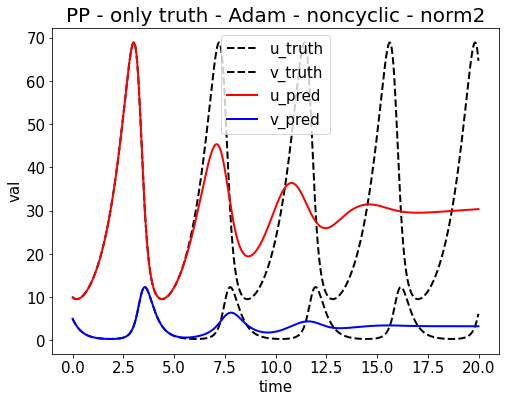

Saved as /content/drive/My Drive/Workspace/PINN//figure/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-04-00-28-49_1654303183.png


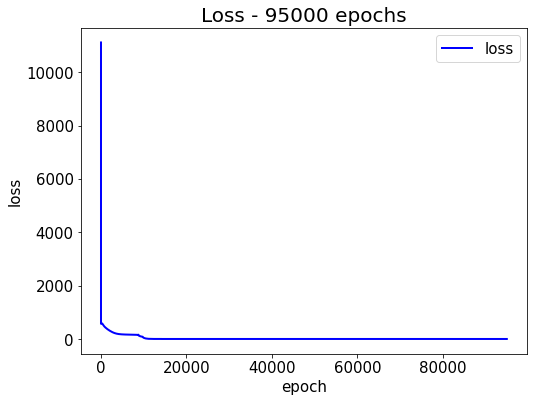

Epoch [96000/100000] Loss:0.066311 Loss_1:0.000632 Loss_2:0.065678 Loss_3:0.000000 Lr:0.000094 Time:7.650412s (11.04min in total, 0.46min remains)
Epoch [97000/100000] Loss:0.060943 Loss_1:0.000069 Loss_2:0.060874 Loss_3:0.000000 Lr:0.000093 Time:6.621391s (11.15min in total, 0.34min remains)
Epoch [98000/100000] Loss:0.062330 Loss_1:0.000111 Loss_2:0.062218 Loss_3:0.000000 Lr:0.000093 Time:6.674767s (11.26min in total, 0.23min remains)
Epoch [99000/100000] Loss:0.068275 Loss_1:0.000179 Loss_2:0.068096 Loss_3:0.000000 Lr:0.000092 Time:6.677064s (11.37min in total, 0.11min remains)
Epoch [100000/100000] Loss:0.060923 Loss_1:0.000117 Loss_2:0.060806 Loss_3:0.000000 Lr:0.000091 Time:6.669254s (11.48min in total, 0.00min remains)
Testing & drawing...
u= [9.999272, 9.950395, 9.904694, 9.862241, 9.823008, 9.786882, 9.753728, 9.7233925, 9.695733, 9.670632] ... [30.315779, 30.318869, 30.321955, 30.32504, 30.328123, 30.331198, 30.33427, 30.33734, 30.340414, 30.34348]
v= [4.9957376, 4.898272, 4.

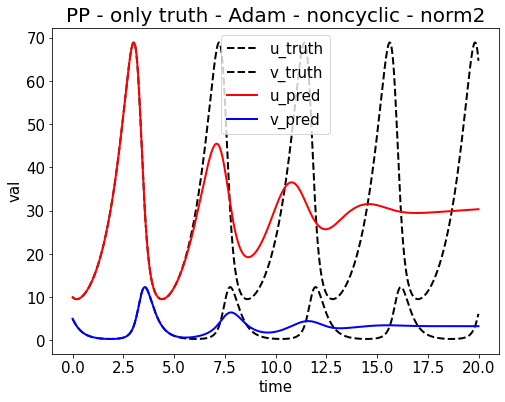

Saved as /content/drive/My Drive/Workspace/PINN//figure/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-04-00-28-49_1654303218.png


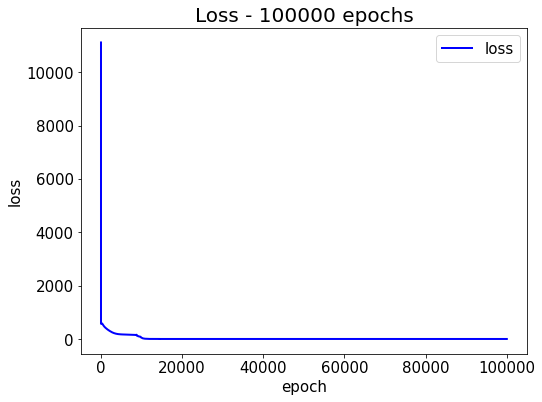

tensor board path: /content/drive/My Drive/Workspace/PINN//board/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-04-00-28-49_board
%load_ext tensorboard
%tensorboard --logdir=/content/drive/My\ Drive/Workspace/PINN//board/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-04-00-28-49_board


In [ ]:
# PP - 0.25 truth + loss2 + loss3
main_path = '/content/drive/My Drive/Workspace/PINN/' # ENZE marked: you need to change your main_path if it's not here
run_pp_truth(main_path)

continue_id = None: [0, 20.0] is mapped to [[-1. -1.], [0.999 0.999]]
using cuda
epoch = 100000
epoch_step = 1000
model_name = SimpleNetworkPP_Truth
now_string = 2022-06-04-00-02-39
model_save_path_last = /content/drive/My Drive/Workspace/PINN//train/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-04-00-02-39_last.pt
model_save_path_best = /content/drive/My Drive/Workspace/PINN//train/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-04-00-02-39_best.pt
loss_save_path = /content/drive/My Drive/Workspace/PINN//loss/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-04-00-02-39_loss_100000.npy
args = {'epoch': 100000, 'epoch_step': 1000, 'lr': 0.001, 'main_path': '/content/drive/My Drive/Workspace/PINN/', 'save_step': 5000}
config = {'model_name': 'SimpleNetworkPP_Truth', 'T': 20.0, 'T_all': 20.0, 'T_unit': 0.01, 'N': 2000, 'U_start': 10.0, 'V_start': 5.0, 'alpha': 1.0, 'beta': 3.0, 'gamma': 0.3, 'e': 0.333, 'ub': 20.0, 'lb': 0.0, 'continue_period': 0.2, 'round_bit': 3, 'continue_id': None, '

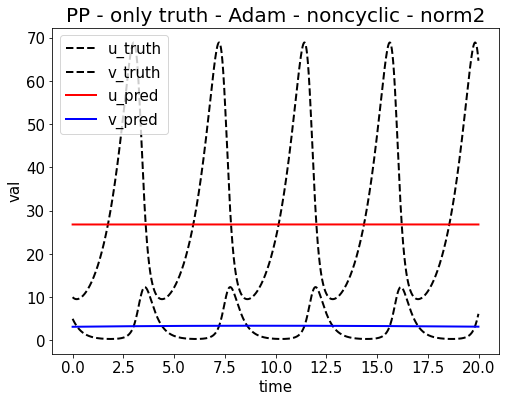

Saved as /content/drive/My Drive/Workspace/PINN//figure/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-04-00-02-39_1654300993.png


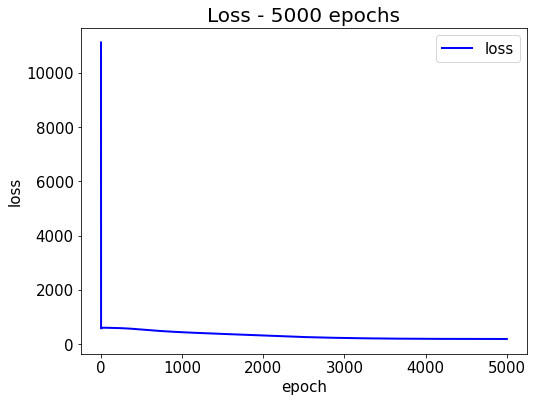

Epoch [06000/100000] Loss:189.949722 Loss_1:189.495880 Loss_2:0.453847 Loss_3:0.000000 Lr:0.000625 Time:7.888639s (0.69min in total, 10.84min remains)
Epoch [07000/100000] Loss:189.911835 Loss_1:189.521011 Loss_2:0.390828 Loss_3:0.000000 Lr:0.000588 Time:6.675456s (0.80min in total, 10.67min remains)
Epoch [08000/100000] Loss:189.888260 Loss_1:189.526855 Loss_2:0.361408 Loss_3:0.000000 Lr:0.000556 Time:6.669507s (0.91min in total, 10.52min remains)
Epoch [09000/100000] Loss:189.870804 Loss_1:189.530960 Loss_2:0.339840 Loss_3:0.000000 Lr:0.000526 Time:6.654956s (1.03min in total, 10.37min remains)
Epoch [10000/100000] Loss:189.855850 Loss_1:189.532166 Loss_2:0.323686 Loss_3:0.000000 Lr:0.000500 Time:7.087601s (1.14min in total, 10.29min remains)
Testing & drawing...
u= [27.660927, 27.66098, 27.661034, 27.661087, 27.661135, 27.66119, 27.661242, 27.661293, 27.661345, 27.661398] ... [27.674616, 27.674595, 27.674574, 27.674547, 27.674526, 27.674501, 27.67448, 27.674456, 27.674435, 27.674408

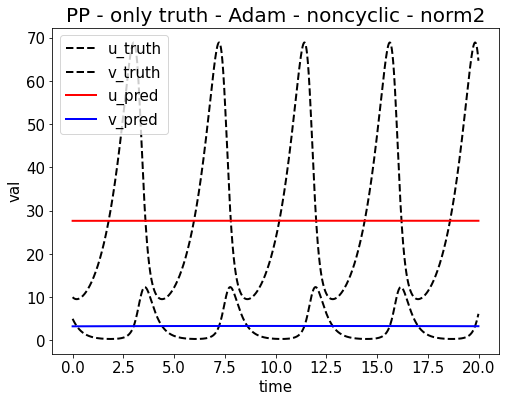

Saved as /content/drive/My Drive/Workspace/PINN//figure/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-04-00-02-39_1654301028.png


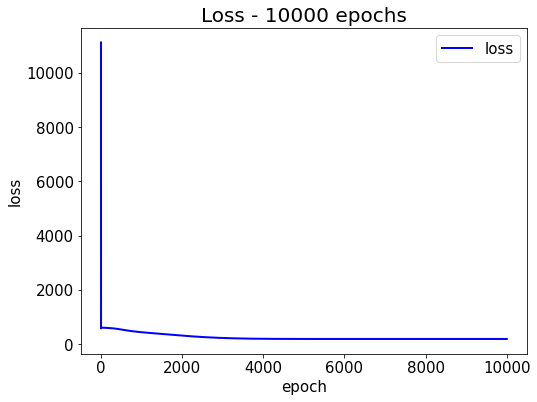

Epoch [11000/100000] Loss:170.827179 Loss_1:170.346451 Loss_2:0.479883 Loss_3:0.000833 Lr:0.000476 Time:7.638700s (1.27min in total, 10.28min remains)
Epoch [12000/100000] Loss:150.905716 Loss_1:149.693130 Loss_2:1.212586 Loss_3:0.000000 Lr:0.000455 Time:6.649420s (1.38min in total, 10.13min remains)
Epoch [13000/100000] Loss:138.803406 Loss_1:137.869415 Loss_2:0.933988 Loss_3:0.000000 Lr:0.000435 Time:6.629759s (1.49min in total, 9.99min remains)
Epoch [14000/100000] Loss:129.856186 Loss_1:128.461258 Loss_2:1.394934 Loss_3:0.000000 Lr:0.000417 Time:6.643635s (1.60min in total, 9.85min remains)
Epoch [15000/100000] Loss:91.525238 Loss_1:87.712830 Loss_2:3.812410 Loss_3:0.000000 Lr:0.000400 Time:6.753767s (1.72min in total, 9.72min remains)
Testing & drawing...
u= [8.205749, 8.244976, 8.284483, 8.324283, 8.364365, 8.404747, 8.445428, 8.486416, 8.527704, 8.569309] ... [23.87265, 23.872625, 23.872602, 23.872576, 23.87255, 23.872526, 23.872501, 23.872477, 23.87245, 23.872425]
v= [2.0704067

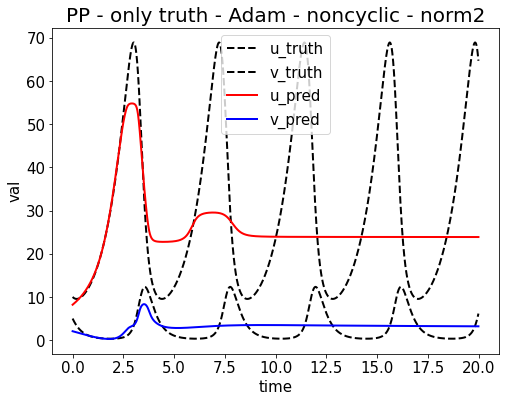

Saved as /content/drive/My Drive/Workspace/PINN//figure/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-04-00-02-39_1654301062.png


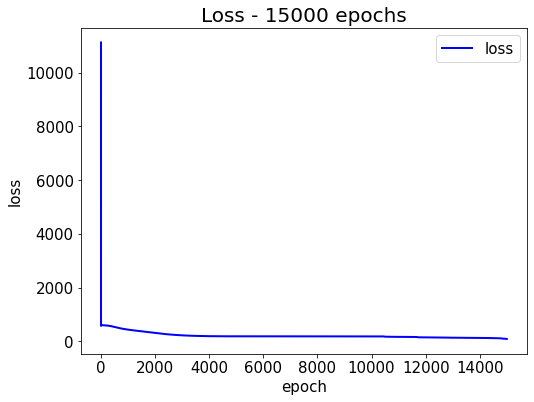

Epoch [16000/100000] Loss:18.061695 Loss_1:15.843012 Loss_2:2.218683 Loss_3:0.000000 Lr:0.000385 Time:7.603142s (1.84min in total, 9.67min remains)
Epoch [17000/100000] Loss:2.050074 Loss_1:1.401778 Loss_2:0.648297 Loss_3:0.000000 Lr:0.000370 Time:6.661780s (1.95min in total, 9.54min remains)
Epoch [18000/100000] Loss:0.556514 Loss_1:0.175854 Loss_2:0.380660 Loss_3:0.000000 Lr:0.000357 Time:6.594935s (2.06min in total, 9.40min remains)
Epoch [19000/100000] Loss:0.330466 Loss_1:0.058411 Loss_2:0.272054 Loss_3:0.000000 Lr:0.000345 Time:6.646381s (2.17min in total, 9.27min remains)
Epoch [20000/100000] Loss:0.252840 Loss_1:0.035283 Loss_2:0.217556 Loss_3:0.000000 Lr:0.000333 Time:6.660653s (2.28min in total, 9.14min remains)
Testing & drawing...
u= [9.699464, 9.678514, 9.658696, 9.640028, 9.622518, 9.606179, 9.591026, 9.577073, 9.564321, 9.552801] ... [30.255756, 30.255102, 30.254442, 30.25378, 30.253113, 30.252432, 30.25175, 30.251066, 30.250378, 30.249674]
v= [4.5799723, 4.5019846, 4.42

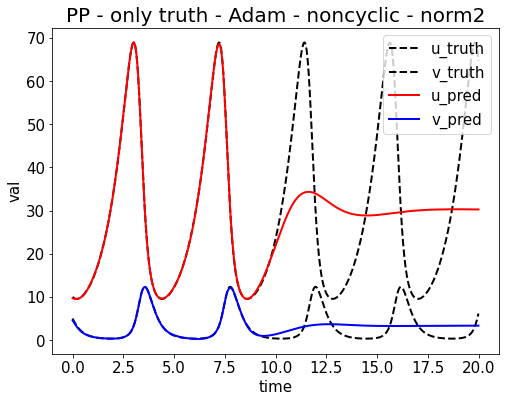

Saved as /content/drive/My Drive/Workspace/PINN//figure/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-04-00-02-39_1654301096.png


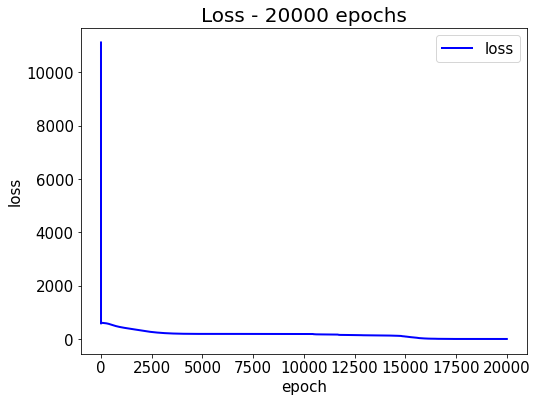

Epoch [21000/100000] Loss:0.210344 Loss_1:0.024614 Loss_2:0.185730 Loss_3:0.000000 Lr:0.000323 Time:7.681679s (2.41min in total, 9.08min remains)
Epoch [22000/100000] Loss:0.183795 Loss_1:0.018098 Loss_2:0.165697 Loss_3:0.000000 Lr:0.000313 Time:6.667476s (2.52min in total, 8.95min remains)
Epoch [23000/100000] Loss:0.166215 Loss_1:0.013517 Loss_2:0.152698 Loss_3:0.000000 Lr:0.000303 Time:6.661353s (2.64min in total, 8.82min remains)
Epoch [24000/100000] Loss:0.154035 Loss_1:0.010465 Loss_2:0.143571 Loss_3:0.000000 Lr:0.000294 Time:6.686261s (2.75min in total, 8.70min remains)
Epoch [25000/100000] Loss:0.146088 Loss_1:0.008391 Loss_2:0.137697 Loss_3:0.000000 Lr:0.000286 Time:6.608253s (2.86min in total, 8.57min remains)
Testing & drawing...
u= [9.875323, 9.842877, 9.812001, 9.782694, 9.754982, 9.728868, 9.704362, 9.681474, 9.660209, 9.640581] ... [29.553009, 29.548521, 29.54403, 29.539526, 29.53502, 29.53051, 29.52599, 29.521463, 29.51694, 29.512402]
v= [4.819412, 4.731298, 4.643695, 4

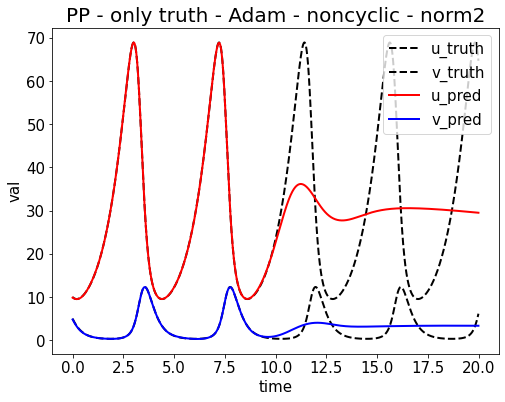

Saved as /content/drive/My Drive/Workspace/PINN//figure/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-04-00-02-39_1654301130.png


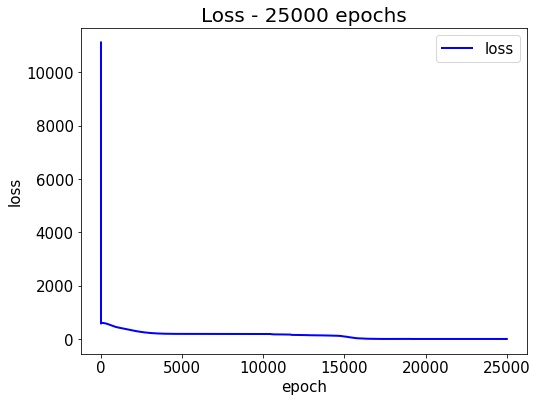

Epoch [26000/100000] Loss:0.141031 Loss_1:0.006879 Loss_2:0.134152 Loss_3:0.000000 Lr:0.000278 Time:7.579061s (2.98min in total, 8.49min remains)
Epoch [27000/100000] Loss:0.135970 Loss_1:0.006166 Loss_2:0.129804 Loss_3:0.000000 Lr:0.000270 Time:6.643577s (3.09min in total, 8.36min remains)
Epoch [28000/100000] Loss:0.145574 Loss_1:0.007870 Loss_2:0.137703 Loss_3:0.000000 Lr:0.000263 Time:6.849065s (3.21min in total, 8.25min remains)
Epoch [29000/100000] Loss:0.129431 Loss_1:0.005256 Loss_2:0.124174 Loss_3:0.000000 Lr:0.000256 Time:6.696287s (3.32min in total, 8.13min remains)
Epoch [30000/100000] Loss:0.127124 Loss_1:0.004925 Loss_2:0.122199 Loss_3:0.000000 Lr:0.000250 Time:6.646755s (3.43min in total, 8.00min remains)
Testing & drawing...
u= [9.945152, 9.907656, 9.871992, 9.838156, 9.806166, 9.776028, 9.747728, 9.721288, 9.696696, 9.673965] ... [29.471178, 29.467995, 29.464811, 29.461632, 29.458454, 29.455292, 29.452126, 29.44896, 29.4458, 29.442646]
v= [4.904822, 4.812218, 4.7204223

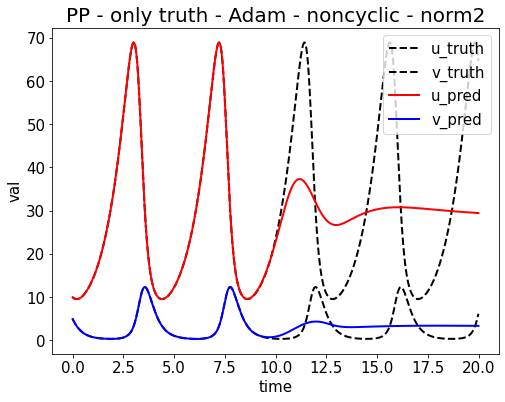

Saved as /content/drive/My Drive/Workspace/PINN//figure/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-04-00-02-39_1654301165.png


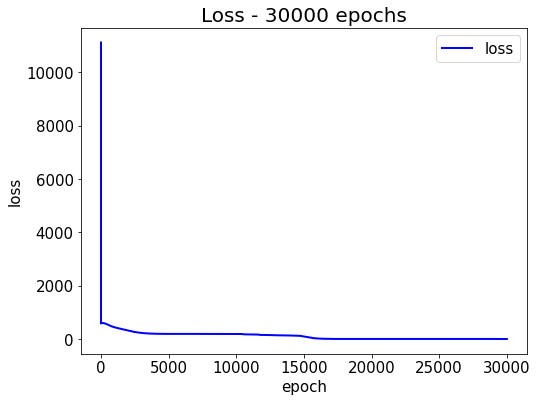

Epoch [31000/100000] Loss:0.125015 Loss_1:0.004759 Loss_2:0.120256 Loss_3:0.000000 Lr:0.000244 Time:7.624414s (3.56min in total, 7.92min remains)
Epoch [32000/100000] Loss:0.122873 Loss_1:0.004693 Loss_2:0.118180 Loss_3:0.000000 Lr:0.000238 Time:6.717950s (3.67min in total, 7.80min remains)
Epoch [33000/100000] Loss:0.121280 Loss_1:0.004584 Loss_2:0.116696 Loss_3:0.000000 Lr:0.000233 Time:6.694707s (3.78min in total, 7.68min remains)
Epoch [34000/100000] Loss:0.119940 Loss_1:0.004454 Loss_2:0.115485 Loss_3:0.000000 Lr:0.000227 Time:6.660894s (3.89min in total, 7.55min remains)
Epoch [35000/100000] Loss:0.118601 Loss_1:0.004354 Loss_2:0.114246 Loss_3:0.000000 Lr:0.000222 Time:6.676658s (4.00min in total, 7.43min remains)
Testing & drawing...
u= [9.963145, 9.922671, 9.884232, 9.847825, 9.8134575, 9.781118, 9.7508135, 9.722535, 9.696274, 9.672037] ... [29.459856, 29.45793, 29.456018, 29.454111, 29.452211, 29.450321, 29.44844, 29.44656, 29.444695, 29.442835]
v= [4.943651, 4.848982, 4.75526

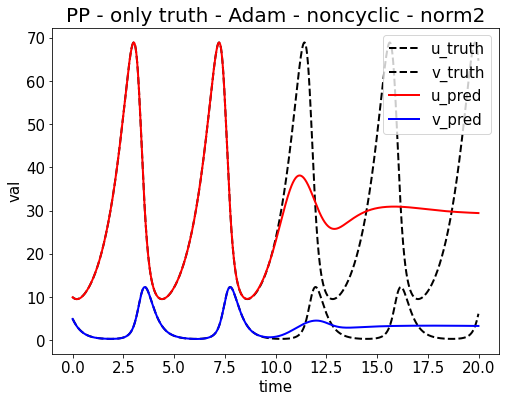

Saved as /content/drive/My Drive/Workspace/PINN//figure/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-04-00-02-39_1654301199.png


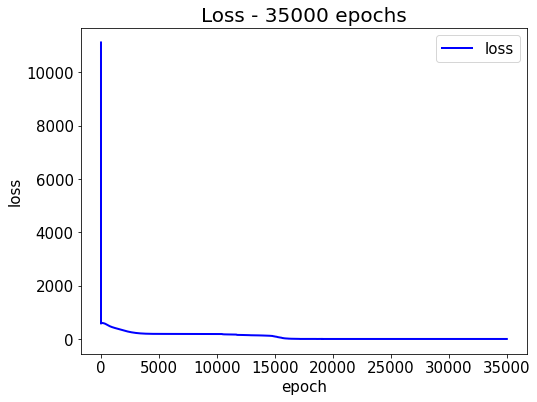

Epoch [36000/100000] Loss:0.121956 Loss_1:0.004325 Loss_2:0.117632 Loss_3:0.000000 Lr:0.000217 Time:7.553985s (4.13min in total, 7.34min remains)
Epoch [37000/100000] Loss:0.116794 Loss_1:0.004142 Loss_2:0.112651 Loss_3:0.000000 Lr:0.000213 Time:6.716084s (4.24min in total, 7.22min remains)
Epoch [38000/100000] Loss:0.116032 Loss_1:0.004104 Loss_2:0.111928 Loss_3:0.000000 Lr:0.000208 Time:6.668887s (4.35min in total, 7.10min remains)
Epoch [39000/100000] Loss:0.133679 Loss_1:0.006495 Loss_2:0.127184 Loss_3:0.000000 Lr:0.000204 Time:6.643134s (4.46min in total, 6.98min remains)
Epoch [40000/100000] Loss:0.136917 Loss_1:0.004090 Loss_2:0.132827 Loss_3:0.000000 Lr:0.000200 Time:6.645102s (4.57min in total, 6.86min remains)
Testing & drawing...
u= [9.940218, 9.897644, 9.85729, 9.81913, 9.783178, 9.749415, 9.7178335, 9.6884165, 9.661177, 9.636076] ... [29.54686, 29.546242, 29.545631, 29.545025, 29.544426, 29.543839, 29.543253, 29.542688, 29.542124, 29.541565]
v= [4.9561343, 4.860384, 4.7656

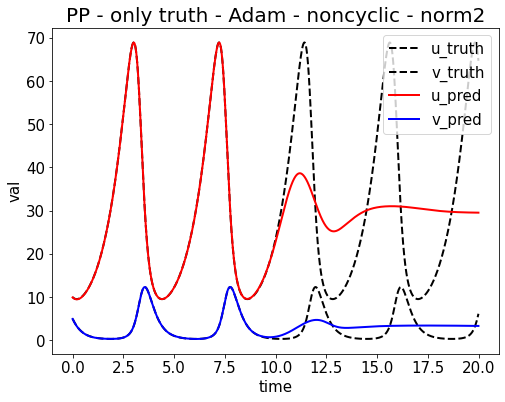

Saved as /content/drive/My Drive/Workspace/PINN//figure/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-04-00-02-39_1654301233.png


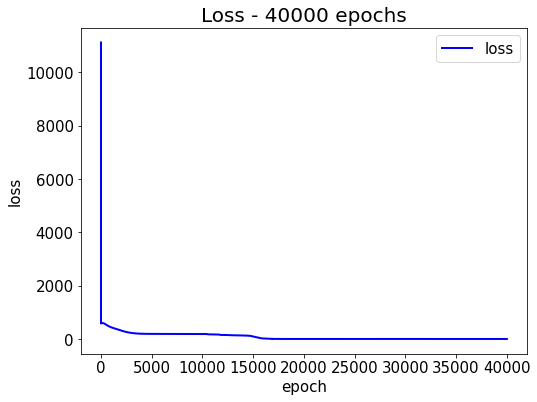

Epoch [41000/100000] Loss:0.114213 Loss_1:0.003913 Loss_2:0.110300 Loss_3:0.000000 Lr:0.000196 Time:7.634203s (4.70min in total, 6.76min remains)
Epoch [42000/100000] Loss:0.113795 Loss_1:0.003855 Loss_2:0.109941 Loss_3:0.000000 Lr:0.000192 Time:6.706566s (4.81min in total, 6.65min remains)
Epoch [43000/100000] Loss:0.113219 Loss_1:0.003828 Loss_2:0.109390 Loss_3:0.000000 Lr:0.000189 Time:6.664747s (4.92min in total, 6.53min remains)
Epoch [44000/100000] Loss:0.112684 Loss_1:0.003770 Loss_2:0.108914 Loss_3:0.000000 Lr:0.000185 Time:6.621700s (5.03min in total, 6.41min remains)
Epoch [45000/100000] Loss:0.115211 Loss_1:0.003888 Loss_2:0.111323 Loss_3:0.000000 Lr:0.000182 Time:6.704677s (5.15min in total, 6.29min remains)
Testing & drawing...
u= [10.012444, 9.968831, 9.927542, 9.888588, 9.851947, 9.817604, 9.785545, 9.755761, 9.728227, 9.702937] ... [29.660303, 29.660976, 29.661669, 29.662365, 29.663076, 29.663795, 29.664522, 29.665255, 29.665998, 29.66676]
v= [4.9647675, 4.8686357, 4.77

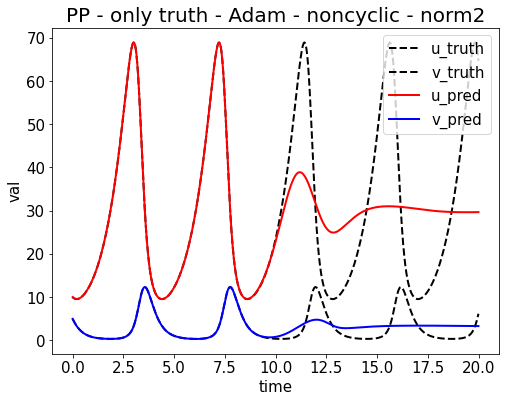

Saved as /content/drive/My Drive/Workspace/PINN//figure/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-04-00-02-39_1654301268.png


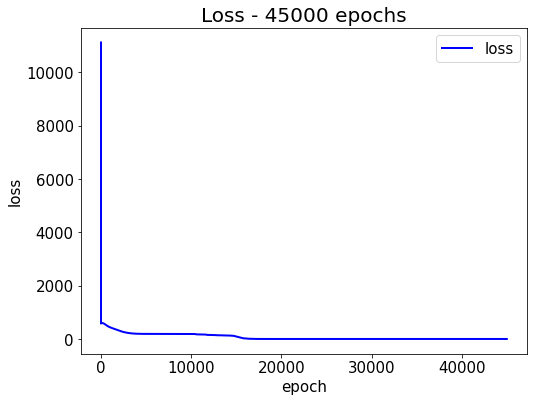

Epoch [46000/100000] Loss:0.241521 Loss_1:0.007304 Loss_2:0.234217 Loss_3:0.000000 Lr:0.000179 Time:7.710928s (5.27min in total, 6.19min remains)
Epoch [47000/100000] Loss:0.113379 Loss_1:0.003782 Loss_2:0.109597 Loss_3:0.000000 Lr:0.000175 Time:6.764203s (5.39min in total, 6.07min remains)
Epoch [48000/100000] Loss:0.110300 Loss_1:0.003598 Loss_2:0.106701 Loss_3:0.000000 Lr:0.000172 Time:6.590780s (5.50min in total, 5.96min remains)
Epoch [49000/100000] Loss:0.109675 Loss_1:0.003547 Loss_2:0.106128 Loss_3:0.000000 Lr:0.000169 Time:6.576238s (5.61min in total, 5.84min remains)
Epoch [50000/100000] Loss:0.110708 Loss_1:0.003515 Loss_2:0.107192 Loss_3:0.000000 Lr:0.000167 Time:6.669675s (5.72min in total, 5.72min remains)
Testing & drawing...
u= [9.990511, 9.94581, 9.903565, 9.863758, 9.826381, 9.791395, 9.758806, 9.728566, 9.70068, 9.675098] ... [29.903429, 29.906385, 29.90935, 29.912333, 29.91532, 29.918325, 29.921333, 29.924366, 29.927397, 29.930445]
v= [4.978693, 4.8824, 4.7870984, 4

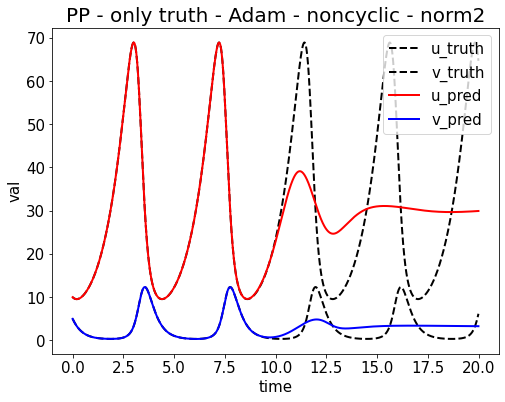

Saved as /content/drive/My Drive/Workspace/PINN//figure/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-04-00-02-39_1654301302.png


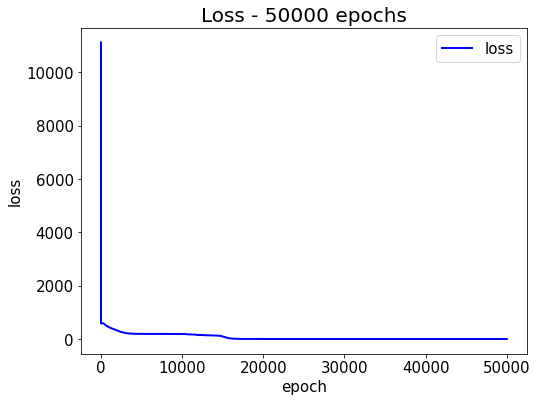

Epoch [51000/100000] Loss:0.111055 Loss_1:0.003600 Loss_2:0.107456 Loss_3:0.000000 Lr:0.000164 Time:7.675645s (5.85min in total, 5.62min remains)
Epoch [52000/100000] Loss:0.107627 Loss_1:0.003415 Loss_2:0.104212 Loss_3:0.000000 Lr:0.000161 Time:6.623690s (5.96min in total, 5.50min remains)
Epoch [53000/100000] Loss:0.330122 Loss_1:0.011145 Loss_2:0.318977 Loss_3:0.000000 Lr:0.000159 Time:6.628553s (6.07min in total, 5.38min remains)
Epoch [54000/100000] Loss:0.106171 Loss_1:0.003327 Loss_2:0.102845 Loss_3:0.000000 Lr:0.000156 Time:6.608859s (6.18min in total, 5.26min remains)
Epoch [55000/100000] Loss:0.105507 Loss_1:0.003275 Loss_2:0.102231 Loss_3:0.000000 Lr:0.000154 Time:6.740137s (6.29min in total, 5.15min remains)
Testing & drawing...
u= [9.99039, 9.9448395, 9.901852, 9.861409, 9.823477, 9.788042, 9.7550745, 9.724554, 9.696433, 9.670707] ... [30.197365, 30.203308, 30.209259, 30.215225, 30.221199, 30.22719, 30.233196, 30.23921, 30.245232, 30.251266]
v= [4.983575, 4.8871727, 4.7917

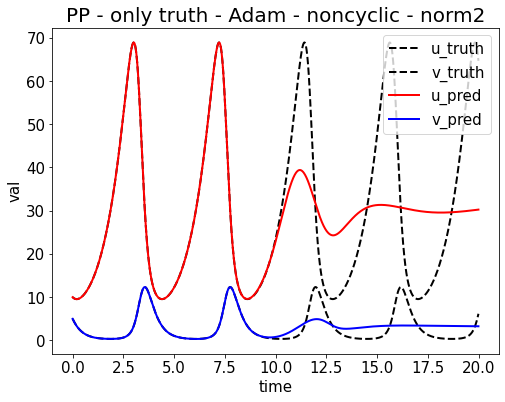

Saved as /content/drive/My Drive/Workspace/PINN//figure/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-04-00-02-39_1654301336.png


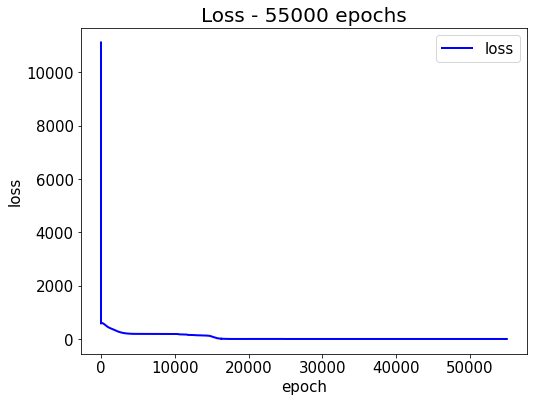

Epoch [56000/100000] Loss:0.106557 Loss_1:0.003345 Loss_2:0.103212 Loss_3:0.000000 Lr:0.000152 Time:7.859030s (6.42min in total, 5.04min remains)
Epoch [57000/100000] Loss:0.104232 Loss_1:0.003191 Loss_2:0.101040 Loss_3:0.000000 Lr:0.000149 Time:6.666614s (6.53min in total, 4.93min remains)
Epoch [58000/100000] Loss:0.103621 Loss_1:0.003165 Loss_2:0.100456 Loss_3:0.000000 Lr:0.000147 Time:6.685276s (6.64min in total, 4.81min remains)
Epoch [59000/100000] Loss:0.111876 Loss_1:0.003203 Loss_2:0.108673 Loss_3:0.000000 Lr:0.000145 Time:6.620195s (6.75min in total, 4.69min remains)
Epoch [60000/100000] Loss:0.102590 Loss_1:0.003096 Loss_2:0.099494 Loss_3:0.000000 Lr:0.000143 Time:6.651002s (6.86min in total, 4.58min remains)
Testing & drawing...
u= [9.99273, 9.946498, 9.90294, 9.862002, 9.823678, 9.787925, 9.754722, 9.724011, 9.695794, 9.670012] ... [30.479906, 30.488085, 30.49626, 30.50444, 30.512625, 30.520815, 30.529003, 30.537197, 30.545391, 30.553585]
v= [4.986023, 4.8896413, 4.7941923

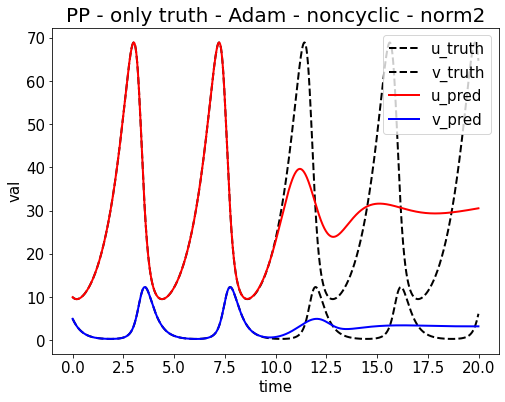

Saved as /content/drive/My Drive/Workspace/PINN//figure/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-04-00-02-39_1654301371.png


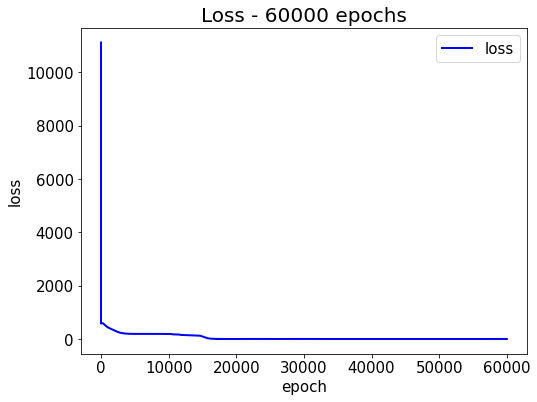

Epoch [61000/100000] Loss:0.102113 Loss_1:0.003065 Loss_2:0.099048 Loss_3:0.000000 Lr:0.000141 Time:7.691315s (6.99min in total, 4.47min remains)
Epoch [62000/100000] Loss:0.101671 Loss_1:0.003041 Loss_2:0.098631 Loss_3:0.000000 Lr:0.000139 Time:6.623996s (7.10min in total, 4.35min remains)
Epoch [63000/100000] Loss:0.101232 Loss_1:0.003012 Loss_2:0.098220 Loss_3:0.000000 Lr:0.000137 Time:6.601931s (7.21min in total, 4.24min remains)
Epoch [64000/100000] Loss:0.100829 Loss_1:0.003003 Loss_2:0.097826 Loss_3:0.000000 Lr:0.000135 Time:6.650244s (7.32min in total, 4.12min remains)
Epoch [65000/100000] Loss:0.102391 Loss_1:0.002969 Loss_2:0.099422 Loss_3:0.000000 Lr:0.000133 Time:6.682703s (7.43min in total, 4.00min remains)
Testing & drawing...
u= [10.012375, 9.965797, 9.921954, 9.8808155, 9.842346, 9.806523, 9.773285, 9.742609, 9.714456, 9.6887865] ... [30.615232, 30.622967, 30.630693, 30.638393, 30.646097, 30.653776, 30.66145, 30.669096, 30.67673, 30.684357]
v= [4.9789205, 4.8825955, 4.7

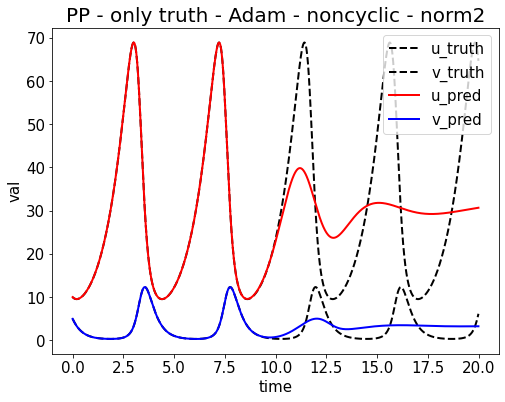

Saved as /content/drive/My Drive/Workspace/PINN//figure/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-04-00-02-39_1654301405.png


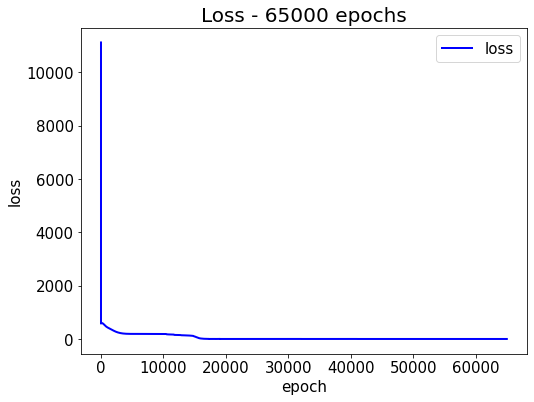

Epoch [66000/100000] Loss:0.100036 Loss_1:0.002927 Loss_2:0.097109 Loss_3:0.000000 Lr:0.000132 Time:7.624133s (7.56min in total, 3.90min remains)
Epoch [67000/100000] Loss:0.113167 Loss_1:0.003075 Loss_2:0.110092 Loss_3:0.000000 Lr:0.000130 Time:6.667408s (7.67min in total, 3.78min remains)
Epoch [68000/100000] Loss:0.099210 Loss_1:0.002886 Loss_2:0.096324 Loss_3:0.000000 Lr:0.000128 Time:6.653629s (7.78min in total, 3.66min remains)
Epoch [69000/100000] Loss:0.098847 Loss_1:0.002872 Loss_2:0.095975 Loss_3:0.000000 Lr:0.000127 Time:6.729671s (7.90min in total, 3.55min remains)
Epoch [70000/100000] Loss:0.098496 Loss_1:0.002866 Loss_2:0.095630 Loss_3:0.000000 Lr:0.000125 Time:6.715044s (8.01min in total, 3.43min remains)
Testing & drawing...
u= [9.994509, 9.947416, 9.903145, 9.861631, 9.822848, 9.7867565, 9.753312, 9.722467, 9.694197, 9.66844] ... [30.70788, 30.714737, 30.721567, 30.72837, 30.735147, 30.7419, 30.748621, 30.75532, 30.761988, 30.76863]
v= [4.9889607, 4.892492, 4.79693, 4.

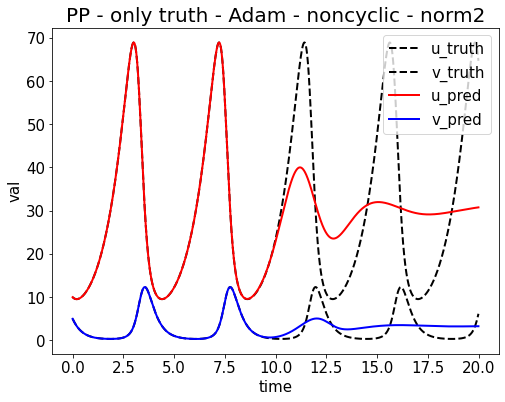

Saved as /content/drive/My Drive/Workspace/PINN//figure/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-04-00-02-39_1654301440.png


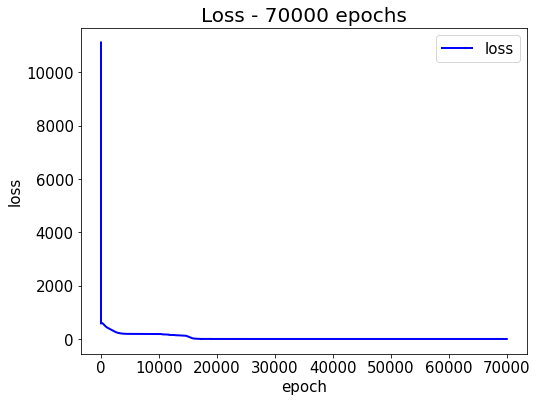

Epoch [71000/100000] Loss:0.098166 Loss_1:0.002826 Loss_2:0.095340 Loss_3:0.000000 Lr:0.000123 Time:7.645224s (8.14min in total, 3.32min remains)
Epoch [72000/100000] Loss:0.098364 Loss_1:0.002849 Loss_2:0.095515 Loss_3:0.000000 Lr:0.000122 Time:6.634979s (8.25min in total, 3.21min remains)
Epoch [73000/100000] Loss:0.097441 Loss_1:0.002820 Loss_2:0.094621 Loss_3:0.000000 Lr:0.000120 Time:6.687169s (8.36min in total, 3.09min remains)
Epoch [74000/100000] Loss:0.101284 Loss_1:0.002929 Loss_2:0.098355 Loss_3:0.000000 Lr:0.000119 Time:6.702226s (8.47min in total, 2.98min remains)
Epoch [75000/100000] Loss:0.108620 Loss_1:0.003300 Loss_2:0.105320 Loss_3:0.000000 Lr:0.000118 Time:6.658143s (8.58min in total, 2.86min remains)
Testing & drawing...
u= [9.980514, 9.932953, 9.888257, 9.846376, 9.807271, 9.770913, 9.737241, 9.706208, 9.677769, 9.651894] ... [30.805206, 30.8113, 30.817345, 30.823368, 30.829348, 30.83529, 30.84119, 30.84707, 30.852907, 30.858706]
v= [4.9998307, 4.903238, 4.807544, 

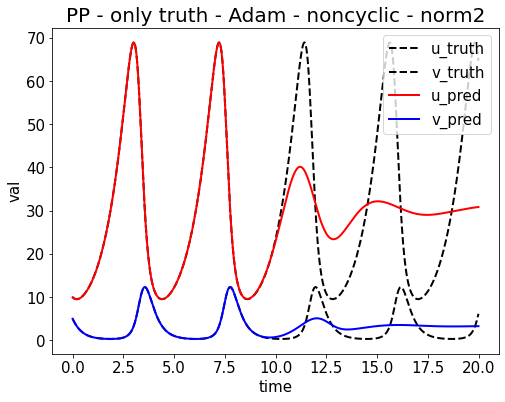

Saved as /content/drive/My Drive/Workspace/PINN//figure/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-04-00-02-39_1654301474.png


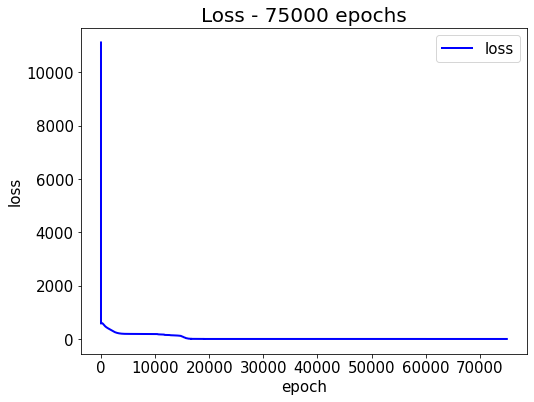

Epoch [76000/100000] Loss:0.096447 Loss_1:0.002764 Loss_2:0.093683 Loss_3:0.000000 Lr:0.000116 Time:7.657047s (8.71min in total, 2.75min remains)
Epoch [77000/100000] Loss:0.096077 Loss_1:0.002725 Loss_2:0.093352 Loss_3:0.000000 Lr:0.000115 Time:6.668942s (8.82min in total, 2.63min remains)
Epoch [78000/100000] Loss:0.095751 Loss_1:0.002711 Loss_2:0.093040 Loss_3:0.000000 Lr:0.000114 Time:6.634361s (8.93min in total, 2.52min remains)
Epoch [79000/100000] Loss:0.095425 Loss_1:0.002700 Loss_2:0.092724 Loss_3:0.000000 Lr:0.000112 Time:6.648989s (9.04min in total, 2.40min remains)
Epoch [80000/100000] Loss:0.095101 Loss_1:0.002690 Loss_2:0.092411 Loss_3:0.000000 Lr:0.000111 Time:6.670020s (9.15min in total, 2.29min remains)
Testing & drawing...
u= [9.9957, 9.948129, 9.903449, 9.861627, 9.82261, 9.786359, 9.752814, 9.721925, 9.693656, 9.667952] ... [30.826199, 30.83104, 30.83582, 30.840567, 30.845264, 30.849922, 30.854538, 30.859106, 30.863638, 30.86812]
v= [4.990679, 4.8940005, 4.798256, 4

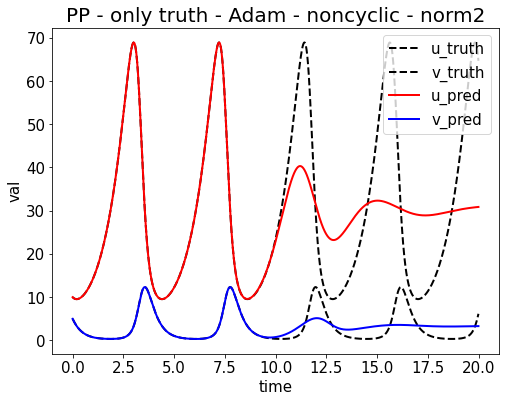

Saved as /content/drive/My Drive/Workspace/PINN//figure/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-04-00-02-39_1654301508.png


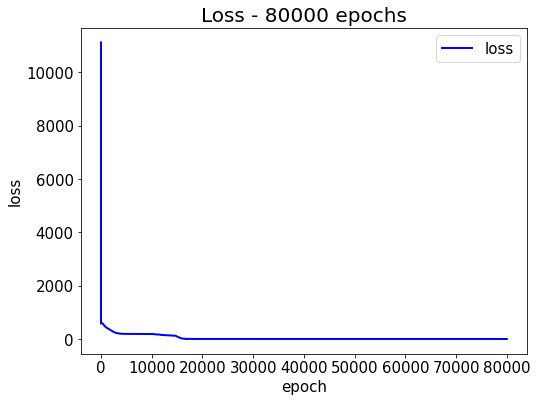

Epoch [81000/100000] Loss:0.100676 Loss_1:0.002974 Loss_2:0.097702 Loss_3:0.000000 Lr:0.000110 Time:7.652961s (9.28min in total, 2.18min remains)
Epoch [82000/100000] Loss:0.094439 Loss_1:0.002664 Loss_2:0.091775 Loss_3:0.000000 Lr:0.000109 Time:6.638424s (9.39min in total, 2.06min remains)
Epoch [83000/100000] Loss:0.094129 Loss_1:0.002651 Loss_2:0.091478 Loss_3:0.000000 Lr:0.000108 Time:6.688008s (9.50min in total, 1.95min remains)
Epoch [84000/100000] Loss:0.093804 Loss_1:0.002648 Loss_2:0.091156 Loss_3:0.000000 Lr:0.000106 Time:6.616169s (9.61min in total, 1.83min remains)
Epoch [85000/100000] Loss:0.093482 Loss_1:0.002642 Loss_2:0.090840 Loss_3:0.000000 Lr:0.000105 Time:6.698952s (9.72min in total, 1.72min remains)
Testing & drawing...
u= [9.996318, 9.948573, 9.903762, 9.861835, 9.82274, 9.786431, 9.752862, 9.721969, 9.693708, 9.668023] ... [30.82605, 30.829224, 30.832357, 30.835438, 30.838465, 30.841452, 30.844389, 30.847275, 30.850111, 30.852892]
v= [4.99168, 4.894815, 4.7989106

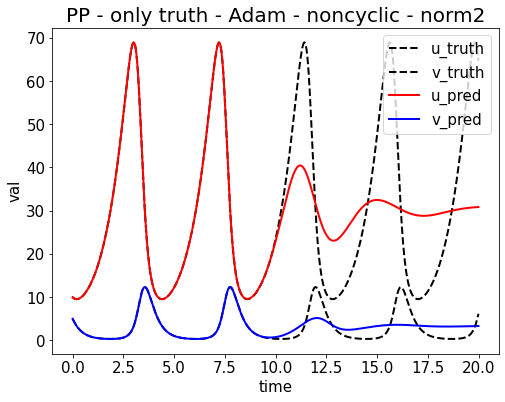

Saved as /content/drive/My Drive/Workspace/PINN//figure/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-04-00-02-39_1654301542.png


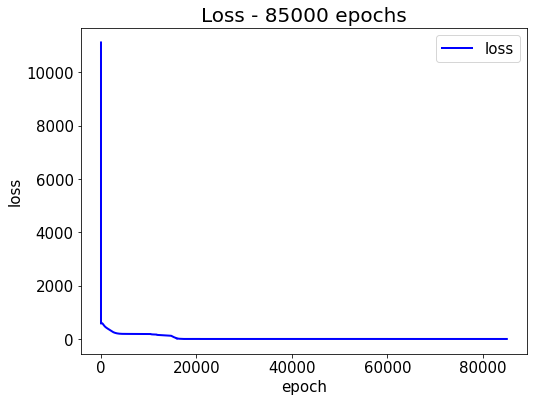

Epoch [86000/100000] Loss:0.093154 Loss_1:0.002649 Loss_2:0.090505 Loss_3:0.000000 Lr:0.000104 Time:7.622486s (9.85min in total, 1.60min remains)
Epoch [87000/100000] Loss:0.092809 Loss_1:0.002617 Loss_2:0.090192 Loss_3:0.000000 Lr:0.000103 Time:6.682086s (9.96min in total, 1.49min remains)
Epoch [88000/100000] Loss:0.092469 Loss_1:0.002620 Loss_2:0.089849 Loss_3:0.000000 Lr:0.000102 Time:6.750677s (10.07min in total, 1.37min remains)
Epoch [89000/100000] Loss:0.092132 Loss_1:0.002625 Loss_2:0.089507 Loss_3:0.000000 Lr:0.000101 Time:6.651639s (10.18min in total, 1.26min remains)
Epoch [90000/100000] Loss:0.091766 Loss_1:0.002611 Loss_2:0.089155 Loss_3:0.000000 Lr:0.000100 Time:6.630389s (10.30min in total, 1.14min remains)
Testing & drawing...
u= [9.996969, 9.949111, 9.904199, 9.862199, 9.823059, 9.7867155, 9.753124, 9.722235, 9.693977, 9.668323] ... [30.769123, 30.7699, 30.770618, 30.77129, 30.771893, 30.77245, 30.772943, 30.773375, 30.773764, 30.774088]
v= [4.9926825, 4.8955836, 4.79

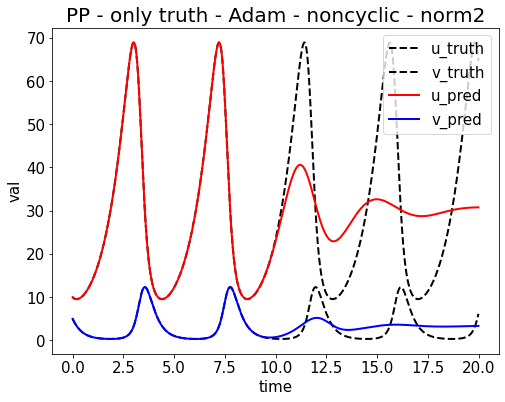

Saved as /content/drive/My Drive/Workspace/PINN//figure/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-04-00-02-39_1654301577.png


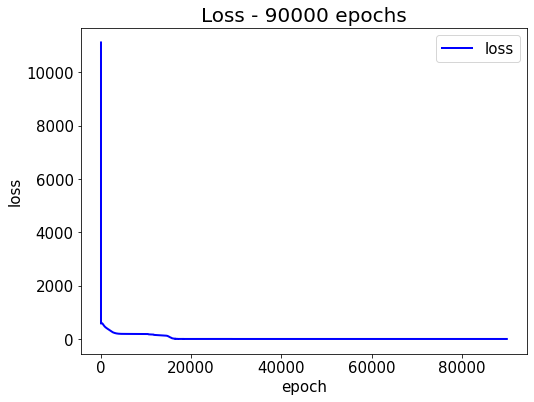

Epoch [91000/100000] Loss:0.091708 Loss_1:0.002663 Loss_2:0.089045 Loss_3:0.000000 Lr:0.000099 Time:7.723709s (10.42min in total, 1.03min remains)
Epoch [92000/100000] Loss:0.091029 Loss_1:0.002582 Loss_2:0.088446 Loss_3:0.000000 Lr:0.000098 Time:6.822256s (10.54min in total, 0.92min remains)
Epoch [93000/100000] Loss:0.090742 Loss_1:0.002609 Loss_2:0.088132 Loss_3:0.000000 Lr:0.000097 Time:6.667606s (10.65min in total, 0.80min remains)
Epoch [94000/100000] Loss:0.102417 Loss_1:0.003286 Loss_2:0.099131 Loss_3:0.000000 Lr:0.000096 Time:6.646689s (10.76min in total, 0.69min remains)
Epoch [95000/100000] Loss:0.089779 Loss_1:0.002559 Loss_2:0.087219 Loss_3:0.000000 Lr:0.000095 Time:6.644104s (10.87min in total, 0.57min remains)
Testing & drawing...
u= [9.997319, 9.949357, 9.904372, 9.86231, 9.823123, 9.786748, 9.753133, 9.722229, 9.693982, 9.668326] ... [30.641111, 30.63788, 30.634584, 30.631205, 30.627754, 30.624228, 30.620632, 30.616962, 30.613216, 30.6094]
v= [4.9932594, 4.896026, 4.79

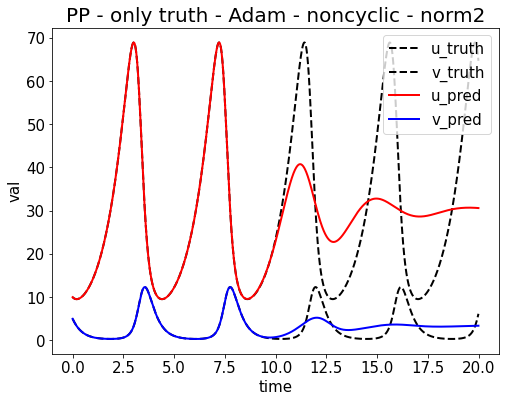

Saved as /content/drive/My Drive/Workspace/PINN//figure/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-04-00-02-39_1654301611.png


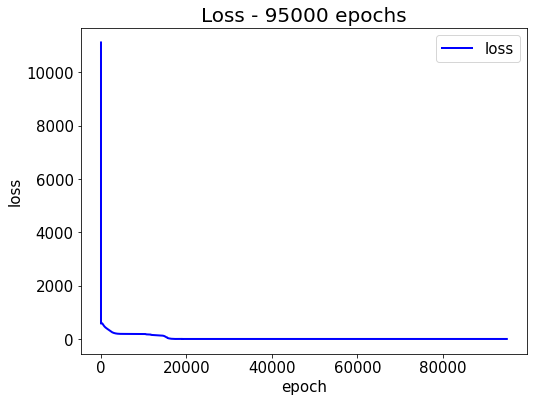

Epoch [96000/100000] Loss:0.090101 Loss_1:0.002619 Loss_2:0.087482 Loss_3:0.000000 Lr:0.000094 Time:7.669924s (11.00min in total, 0.46min remains)
Epoch [97000/100000] Loss:0.088856 Loss_1:0.002543 Loss_2:0.086313 Loss_3:0.000000 Lr:0.000093 Time:6.661299s (11.11min in total, 0.34min remains)
Epoch [98000/100000] Loss:0.088459 Loss_1:0.002544 Loss_2:0.085914 Loss_3:0.000000 Lr:0.000093 Time:6.636252s (11.22min in total, 0.23min remains)
Epoch [99000/100000] Loss:0.087918 Loss_1:0.002535 Loss_2:0.085383 Loss_3:0.000000 Lr:0.000092 Time:6.601931s (11.33min in total, 0.11min remains)
Epoch [100000/100000] Loss:0.087341 Loss_1:0.002511 Loss_2:0.084830 Loss_3:0.000000 Lr:0.000091 Time:6.666113s (11.44min in total, 0.00min remains)
Testing & drawing...
u= [9.997622, 9.9496, 9.904567, 9.862469, 9.823246, 9.786854, 9.753231, 9.722325, 9.694079, 9.668431] ... [30.486801, 30.477217, 30.467505, 30.457676, 30.447733, 30.437672, 30.42749, 30.417206, 30.406794, 30.396276]
v= [4.9938626, 4.896474, 4.

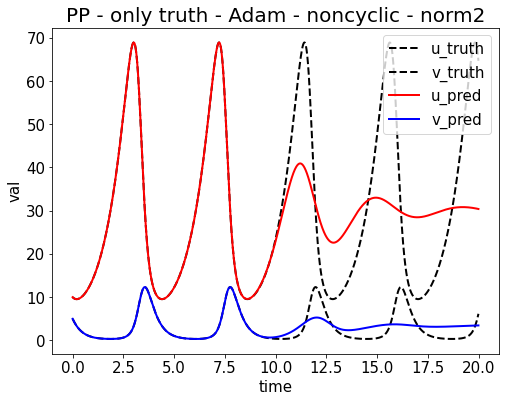

Saved as /content/drive/My Drive/Workspace/PINN//figure/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-04-00-02-39_1654301646.png


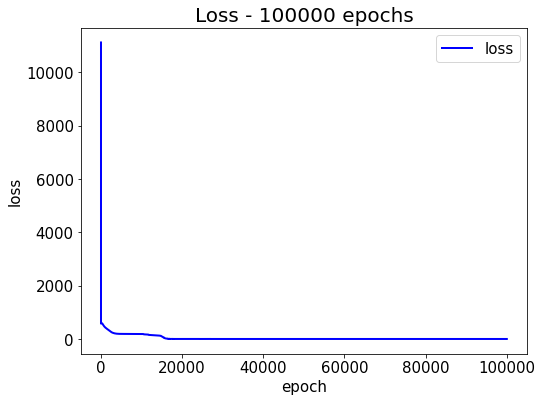

tensor board path: /content/drive/My Drive/Workspace/PINN//board/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-04-00-02-39_board
%load_ext tensorboard
%tensorboard --logdir=/content/drive/My\ Drive/Workspace/PINN//board/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-04-00-02-39_board


In [ ]:
# PP - 0.50 truth + loss2 + loss3
main_path = '/content/drive/My Drive/Workspace/PINN/' # ENZE marked: you need to change your main_path if it's not here
run_pp_truth(main_path)

continue_id = None: [0, 20.0] is mapped to [[-1. -1.], [0.999 0.999]]
using cuda
epoch = 100000
epoch_step = 1000
model_name = SimpleNetworkPP_Truth
now_string = 2022-06-03-22-46-18
model_save_path_last = /content/drive/My Drive/Workspace/PINN//train/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-03-22-46-18_last.pt
model_save_path_best = /content/drive/My Drive/Workspace/PINN//train/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-03-22-46-18_best.pt
loss_save_path = /content/drive/My Drive/Workspace/PINN//loss/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-03-22-46-18_loss_100000.npy
args = {'epoch': 100000, 'epoch_step': 1000, 'lr': 0.001, 'main_path': '/content/drive/My Drive/Workspace/PINN/', 'save_step': 5000}
config = {'model_name': 'SimpleNetworkPP_Truth', 'T': 20.0, 'T_all': 20.0, 'T_unit': 0.01, 'N': 2000, 'U_start': 10.0, 'V_start': 5.0, 'alpha': 1.0, 'beta': 3.0, 'gamma': 0.3, 'e': 0.333, 'ub': 20.0, 'lb': 0.0, 'continue_period': 0.2, 'round_bit': 3, 'continue_id': None, '

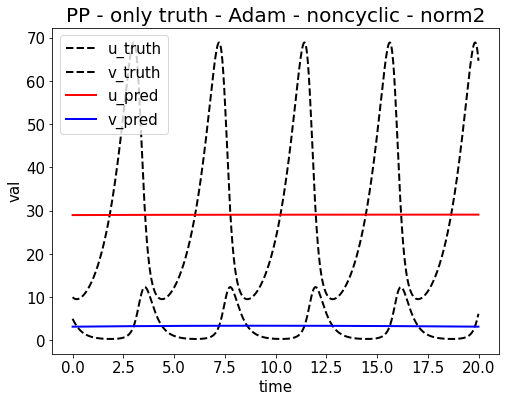

Saved as /content/drive/My Drive/Workspace/PINN//figure/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-03-22-46-18_1654296411.png


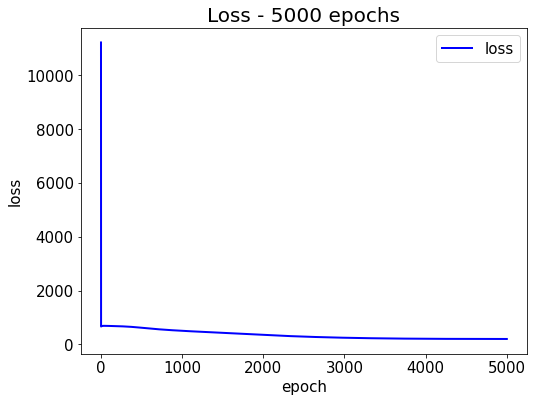

Epoch [06000/100000] Loss:203.510788 Loss_1:203.388519 Loss_2:0.122272 Loss_3:0.000000 Lr:0.000625 Time:7.588700s (0.68min in total, 10.65min remains)
Epoch [07000/100000] Loss:194.622284 Loss_1:192.832123 Loss_2:1.790160 Loss_3:0.000000 Lr:0.000588 Time:6.566675s (0.79min in total, 10.48min remains)
Epoch [08000/100000] Loss:191.989502 Loss_1:191.228348 Loss_2:0.761154 Loss_3:0.000002 Lr:0.000556 Time:6.574046s (0.90min in total, 10.33min remains)
Epoch [09000/100000] Loss:191.437271 Loss_1:191.006424 Loss_2:0.430595 Loss_3:0.000262 Lr:0.000526 Time:6.576114s (1.01min in total, 10.19min remains)
Epoch [10000/100000] Loss:191.242661 Loss_1:190.862289 Loss_2:0.380377 Loss_3:0.000000 Lr:0.000500 Time:6.584095s (1.12min in total, 10.06min remains)
Testing & drawing...
u= [6.7562566, 6.8149614, 6.874128, 6.933772, 6.993888, 7.054488, 7.1155677, 7.1771436, 7.239213, 7.3017755] ... [31.510818, 31.510818, 31.510822, 31.510824, 31.510822, 31.510822, 31.51082, 31.51082, 31.510822, 31.510824]
v=

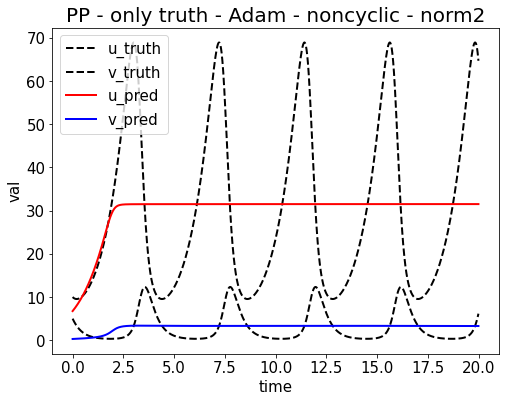

Saved as /content/drive/My Drive/Workspace/PINN//figure/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-03-22-46-18_1654296445.png


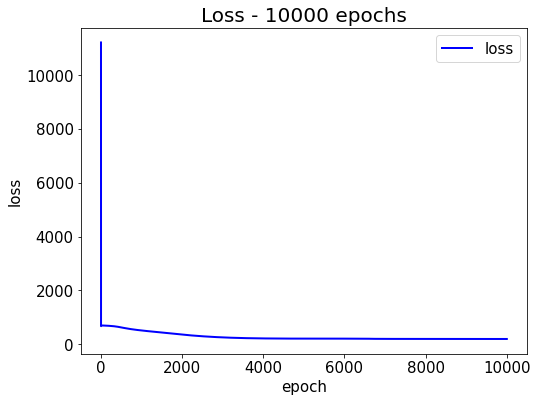

Epoch [11000/100000] Loss:191.185791 Loss_1:190.796417 Loss_2:0.389370 Loss_3:0.000000 Lr:0.000476 Time:7.656885s (1.25min in total, 10.08min remains)
Epoch [12000/100000] Loss:191.159988 Loss_1:190.762253 Loss_2:0.397731 Loss_3:0.000000 Lr:0.000455 Time:6.533113s (1.35min in total, 9.93min remains)
Epoch [13000/100000] Loss:191.141769 Loss_1:190.741974 Loss_2:0.399790 Loss_3:0.000000 Lr:0.000435 Time:6.624863s (1.46min in total, 9.80min remains)
Epoch [14000/100000] Loss:191.117722 Loss_1:190.716476 Loss_2:0.401252 Loss_3:0.000000 Lr:0.000417 Time:6.562634s (1.57min in total, 9.67min remains)
Epoch [15000/100000] Loss:191.052261 Loss_1:190.660553 Loss_2:0.391708 Loss_3:0.000000 Lr:0.000400 Time:6.625858s (1.68min in total, 9.55min remains)
Testing & drawing...
u= [8.1456585, 8.182669, 8.219999, 8.257657, 8.29565, 8.333981, 8.372661, 8.411699, 8.451103, 8.490881] ... [31.510914, 31.510916, 31.510912, 31.510912, 31.510912, 31.510912, 31.510912, 31.510908, 31.510912, 31.510912]
v= [2.017

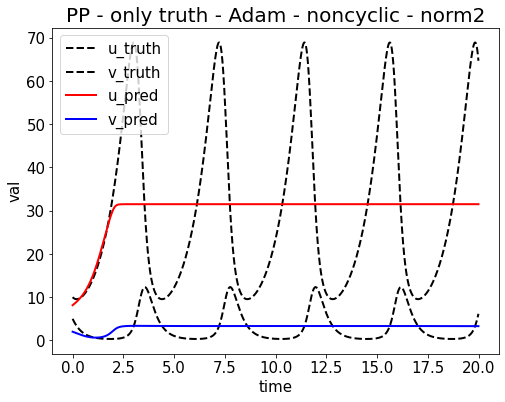

Saved as /content/drive/My Drive/Workspace/PINN//figure/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-03-22-46-18_1654296479.png


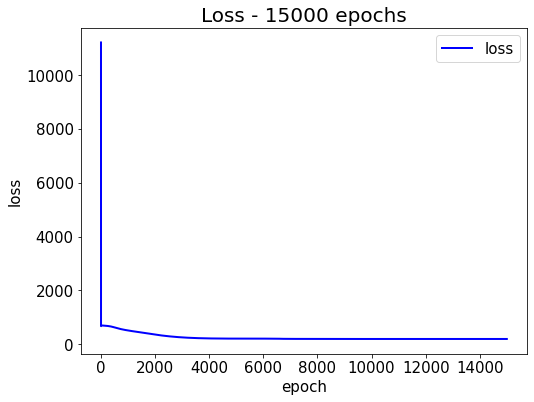

Epoch [16000/100000] Loss:190.997345 Loss_1:190.628113 Loss_2:0.369225 Loss_3:0.000000 Lr:0.000385 Time:7.595815s (1.81min in total, 9.51min remains)
Epoch [17000/100000] Loss:182.414917 Loss_1:181.504501 Loss_2:0.910419 Loss_3:0.000000 Lr:0.000370 Time:6.787777s (1.92min in total, 9.40min remains)
Epoch [18000/100000] Loss:156.385010 Loss_1:153.960892 Loss_2:2.424120 Loss_3:0.000000 Lr:0.000357 Time:6.630204s (2.03min in total, 9.27min remains)
Epoch [19000/100000] Loss:148.851471 Loss_1:146.999649 Loss_2:1.851819 Loss_3:0.000000 Lr:0.000345 Time:6.687977s (2.15min in total, 9.15min remains)
Epoch [20000/100000] Loss:144.791000 Loss_1:142.739532 Loss_2:2.051465 Loss_3:0.000000 Lr:0.000333 Time:6.632888s (2.26min in total, 9.03min remains)
Testing & drawing...
u= [9.123451, 9.128436, 9.13415, 9.140575, 9.1477375, 9.155624, 9.164255, 9.173647, 9.183773, 9.194665] ... [58.082443, 58.091846, 58.100403, 58.108196, 58.11531, 58.121803, 58.12774, 58.13318, 58.138153, 58.142723]
v= [3.9312744

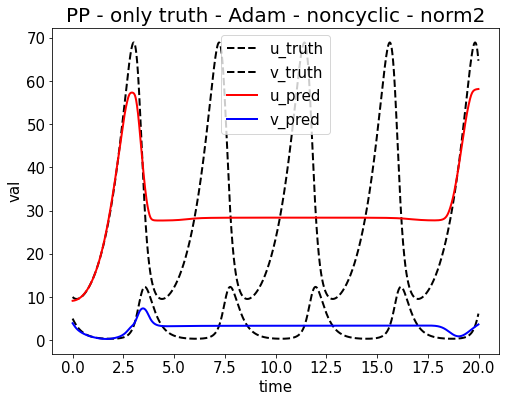

Saved as /content/drive/My Drive/Workspace/PINN//figure/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-03-22-46-18_1654296513.png


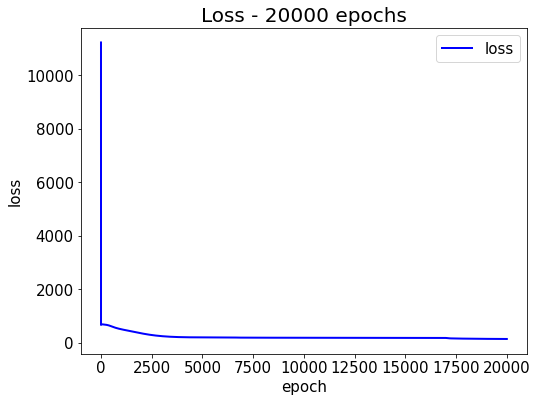

Epoch [21000/100000] Loss:122.181763 Loss_1:119.054817 Loss_2:3.126947 Loss_3:0.000000 Lr:0.000323 Time:7.549399s (2.38min in total, 8.96min remains)
Epoch [22000/100000] Loss:112.956474 Loss_1:110.536476 Loss_2:2.420001 Loss_3:0.000000 Lr:0.000313 Time:6.558135s (2.49min in total, 8.84min remains)
Epoch [23000/100000] Loss:111.671883 Loss_1:109.551086 Loss_2:2.120797 Loss_3:0.000000 Lr:0.000303 Time:6.552900s (2.60min in total, 8.71min remains)
Epoch [24000/100000] Loss:111.098755 Loss_1:109.090614 Loss_2:2.008139 Loss_3:0.000000 Lr:0.000294 Time:6.661691s (2.71min in total, 8.59min remains)
Epoch [25000/100000] Loss:110.892387 Loss_1:108.920494 Loss_2:1.971896 Loss_3:0.000000 Lr:0.000286 Time:6.576030s (2.82min in total, 8.47min remains)
Testing & drawing...
u= [9.765654, 9.738672, 9.713136, 9.689065, 9.666478, 9.645357, 9.625716, 9.60757, 9.590894, 9.575713] ... [69.41787, 69.558525, 69.69168, 69.81744, 69.93597, 70.04747, 70.15217, 70.25034, 70.34224, 70.428154]
v= [4.7244706, 4.63

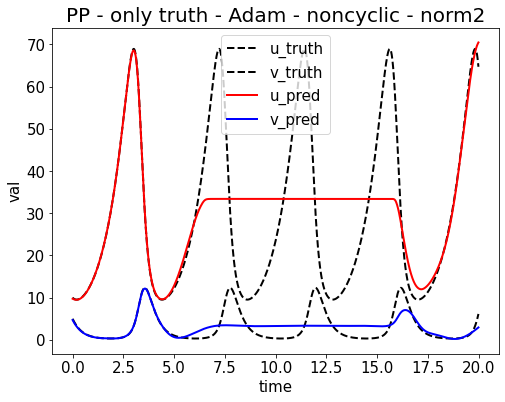

Saved as /content/drive/My Drive/Workspace/PINN//figure/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-03-22-46-18_1654296547.png


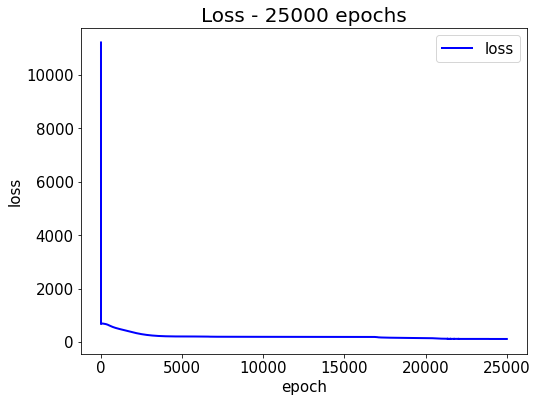

Epoch [26000/100000] Loss:109.149261 Loss_1:107.290245 Loss_2:1.859015 Loss_3:0.000000 Lr:0.000278 Time:7.615115s (2.95min in total, 8.39min remains)
Epoch [27000/100000] Loss:98.862915 Loss_1:96.820953 Loss_2:2.041964 Loss_3:0.000000 Lr:0.000270 Time:6.626425s (3.06min in total, 8.27min remains)
Epoch [28000/100000] Loss:86.142448 Loss_1:81.923141 Loss_2:4.219305 Loss_3:0.000000 Lr:0.000263 Time:6.640929s (3.17min in total, 8.15min remains)
Epoch [29000/100000] Loss:78.024803 Loss_1:75.764305 Loss_2:2.260497 Loss_3:0.000000 Lr:0.000256 Time:6.632260s (3.28min in total, 8.03min remains)
Epoch [30000/100000] Loss:64.816185 Loss_1:62.475857 Loss_2:2.340322 Loss_3:0.000008 Lr:0.000250 Time:6.631013s (3.39min in total, 7.91min remains)
Testing & drawing...
u= [9.857787, 9.825098, 9.794069, 9.764701, 9.737004, 9.710996, 9.68665, 9.663993, 9.643013, 9.623723] ... [69.74212, 69.8761, 70.004166, 70.126625, 70.24382, 70.35601, 70.46349, 70.56653, 70.665405, 70.76035]
v= [4.829151, 4.732967, 4.6

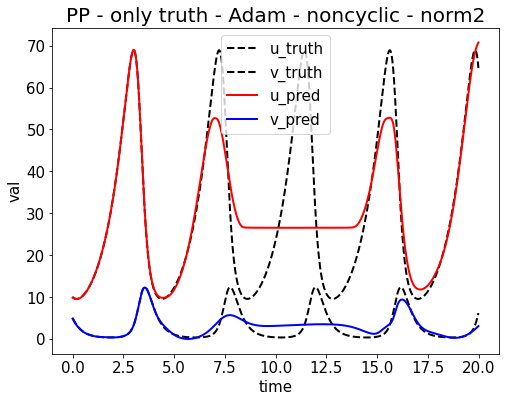

Saved as /content/drive/My Drive/Workspace/PINN//figure/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-03-22-46-18_1654296581.png


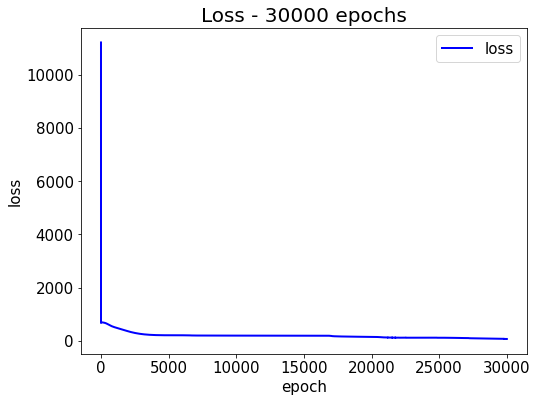

Epoch [31000/100000] Loss:61.641739 Loss_1:59.250423 Loss_2:2.391306 Loss_3:0.000011 Lr:0.000244 Time:7.567880s (3.52min in total, 7.83min remains)
Epoch [32000/100000] Loss:58.794762 Loss_1:56.518654 Loss_2:2.276107 Loss_3:0.000000 Lr:0.000238 Time:6.580511s (3.63min in total, 7.71min remains)
Epoch [33000/100000] Loss:55.115204 Loss_1:52.908508 Loss_2:2.206694 Loss_3:0.000000 Lr:0.000233 Time:6.627958s (3.74min in total, 7.59min remains)
Epoch [34000/100000] Loss:48.392612 Loss_1:45.759472 Loss_2:2.633142 Loss_3:0.000000 Lr:0.000227 Time:6.596632s (3.85min in total, 7.47min remains)
Epoch [35000/100000] Loss:45.837875 Loss_1:43.336346 Loss_2:2.501531 Loss_3:0.000000 Lr:0.000222 Time:6.612653s (3.96min in total, 7.35min remains)
Testing & drawing...
u= [9.899197, 9.862873, 9.828434, 9.795843, 9.765154, 9.736317, 9.709332, 9.684214, 9.660955, 9.639533] ... [69.50309, 69.61447, 69.71837, 69.815216, 69.905495, 69.98961, 70.06799, 70.14105, 70.209175, 70.272705]
v= [4.8837557, 4.786336, 4

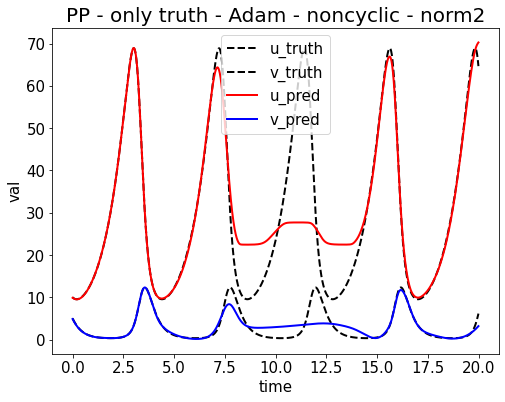

Saved as /content/drive/My Drive/Workspace/PINN//figure/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-03-22-46-18_1654296615.png


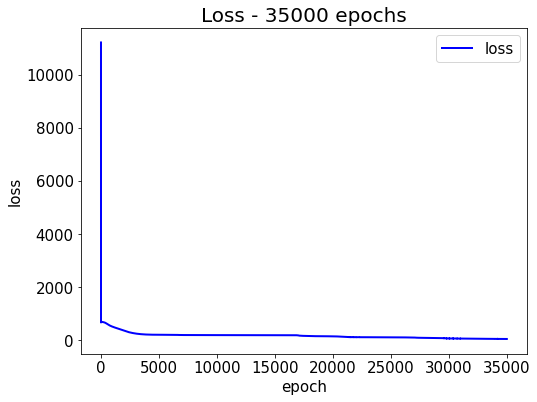

Epoch [36000/100000] Loss:41.344704 Loss_1:38.844433 Loss_2:2.500273 Loss_3:0.000000 Lr:0.000217 Time:7.676780s (4.09min in total, 7.26min remains)
Epoch [37000/100000] Loss:36.052212 Loss_1:33.658348 Loss_2:2.393864 Loss_3:0.000000 Lr:0.000213 Time:6.663754s (4.20min in total, 7.15min remains)
Epoch [38000/100000] Loss:31.416573 Loss_1:29.188656 Loss_2:2.227916 Loss_3:0.000000 Lr:0.000208 Time:6.660693s (4.31min in total, 7.03min remains)
Epoch [39000/100000] Loss:28.179756 Loss_1:26.060560 Loss_2:2.119196 Loss_3:0.000000 Lr:0.000204 Time:6.612299s (4.42min in total, 6.91min remains)
Epoch [40000/100000] Loss:18.773422 Loss_1:17.046888 Loss_2:1.726533 Loss_3:0.000000 Lr:0.000200 Time:6.660372s (4.53min in total, 6.79min remains)
Testing & drawing...
u= [9.932459, 9.893326, 9.856263, 9.8212595, 9.788333, 9.757439, 9.728584, 9.701747, 9.676919, 9.654084] ... [68.89834, 68.92483, 68.93898, 68.94158, 68.933495, 68.91559, 68.888725, 68.853745, 68.81146, 68.76267]
v= [4.924293, 4.8266244, 4

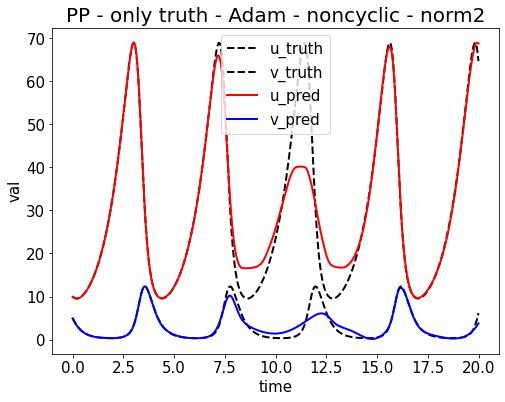

Saved as /content/drive/My Drive/Workspace/PINN//figure/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-03-22-46-18_1654296650.png


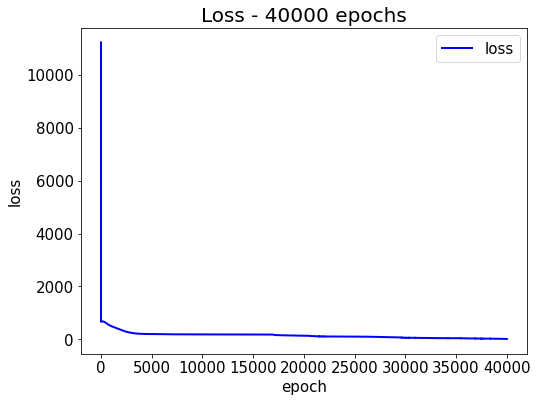

Epoch [41000/100000] Loss:14.405057 Loss_1:12.873052 Loss_2:1.532006 Loss_3:0.000000 Lr:0.000196 Time:7.655888s (4.66min in total, 6.70min remains)
Epoch [42000/100000] Loss:11.722698 Loss_1:9.429367 Loss_2:2.293331 Loss_3:0.000000 Lr:0.000192 Time:6.613289s (4.77min in total, 6.58min remains)
Epoch [43000/100000] Loss:8.270454 Loss_1:7.065615 Loss_2:1.204840 Loss_3:0.000000 Lr:0.000189 Time:6.628585s (4.88min in total, 6.46min remains)
Epoch [44000/100000] Loss:5.971055 Loss_1:4.867087 Loss_2:1.103968 Loss_3:0.000000 Lr:0.000185 Time:6.595358s (4.99min in total, 6.35min remains)
Epoch [45000/100000] Loss:4.154983 Loss_1:3.110638 Loss_2:1.044344 Loss_3:0.000000 Lr:0.000182 Time:6.628429s (5.10min in total, 6.23min remains)
Testing & drawing...
u= [9.962286, 9.921374, 9.882638, 9.846096, 9.811707, 9.779472, 9.749369, 9.721382, 9.695496, 9.671674] ... [67.75422, 67.62832, 67.479546, 67.30815, 67.11469, 66.90007, 66.66541, 66.41206, 66.14152, 65.855415]
v= [4.944223, 4.8459888, 4.749787, 

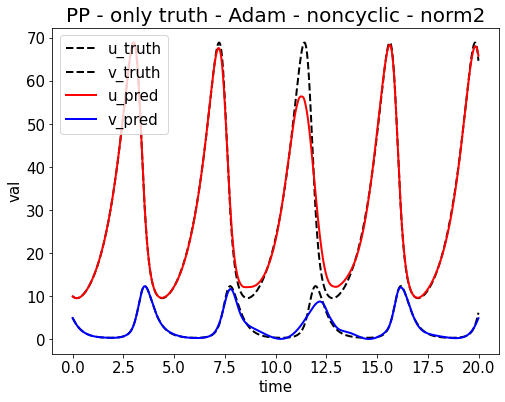

Saved as /content/drive/My Drive/Workspace/PINN//figure/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-03-22-46-18_1654296684.png


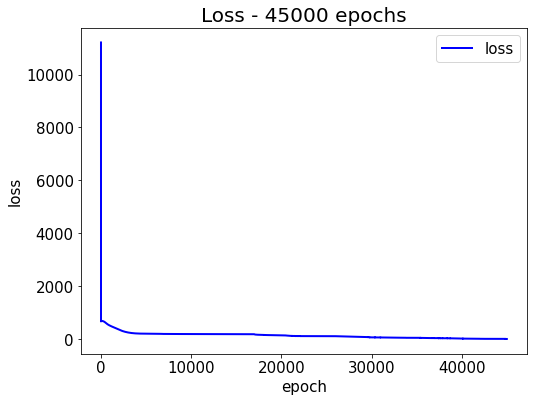

Epoch [46000/100000] Loss:3.151843 Loss_1:2.149154 Loss_2:1.002676 Loss_3:0.000013 Lr:0.000179 Time:7.605873s (5.22min in total, 6.13min remains)
Epoch [47000/100000] Loss:2.748701 Loss_1:1.490175 Loss_2:1.256893 Loss_3:0.001633 Lr:0.000175 Time:6.611313s (5.33min in total, 6.02min remains)
Epoch [48000/100000] Loss:1.933061 Loss_1:1.035710 Loss_2:0.896836 Loss_3:0.000514 Lr:0.000172 Time:6.571996s (5.44min in total, 5.90min remains)
Epoch [49000/100000] Loss:1.557000 Loss_1:0.732511 Loss_2:0.823977 Loss_3:0.000511 Lr:0.000169 Time:6.579273s (5.55min in total, 5.78min remains)
Epoch [50000/100000] Loss:1.352277 Loss_1:0.533518 Loss_2:0.817966 Loss_3:0.000793 Lr:0.000167 Time:6.625036s (5.66min in total, 5.66min remains)
Testing & drawing...
u= [9.950217, 9.908242, 9.868545, 9.831107, 9.795898, 9.762929, 9.73213, 9.703525, 9.677077, 9.652772] ... [67.59671, 67.40687, 67.18935, 66.94369, 66.6697, 66.36776, 66.038635, 65.683495, 65.30397, 64.90204]
v= [4.9626245, 4.864085, 4.7676167, 4.67

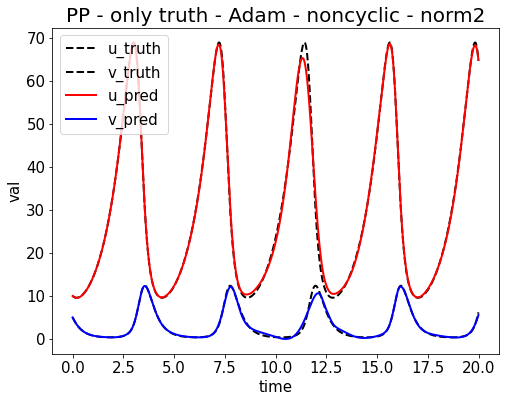

Saved as /content/drive/My Drive/Workspace/PINN//figure/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-03-22-46-18_1654296718.png


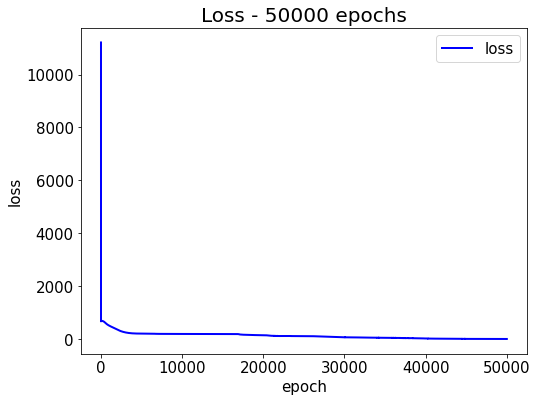

Epoch [51000/100000] Loss:1.067080 Loss_1:0.395981 Loss_2:0.671096 Loss_3:0.000003 Lr:0.000164 Time:7.607415s (5.79min in total, 5.56min remains)
Epoch [52000/100000] Loss:0.837383 Loss_1:0.295370 Loss_2:0.542013 Loss_3:0.000000 Lr:0.000161 Time:6.604907s (5.90min in total, 5.45min remains)
Epoch [53000/100000] Loss:0.673745 Loss_1:0.219615 Loss_2:0.454129 Loss_3:0.000000 Lr:0.000159 Time:6.604401s (6.01min in total, 5.33min remains)
Epoch [54000/100000] Loss:0.520365 Loss_1:0.159024 Loss_2:0.361341 Loss_3:0.000000 Lr:0.000156 Time:6.619375s (6.12min in total, 5.21min remains)
Epoch [55000/100000] Loss:0.384990 Loss_1:0.111583 Loss_2:0.273407 Loss_3:0.000000 Lr:0.000154 Time:6.548222s (6.23min in total, 5.10min remains)
Testing & drawing...
u= [9.979623, 9.936898, 9.896497, 9.85842, 9.822638, 9.789118, 9.757855, 9.728812, 9.701977, 9.677317] ... [67.70645, 67.483955, 67.230354, 66.944626, 66.6262, 66.274994, 65.89153, 65.477005, 65.03314, 64.56232]
v= [4.9643273, 4.8654923, 4.768755, 4

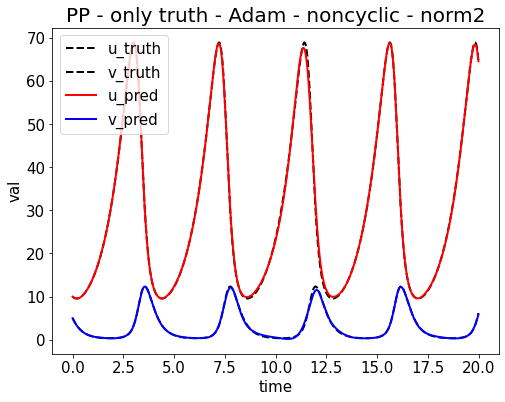

Saved as /content/drive/My Drive/Workspace/PINN//figure/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-03-22-46-18_1654296752.png


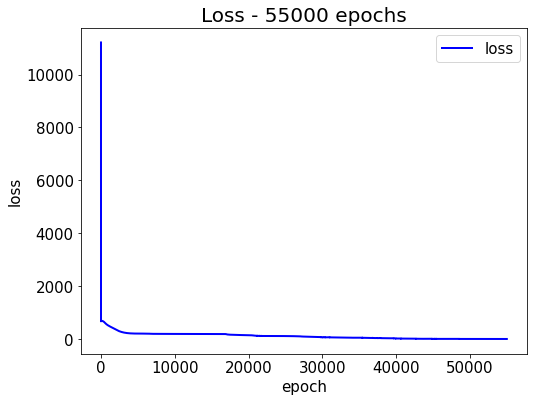

Epoch [56000/100000] Loss:0.280782 Loss_1:0.075885 Loss_2:0.204897 Loss_3:0.000000 Lr:0.000152 Time:7.575598s (6.36min in total, 4.99min remains)
Epoch [57000/100000] Loss:0.199795 Loss_1:0.049701 Loss_2:0.150093 Loss_3:0.000000 Lr:0.000149 Time:6.566896s (6.47min in total, 4.88min remains)
Epoch [58000/100000] Loss:0.142551 Loss_1:0.031847 Loss_2:0.110704 Loss_3:0.000000 Lr:0.000147 Time:6.627724s (6.58min in total, 4.76min remains)
Epoch [59000/100000] Loss:0.101241 Loss_1:0.020097 Loss_2:0.081144 Loss_3:0.000000 Lr:0.000145 Time:6.545551s (6.69min in total, 4.65min remains)
Epoch [60000/100000] Loss:0.075102 Loss_1:0.012877 Loss_2:0.062225 Loss_3:0.000000 Lr:0.000143 Time:6.613584s (6.80min in total, 4.53min remains)
Testing & drawing...
u= [9.980481, 9.937297, 9.896475, 9.858008, 9.821874, 9.788051, 9.756493, 9.727201, 9.700147, 9.67529] ... [67.91835, 67.684845, 67.41841, 67.117714, 66.78161, 66.409515, 66.00143, 65.55811, 65.08107, 64.57265]
v= [4.967412, 4.8683953, 4.771509, 4.6

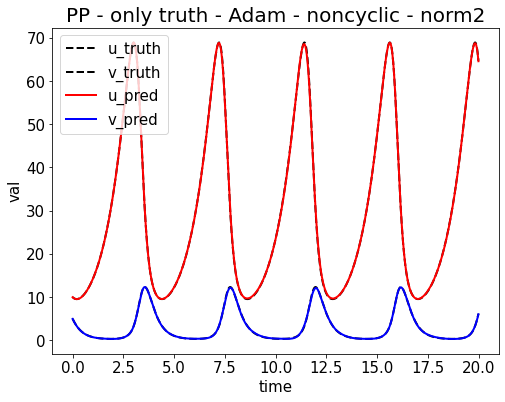

Saved as /content/drive/My Drive/Workspace/PINN//figure/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-03-22-46-18_1654296786.png


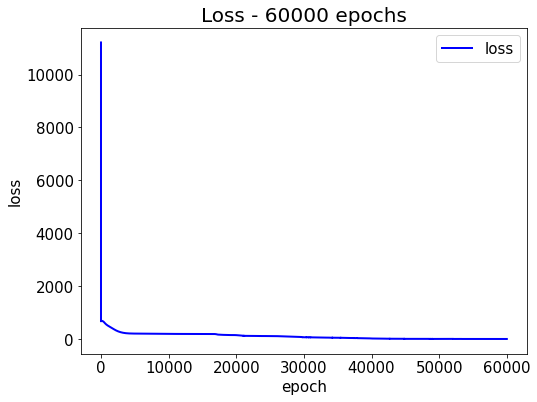

Epoch [61000/100000] Loss:0.058642 Loss_1:0.008554 Loss_2:0.050088 Loss_3:0.000000 Lr:0.000141 Time:7.816645s (6.93min in total, 4.43min remains)
Epoch [62000/100000] Loss:0.052879 Loss_1:0.005980 Loss_2:0.046898 Loss_3:0.000000 Lr:0.000139 Time:6.582771s (7.04min in total, 4.31min remains)
Epoch [63000/100000] Loss:0.051051 Loss_1:0.004514 Loss_2:0.046536 Loss_3:0.000000 Lr:0.000137 Time:6.776374s (7.15min in total, 4.20min remains)
Epoch [64000/100000] Loss:0.075211 Loss_1:0.004160 Loss_2:0.071050 Loss_3:0.000000 Lr:0.000135 Time:6.637271s (7.26min in total, 4.08min remains)
Epoch [65000/100000] Loss:0.033143 Loss_1:0.002853 Loss_2:0.030289 Loss_3:0.000000 Lr:0.000133 Time:6.669849s (7.37min in total, 3.97min remains)
Testing & drawing...
u= [9.981225, 9.937766, 9.896696, 9.858014, 9.82169, 9.787689, 9.755995, 9.72658, 9.699417, 9.674474] ... [68.06417, 67.828804, 67.55998, 67.25627, 66.916245, 66.53885, 66.12348, 65.67031, 65.18032, 64.65545]
v= [4.969211, 4.8700633, 4.7730784, 4.67

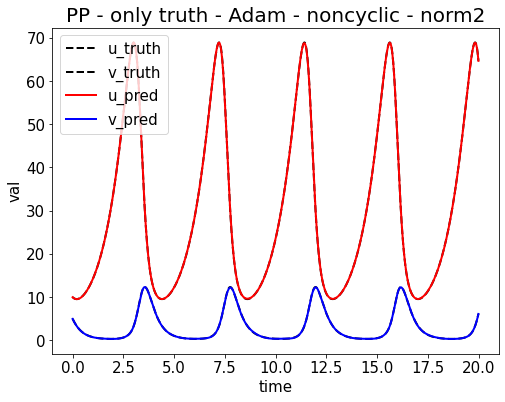

Saved as /content/drive/My Drive/Workspace/PINN//figure/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-03-22-46-18_1654296820.png


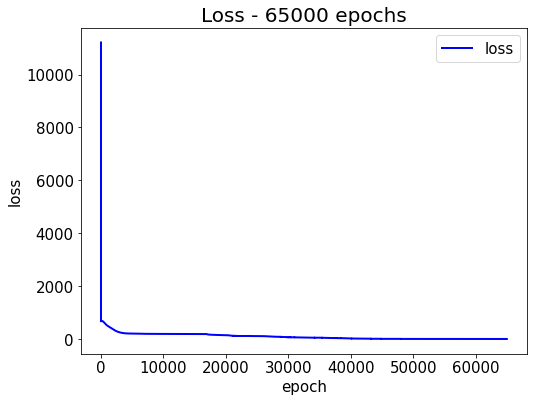

Epoch [66000/100000] Loss:0.030553 Loss_1:0.002510 Loss_2:0.028044 Loss_3:0.000000 Lr:0.000132 Time:7.566616s (7.50min in total, 3.86min remains)
Epoch [67000/100000] Loss:0.028418 Loss_1:0.002261 Loss_2:0.026157 Loss_3:0.000000 Lr:0.000130 Time:6.639310s (7.61min in total, 3.75min remains)
Epoch [68000/100000] Loss:0.949223 Loss_1:0.009261 Loss_2:0.939962 Loss_3:0.000000 Lr:0.000128 Time:6.588376s (7.72min in total, 3.63min remains)
Epoch [69000/100000] Loss:0.292013 Loss_1:0.003929 Loss_2:0.288084 Loss_3:0.000000 Lr:0.000127 Time:6.527146s (7.83min in total, 3.52min remains)
Epoch [70000/100000] Loss:0.024327 Loss_1:0.001787 Loss_2:0.022539 Loss_3:0.000000 Lr:0.000125 Time:6.780028s (7.94min in total, 3.40min remains)
Testing & drawing...
u= [9.995224, 9.951485, 9.9102, 9.871288, 9.834777, 9.800614, 9.768785, 9.739247, 9.711984, 9.686955] ... [68.11328, 67.878204, 67.60983, 67.30691, 66.96801, 66.59179, 66.17721, 65.72385, 65.23206, 64.703255]
v= [4.9668994, 4.867642, 4.7705636, 4.67

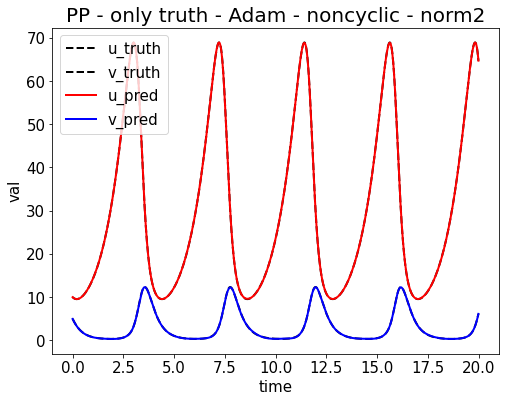

Saved as /content/drive/My Drive/Workspace/PINN//figure/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-03-22-46-18_1654296854.png


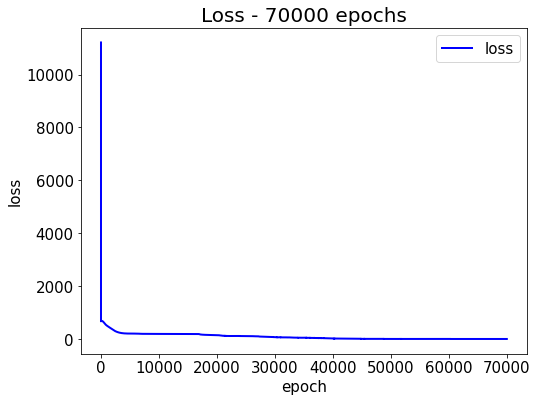

Epoch [71000/100000] Loss:0.022236 Loss_1:0.001622 Loss_2:0.020614 Loss_3:0.000000 Lr:0.000123 Time:7.583386s (8.07min in total, 3.29min remains)
Epoch [72000/100000] Loss:0.021333 Loss_1:0.001533 Loss_2:0.019800 Loss_3:0.000000 Lr:0.000122 Time:6.550953s (8.17min in total, 3.18min remains)
Epoch [73000/100000] Loss:0.020947 Loss_1:0.001498 Loss_2:0.019449 Loss_3:0.000000 Lr:0.000120 Time:6.862334s (8.29min in total, 3.07min remains)
Epoch [74000/100000] Loss:0.020030 Loss_1:0.001429 Loss_2:0.018600 Loss_3:0.000000 Lr:0.000119 Time:6.737663s (8.40min in total, 2.95min remains)
Epoch [75000/100000] Loss:0.034477 Loss_1:0.001508 Loss_2:0.032969 Loss_3:0.000000 Lr:0.000118 Time:6.649841s (8.51min in total, 2.84min remains)
Testing & drawing...
u= [9.993114, 9.949142, 9.907628, 9.868533, 9.831843, 9.797534, 9.765573, 9.735931, 9.708582, 9.683486] ... [68.112686, 67.87536, 67.604836, 67.30005, 66.95967, 66.58235, 66.16679, 65.71219, 65.21846, 64.68649]
v= [4.9710097, 4.871663, 4.7745085, 4.

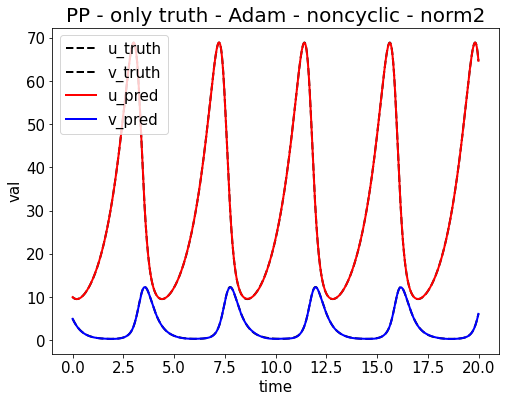

Saved as /content/drive/My Drive/Workspace/PINN//figure/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-03-22-46-18_1654296889.png


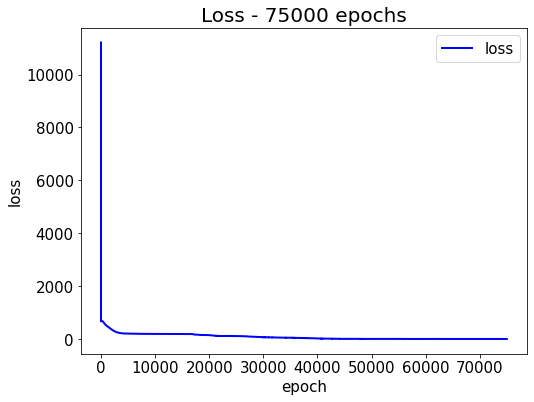

Epoch [76000/100000] Loss:0.022286 Loss_1:0.001441 Loss_2:0.020845 Loss_3:0.000000 Lr:0.000116 Time:7.722180s (8.64min in total, 2.73min remains)
Epoch [77000/100000] Loss:0.019041 Loss_1:0.001305 Loss_2:0.017736 Loss_3:0.000000 Lr:0.000115 Time:6.683327s (8.75min in total, 2.61min remains)
Epoch [78000/100000] Loss:0.020244 Loss_1:0.001366 Loss_2:0.018879 Loss_3:0.000000 Lr:0.000114 Time:6.658907s (8.86min in total, 2.50min remains)
Epoch [79000/100000] Loss:0.017586 Loss_1:0.001222 Loss_2:0.016364 Loss_3:0.000000 Lr:0.000112 Time:6.608513s (8.97min in total, 2.39min remains)
Epoch [80000/100000] Loss:0.019148 Loss_1:0.001348 Loss_2:0.017799 Loss_3:0.000000 Lr:0.000111 Time:6.584791s (9.08min in total, 2.27min remains)
Testing & drawing...
u= [9.950646, 9.906365, 9.864596, 9.82528, 9.788392, 9.7539, 9.721777, 9.692006, 9.664548, 9.63936] ... [68.16108, 67.92455, 67.65482, 67.35106, 67.01209, 66.63655, 66.22305, 65.77044, 65.27817, 64.74663]
v= [4.9881644, 4.888794, 4.791609, 4.6964955

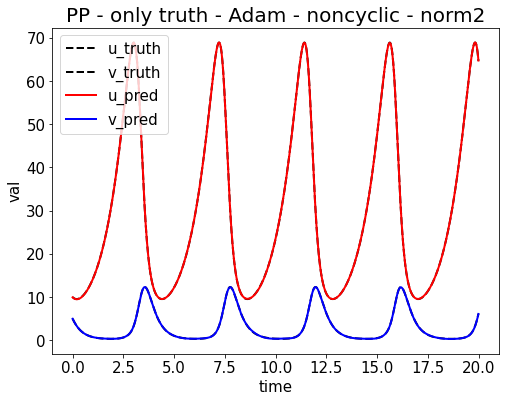

Saved as /content/drive/My Drive/Workspace/PINN//figure/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-03-22-46-18_1654296923.png


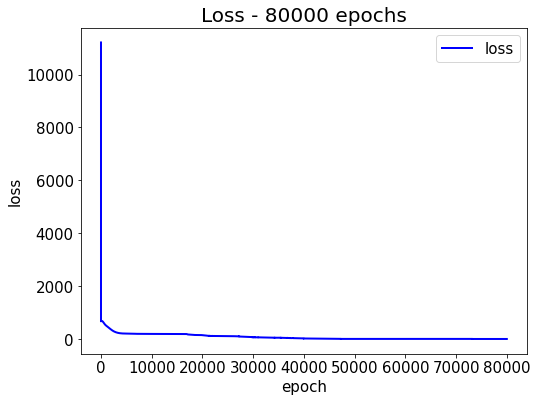

Epoch [81000/100000] Loss:0.017646 Loss_1:0.001229 Loss_2:0.016416 Loss_3:0.000000 Lr:0.000110 Time:7.610351s (9.21min in total, 2.16min remains)
Epoch [82000/100000] Loss:0.019928 Loss_1:0.001301 Loss_2:0.018627 Loss_3:0.000000 Lr:0.000109 Time:6.594391s (9.32min in total, 2.05min remains)
Epoch [83000/100000] Loss:0.016266 Loss_1:0.001145 Loss_2:0.015121 Loss_3:0.000000 Lr:0.000108 Time:6.622525s (9.43min in total, 1.93min remains)
Epoch [84000/100000] Loss:0.015974 Loss_1:0.001115 Loss_2:0.014859 Loss_3:0.000000 Lr:0.000106 Time:6.620083s (9.54min in total, 1.82min remains)
Epoch [85000/100000] Loss:0.016203 Loss_1:0.001128 Loss_2:0.015075 Loss_3:0.000000 Lr:0.000105 Time:6.589282s (9.65min in total, 1.70min remains)
Testing & drawing...
u= [9.981465, 9.936946, 9.89496, 9.855451, 9.818394, 9.783757, 9.751524, 9.721648, 9.694097, 9.668847] ... [68.11548, 67.87517, 67.60156, 67.29397, 66.95136, 66.572525, 66.15593, 65.70029, 65.20475, 64.66933]
v= [4.9815283, 4.8821044, 4.7848682, 4.6

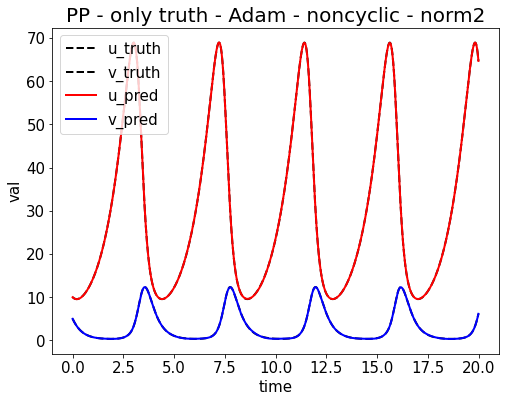

Saved as /content/drive/My Drive/Workspace/PINN//figure/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-03-22-46-18_1654296957.png


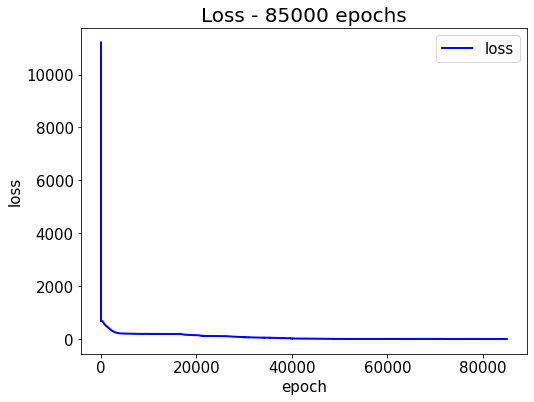

Epoch [86000/100000] Loss:0.015485 Loss_1:0.001088 Loss_2:0.014397 Loss_3:0.000000 Lr:0.000104 Time:7.702727s (9.78min in total, 1.59min remains)
Epoch [87000/100000] Loss:0.018398 Loss_1:0.001110 Loss_2:0.017287 Loss_3:0.000000 Lr:0.000103 Time:6.611351s (9.89min in total, 1.48min remains)
Epoch [88000/100000] Loss:0.014880 Loss_1:0.001042 Loss_2:0.013838 Loss_3:0.000000 Lr:0.000102 Time:6.615465s (10.00min in total, 1.36min remains)
Epoch [89000/100000] Loss:0.014745 Loss_1:0.001029 Loss_2:0.013716 Loss_3:0.000000 Lr:0.000101 Time:6.636861s (10.11min in total, 1.25min remains)
Epoch [90000/100000] Loss:0.014411 Loss_1:0.001018 Loss_2:0.013393 Loss_3:0.000000 Lr:0.000100 Time:6.580893s (10.22min in total, 1.14min remains)
Testing & drawing...
u= [9.988936, 9.944204, 9.902003, 9.862327, 9.825123, 9.790367, 9.7580185, 9.728056, 9.700449, 9.675147] ... [68.1134, 67.872055, 67.597275, 67.28854, 66.94496, 66.565384, 66.1483, 65.69223, 65.19603, 64.65936]
v= [4.9799175, 4.880475, 4.783205, 

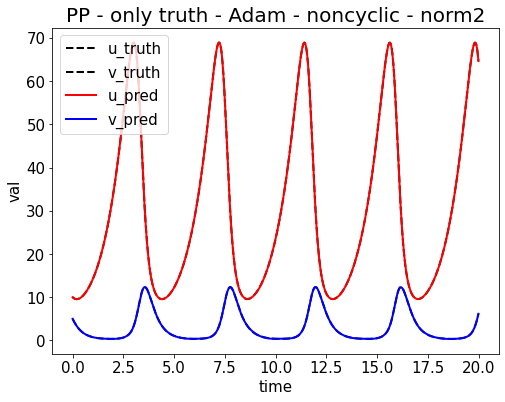

Saved as /content/drive/My Drive/Workspace/PINN//figure/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-03-22-46-18_1654296991.png


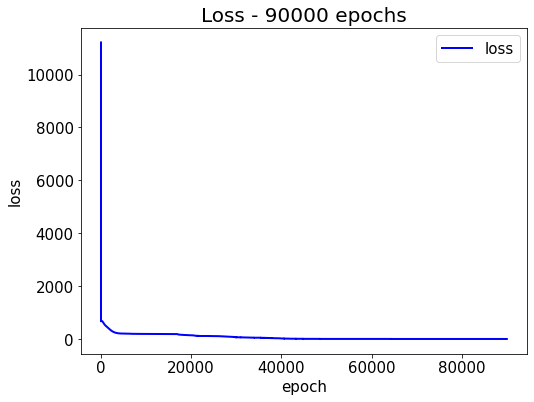

Epoch [91000/100000] Loss:0.016643 Loss_1:0.001047 Loss_2:0.015595 Loss_3:0.000000 Lr:0.000099 Time:7.570438s (10.35min in total, 1.02min remains)
Epoch [92000/100000] Loss:0.013943 Loss_1:0.000983 Loss_2:0.012959 Loss_3:0.000000 Lr:0.000098 Time:6.709103s (10.46min in total, 0.91min remains)
Epoch [93000/100000] Loss:0.013820 Loss_1:0.000986 Loss_2:0.012834 Loss_3:0.000000 Lr:0.000097 Time:6.614929s (10.57min in total, 0.80min remains)
Epoch [94000/100000] Loss:0.013553 Loss_1:0.000963 Loss_2:0.012591 Loss_3:0.000000 Lr:0.000096 Time:6.598132s (10.68min in total, 0.68min remains)
Epoch [95000/100000] Loss:0.013323 Loss_1:0.000942 Loss_2:0.012381 Loss_3:0.000000 Lr:0.000095 Time:6.595278s (10.79min in total, 0.57min remains)
Testing & drawing...
u= [9.990054, 9.9451065, 9.902734, 9.862878, 9.825539, 9.790666, 9.7582245, 9.728164, 9.700491, 9.675142] ... [68.113396, 67.87146, 67.595955, 67.28647, 66.94225, 66.56226, 66.14499, 65.68883, 65.19237, 64.654945]
v= [4.981356, 4.8818913, 4.784

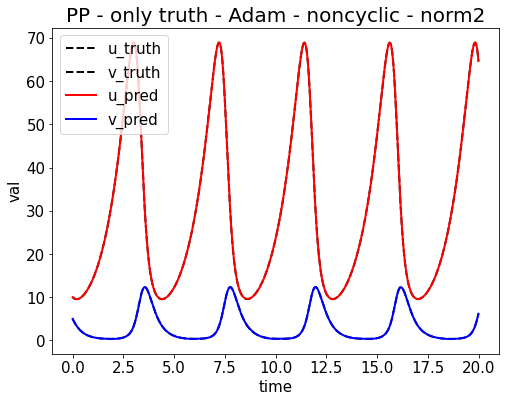

Saved as /content/drive/My Drive/Workspace/PINN//figure/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-03-22-46-18_1654297025.png


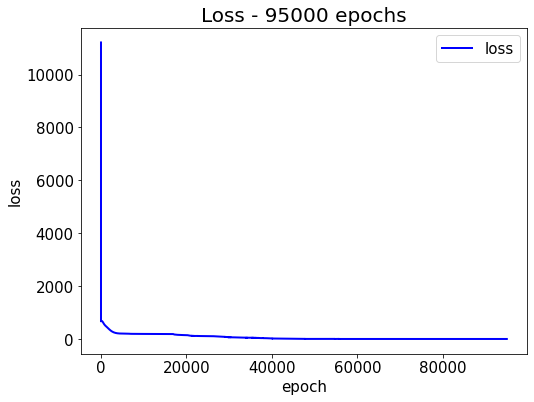

Epoch [96000/100000] Loss:0.022490 Loss_1:0.001256 Loss_2:0.021234 Loss_3:0.000000 Lr:0.000094 Time:7.563855s (10.91min in total, 0.45min remains)
Epoch [97000/100000] Loss:0.012954 Loss_1:0.000918 Loss_2:0.012035 Loss_3:0.000000 Lr:0.000093 Time:6.657098s (11.02min in total, 0.34min remains)
Epoch [98000/100000] Loss:0.012811 Loss_1:0.000926 Loss_2:0.011885 Loss_3:0.000000 Lr:0.000093 Time:6.590572s (11.13min in total, 0.23min remains)
Epoch [99000/100000] Loss:0.012602 Loss_1:0.000896 Loss_2:0.011705 Loss_3:0.000000 Lr:0.000092 Time:6.532845s (11.24min in total, 0.11min remains)
Epoch [100000/100000] Loss:0.015118 Loss_1:0.000970 Loss_2:0.014148 Loss_3:0.000000 Lr:0.000091 Time:6.602946s (11.35min in total, 0.00min remains)
Testing & drawing...
u= [9.977829, 9.932604, 9.889969, 9.849894, 9.812342, 9.777284, 9.744669, 9.714475, 9.686672, 9.661215] ... [68.12621, 67.88516, 67.61044, 67.30174, 66.95845, 66.57958, 66.1637, 65.70909, 65.214165, 64.677864]
v= [4.9912677, 4.891758, 4.794404

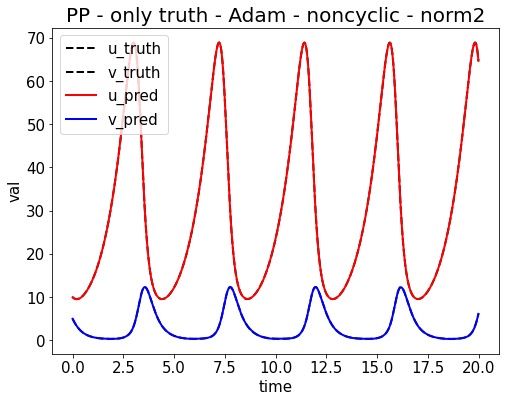

Saved as /content/drive/My Drive/Workspace/PINN//figure/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-03-22-46-18_1654297059.png


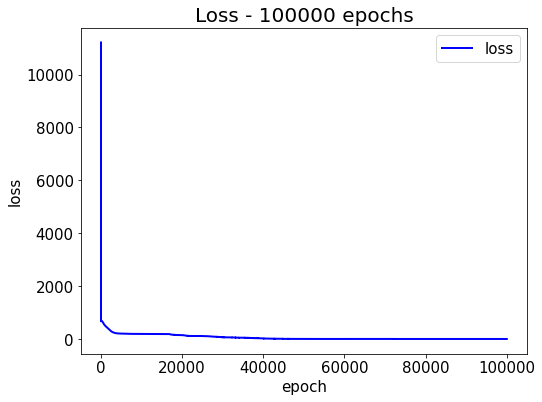

tensor board path: /content/drive/My Drive/Workspace/PINN//board/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-03-22-46-18_board
%load_ext tensorboard
%tensorboard --logdir=/content/drive/My\ Drive/Workspace/PINN//board/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-03-22-46-18_board


In [ ]:
# PP - 1.00 truth + loss2 + loss3
main_path = '/content/drive/My Drive/Workspace/PINN/' # ENZE marked: you need to change your main_path if it's not here
run_pp_truth(main_path)

continue_id = None: [0, 20.0] is mapped to [[-1. -1.], [0.999 0.999]]
using cuda
epoch = 100000
epoch_step = 1000
model_name = SimpleNetworkPP_Truth
now_string = 2022-06-03-04-22-15
model_save_path_last = /content/drive/My Drive/Workspace/PINN//train/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-03-04-22-15_last.pt
model_save_path_best = /content/drive/My Drive/Workspace/PINN//train/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-03-04-22-15_best.pt
loss_save_path = /content/drive/My Drive/Workspace/PINN//loss/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-03-04-22-15_loss_100000.npy
args = {'epoch': 100000, 'epoch_step': 1000, 'lr': 0.001, 'main_path': '/content/drive/My Drive/Workspace/PINN/', 'save_step': 5000}
config = {'model_name': 'SimpleNetworkPP_Truth', 'T': 20.0, 'T_all': 20.0, 'T_unit': 0.01, 'N': 2000, 'U_start': 10.0, 'V_start': 5.0, 'alpha': 1.0, 'beta': 3.0, 'gamma': 0.3, 'e': 0.333, 'ub': 20.0, 'lb': 0.0, 'continue_period': 0.2, 'round_bit': 3, 'continue_id': None, '

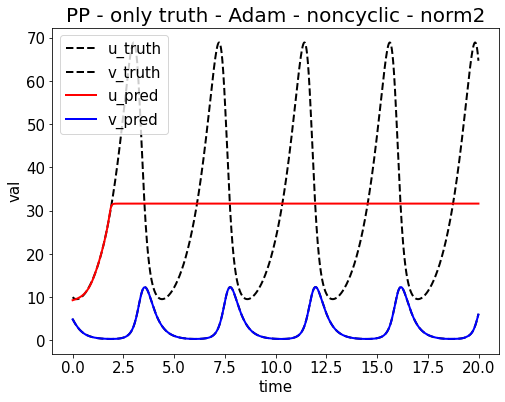

Saved as /content/drive/My Drive/Workspace/PINN//figure/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-03-04-22-15_1654230155.png


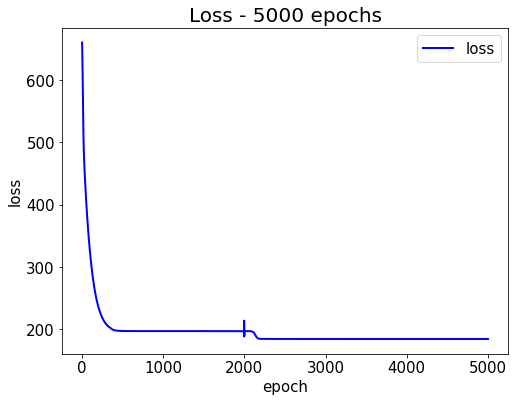

Epoch [06000/100000] Loss:184.340408 Loss_1:184.340408 Lr:0.000625 Time:4.870765s (0.41min in total, 6.44min remains)
Epoch [07000/100000] Loss:184.339584 Loss_1:184.339584 Lr:0.000588 Time:3.901856s (0.48min in total, 6.33min remains)
Epoch [08000/100000] Loss:184.339035 Loss_1:184.339035 Lr:0.000556 Time:3.884093s (0.54min in total, 6.22min remains)
Epoch [09000/100000] Loss:177.923325 Loss_1:177.923325 Lr:0.000526 Time:3.924897s (0.61min in total, 6.13min remains)
Epoch [10000/100000] Loss:51.724339 Loss_1:51.724339 Lr:0.000500 Time:3.905660s (0.67min in total, 6.04min remains)
Testing & drawing...
u= [8.703646, 8.740668, 8.777735, 8.814839, 8.851991, 8.889189, 8.926441, 8.96376, 9.001136, 9.038583] ... [64.58944, 64.61794, 64.644966, 64.6706, 64.69495, 64.71808, 64.74004, 64.760925, 64.78079, 64.79968]
v= [4.930226, 4.844087, 4.7584233, 4.673284, 4.5887337, 4.504811, 4.4215717, 4.3390517, 4.257311, 4.176386] ... [4.4541473, 4.6247993, 4.799251, 4.9770923, 5.1578655, 5.341024, 5.525

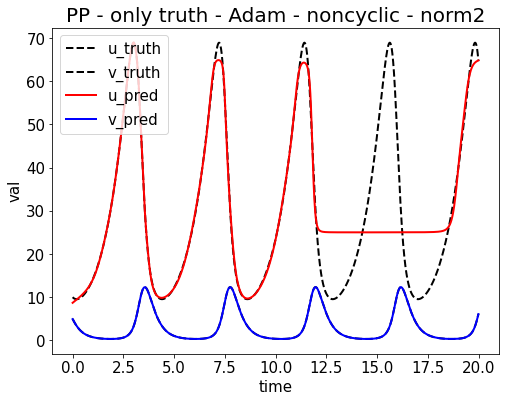

Saved as /content/drive/My Drive/Workspace/PINN//figure/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-03-04-22-15_1654230176.png


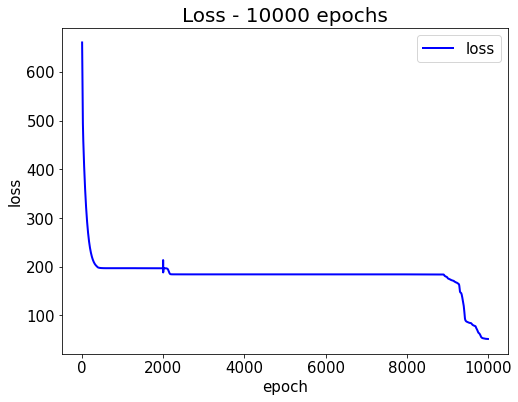

Epoch [11000/100000] Loss:51.204994 Loss_1:51.204994 Lr:0.000476 Time:4.832374s (0.75min in total, 6.09min remains)
Epoch [12000/100000] Loss:51.173611 Loss_1:51.173611 Lr:0.000455 Time:3.883614s (0.82min in total, 5.99min remains)
Epoch [13000/100000] Loss:1.470284 Loss_1:1.470284 Lr:0.000435 Time:3.871165s (0.88min in total, 5.90min remains)
Epoch [14000/100000] Loss:0.166076 Loss_1:0.166076 Lr:0.000417 Time:3.899263s (0.95min in total, 5.81min remains)
Epoch [15000/100000] Loss:0.026877 Loss_1:0.026877 Lr:0.000400 Time:3.868583s (1.01min in total, 5.73min remains)
Testing & drawing...
u= [9.717802, 9.708244, 9.69911, 9.690416, 9.682194, 9.674454, 9.6672325, 9.660545, 9.654423, 9.648888] ... [68.373825, 68.444275, 68.51193, 68.57694, 68.63943, 68.699524, 68.75733, 68.81297, 68.86656, 68.918175]
v= [4.9558873, 4.867129, 4.7789154, 4.691307, 4.6043715, 4.5181637, 4.432739, 4.348148, 4.26445, 4.181688] ... [4.4235363, 4.5960255, 4.773733, 4.9563093, 5.1432896, 5.3340297, 5.527806, 5.723

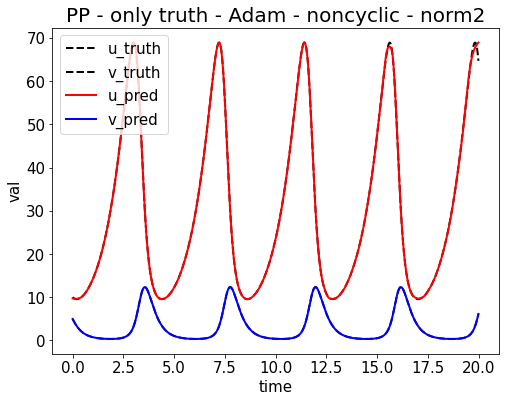

Saved as /content/drive/My Drive/Workspace/PINN//figure/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-03-04-22-15_1654230196.png


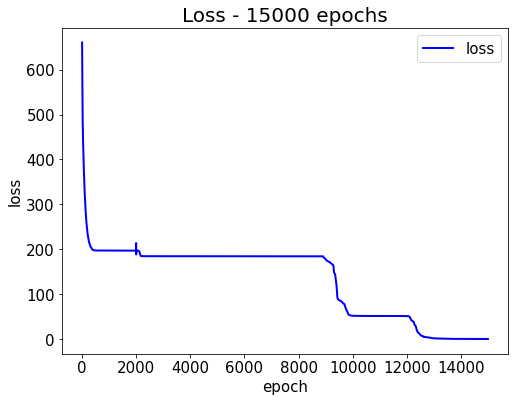

Epoch [16000/100000] Loss:0.019141 Loss_1:0.019141 Lr:0.000385 Time:5.049221s (1.10min in total, 5.75min remains)
Epoch [17000/100000] Loss:0.015523 Loss_1:0.015523 Lr:0.000370 Time:3.881365s (1.16min in total, 5.66min remains)
Epoch [18000/100000] Loss:0.014299 Loss_1:0.014299 Lr:0.000357 Time:3.916090s (1.23min in total, 5.58min remains)
Epoch [19000/100000] Loss:0.012694 Loss_1:0.012694 Lr:0.000345 Time:3.892339s (1.29min in total, 5.50min remains)
Epoch [20000/100000] Loss:0.011508 Loss_1:0.011508 Lr:0.000333 Time:3.897818s (1.35min in total, 5.42min remains)
Testing & drawing...
u= [9.827802, 9.811359, 9.795486, 9.780203, 9.765539, 9.75153, 9.738198, 9.7255745, 9.713688, 9.702574] ... [67.93521, 67.94068, 67.94534, 67.94933, 67.95277, 67.955734, 67.95835, 67.960655, 67.96271, 67.96456]
v= [4.9593935, 4.868754, 4.7787566, 4.689461, 4.6009445, 4.513261, 4.4264717, 4.3406286, 4.2557945, 4.1720123] ... [4.432886, 4.6064353, 4.7856145, 4.9700184, 5.1590815, 5.3520384, 5.5479865, 5.7458

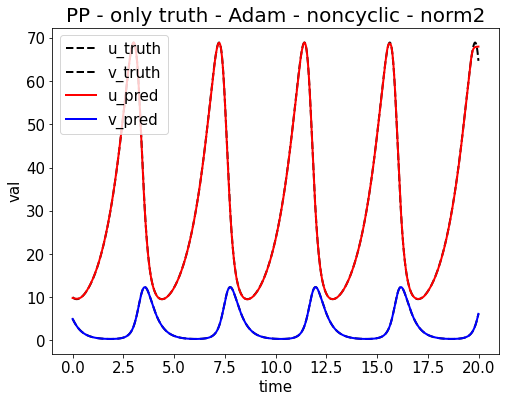

Saved as /content/drive/My Drive/Workspace/PINN//figure/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-03-04-22-15_1654230217.png


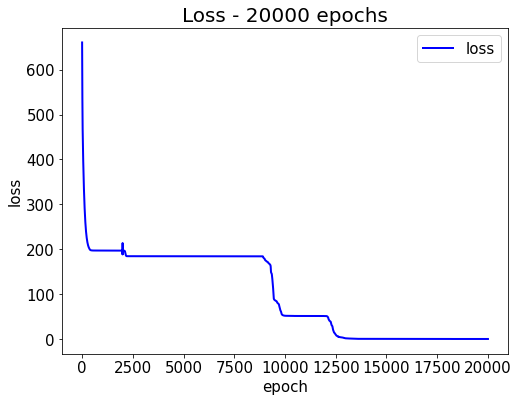

Epoch [21000/100000] Loss:0.010051 Loss_1:0.010051 Lr:0.000323 Time:4.853185s (1.44min in total, 5.40min remains)
Epoch [22000/100000] Loss:0.012686 Loss_1:0.012686 Lr:0.000313 Time:3.911035s (1.50min in total, 5.32min remains)
Epoch [23000/100000] Loss:0.008042 Loss_1:0.008042 Lr:0.000303 Time:3.920462s (1.57min in total, 5.24min remains)
Epoch [24000/100000] Loss:0.006482 Loss_1:0.006482 Lr:0.000294 Time:3.907952s (1.63min in total, 5.17min remains)
Epoch [25000/100000] Loss:0.004722 Loss_1:0.004722 Lr:0.000286 Time:3.889403s (1.70min in total, 5.09min remains)
Testing & drawing...
u= [9.841125, 9.821622, 9.802752, 9.784548, 9.767041, 9.750269, 9.734261, 9.719051, 9.704675, 9.691165] ... [67.722664, 67.63874, 67.55553, 67.473915, 67.39467, 67.31839, 67.24557, 67.17654, 67.1115, 67.05062]
v= [4.975927, 4.8837156, 4.792223, 4.7015195, 4.6116824, 4.5227737, 4.4348526, 4.3479743, 4.2622037, 4.1775846] ... [4.4240046, 4.5976863, 4.777076, 4.9617434, 5.1510863, 5.3442917, 5.5403986, 5.7383

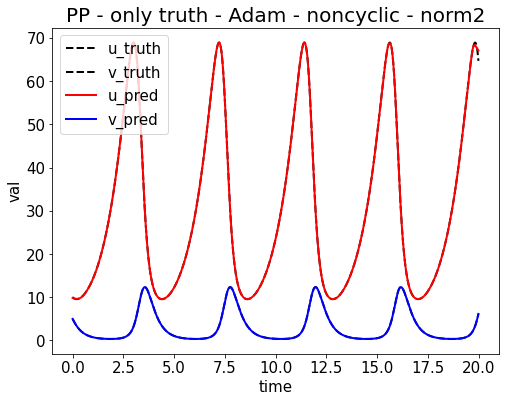

Saved as /content/drive/My Drive/Workspace/PINN//figure/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-03-04-22-15_1654230237.png


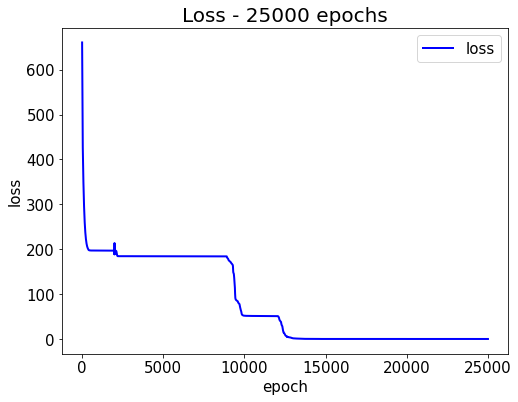

Epoch [26000/100000] Loss:0.004715 Loss_1:0.004715 Lr:0.000278 Time:4.838344s (1.78min in total, 5.06min remains)
Epoch [27000/100000] Loss:0.002316 Loss_1:0.002316 Lr:0.000270 Time:3.906796s (1.84min in total, 4.98min remains)
Epoch [28000/100000] Loss:0.001983 Loss_1:0.001983 Lr:0.000263 Time:3.918947s (1.91min in total, 4.90min remains)
Epoch [29000/100000] Loss:0.001683 Loss_1:0.001683 Lr:0.000256 Time:3.898450s (1.97min in total, 4.83min remains)
Epoch [30000/100000] Loss:0.005241 Loss_1:0.005241 Lr:0.000250 Time:3.883011s (2.04min in total, 4.75min remains)
Testing & drawing...
u= [9.829618, 9.8076725, 9.786417, 9.765886, 9.746117, 9.72714, 9.708999, 9.691721, 9.675348, 9.659918] ... [67.784935, 67.55343, 67.31404, 67.07178, 66.8316, 66.598175, 66.37545, 66.16647, 65.97333, 65.79715]
v= [4.9822206, 4.888813, 4.7961864, 4.7044187, 4.613593, 4.5237784, 4.435039, 4.34743, 4.2610197, 4.1758513] ... [4.4234786, 4.597221, 4.776718, 4.961537, 5.151067, 5.3444743, 5.540785, 5.7388606, 5.

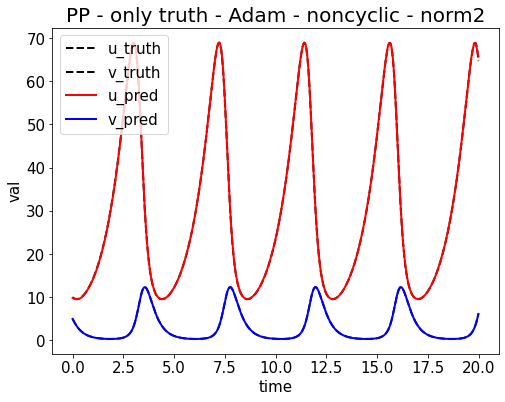

Saved as /content/drive/My Drive/Workspace/PINN//figure/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-03-04-22-15_1654230257.png


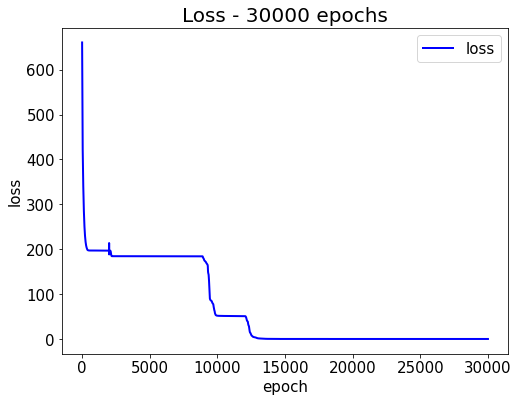

Epoch [31000/100000] Loss:0.005178 Loss_1:0.005178 Lr:0.000244 Time:4.894998s (2.12min in total, 4.72min remains)
Epoch [32000/100000] Loss:0.000987 Loss_1:0.000987 Lr:0.000238 Time:3.886823s (2.18min in total, 4.64min remains)
Epoch [33000/100000] Loss:0.000378 Loss_1:0.000378 Lr:0.000233 Time:3.928578s (2.25min in total, 4.57min remains)
Epoch [34000/100000] Loss:0.003357 Loss_1:0.003357 Lr:0.000227 Time:3.923955s (2.31min in total, 4.49min remains)
Epoch [35000/100000] Loss:0.000268 Loss_1:0.000268 Lr:0.000222 Time:3.901602s (2.38min in total, 4.42min remains)
Testing & drawing...
u= [9.876205, 9.85209, 9.828771, 9.806272, 9.78464, 9.763909, 9.744117, 9.725297, 9.707494, 9.690738] ... [67.98272, 67.71986, 67.43162, 67.12377, 66.80378, 66.480255, 66.16199, 65.85709, 65.572075, 65.311455]
v= [4.9795737, 4.8854685, 4.79218, 4.699788, 4.6083927, 4.5180635, 4.428873, 4.3408775, 4.254148, 4.168729] ... [4.4224358, 4.59606, 4.7754683, 4.960242, 5.1497746, 5.3432417, 5.5396705, 5.7379127, 5

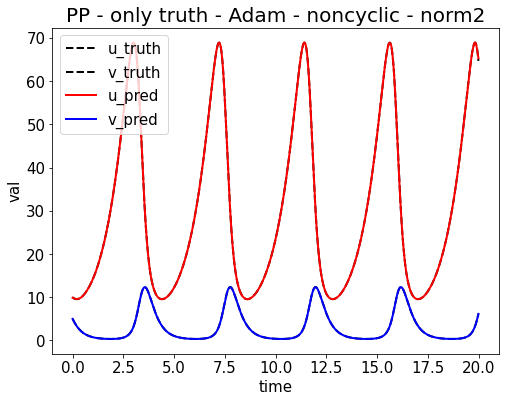

Saved as /content/drive/My Drive/Workspace/PINN//figure/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-03-04-22-15_1654230278.png


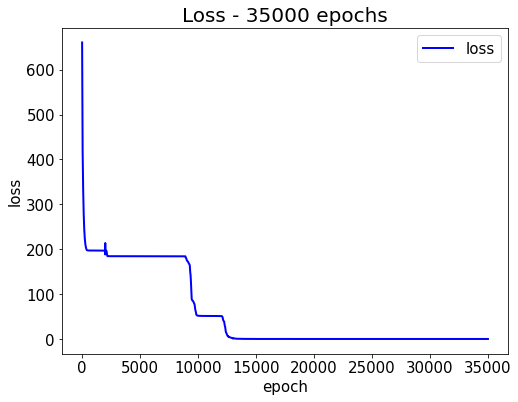

Epoch [36000/100000] Loss:0.000301 Loss_1:0.000301 Lr:0.000217 Time:4.905525s (2.46min in total, 4.38min remains)
Epoch [37000/100000] Loss:0.000795 Loss_1:0.000795 Lr:0.000213 Time:3.889364s (2.53min in total, 4.30min remains)
Epoch [38000/100000] Loss:0.000181 Loss_1:0.000181 Lr:0.000208 Time:3.898829s (2.59min in total, 4.23min remains)
Epoch [39000/100000] Loss:0.000168 Loss_1:0.000168 Lr:0.000204 Time:3.938855s (2.66min in total, 4.16min remains)
Epoch [40000/100000] Loss:0.000147 Loss_1:0.000147 Lr:0.000200 Time:3.896710s (2.72min in total, 4.08min remains)
Testing & drawing...
u= [9.890204, 9.864132, 9.838934, 9.814642, 9.791303, 9.76895, 9.747621, 9.727359, 9.7081995, 9.690177] ... [68.069885, 67.80816, 67.511246, 67.18349, 66.83203, 66.46673, 66.098976, 65.740524, 65.40167, 65.09025]
v= [4.9824424, 4.8873916, 4.793217, 4.700012, 4.6078887, 4.516923, 4.427193, 4.3387594, 4.251688, 4.166022] ... [4.4263716, 4.5999637, 4.779354, 4.964139, 5.1537266, 5.3473043, 5.5439153, 5.742422

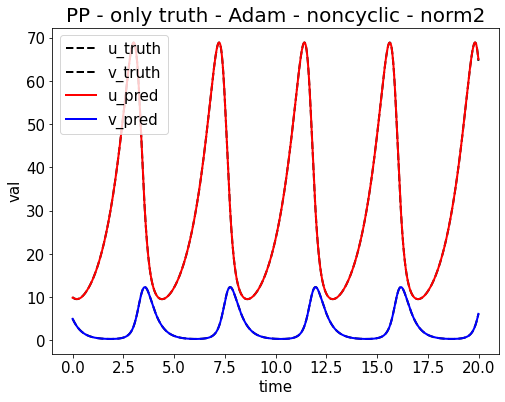

Saved as /content/drive/My Drive/Workspace/PINN//figure/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-03-04-22-15_1654230299.png


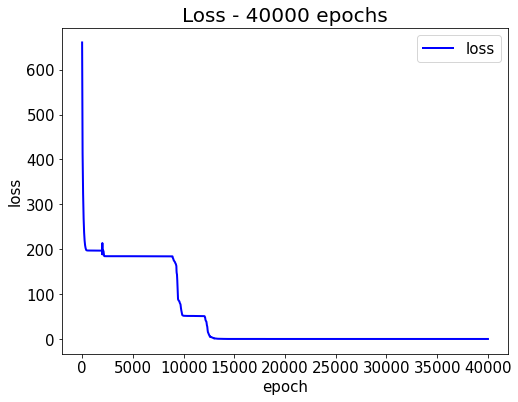

Epoch [41000/100000] Loss:0.000309 Loss_1:0.000309 Lr:0.000196 Time:4.900257s (2.80min in total, 4.03min remains)
Epoch [42000/100000] Loss:0.001684 Loss_1:0.001684 Lr:0.000192 Time:3.911669s (2.87min in total, 3.96min remains)
Epoch [43000/100000] Loss:0.000105 Loss_1:0.000105 Lr:0.000189 Time:3.908164s (2.93min in total, 3.89min remains)
Epoch [44000/100000] Loss:0.001442 Loss_1:0.001442 Lr:0.000185 Time:3.950569s (3.00min in total, 3.82min remains)
Epoch [45000/100000] Loss:0.003673 Loss_1:0.003673 Lr:0.000182 Time:3.994478s (3.07min in total, 3.75min remains)
Testing & drawing...
u= [9.912034, 9.884507, 9.85793, 9.832349, 9.807797, 9.784319, 9.761949, 9.74073, 9.720698, 9.701898] ... [68.12946, 67.87535, 67.58069, 67.24822, 66.884094, 66.49806, 66.102715, 65.71195, 65.338905, 64.99411]
v= [4.992501, 4.8966703, 4.801768, 4.7079077, 4.6152034, 4.523745, 4.433612, 4.3448606, 4.2575574, 4.171734] ... [4.422818, 4.596269, 4.775534, 4.9602256, 5.149785, 5.3434224, 5.5401917, 5.738986, 5.

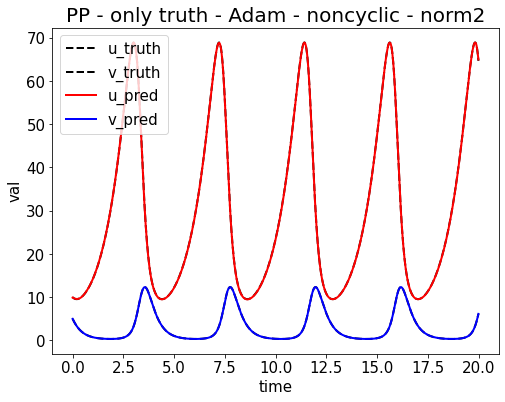

Saved as /content/drive/My Drive/Workspace/PINN//figure/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-03-04-22-15_1654230319.png


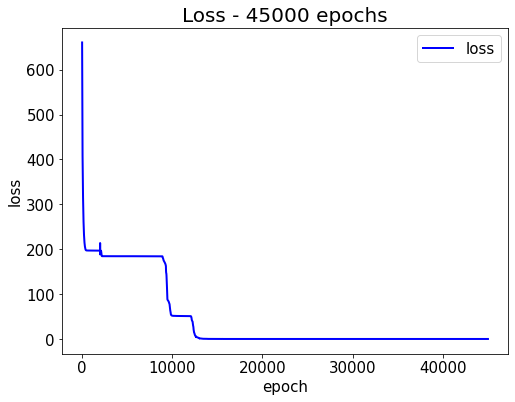

Epoch [46000/100000] Loss:0.000837 Loss_1:0.000837 Lr:0.000179 Time:4.928422s (3.15min in total, 3.70min remains)
Epoch [47000/100000] Loss:0.000376 Loss_1:0.000376 Lr:0.000175 Time:3.896716s (3.21min in total, 3.62min remains)
Epoch [48000/100000] Loss:0.000056 Loss_1:0.000056 Lr:0.000172 Time:3.894929s (3.28min in total, 3.55min remains)
Epoch [49000/100000] Loss:0.000080 Loss_1:0.000080 Lr:0.000169 Time:3.883177s (3.34min in total, 3.48min remains)
Epoch [50000/100000] Loss:0.000046 Loss_1:0.000046 Lr:0.000167 Time:3.862414s (3.41min in total, 3.41min remains)
Testing & drawing...
u= [9.912861, 9.883846, 9.855838, 9.828886, 9.803029, 9.778306, 9.754757, 9.732422, 9.711339, 9.691548] ... [68.14498, 67.89177, 67.5954, 67.257774, 66.88448, 66.485275, 66.073425, 65.66418, 65.27223, 64.90969]
v= [4.9944105, 4.8983, 4.803131, 4.7090235, 4.616104, 4.5244684, 4.4341936, 4.345346, 4.257984, 4.1721416] ... [4.4225793, 4.595921, 4.7750835, 4.9596987, 5.1492224, 5.3428845, 5.5397654, 5.738766, 

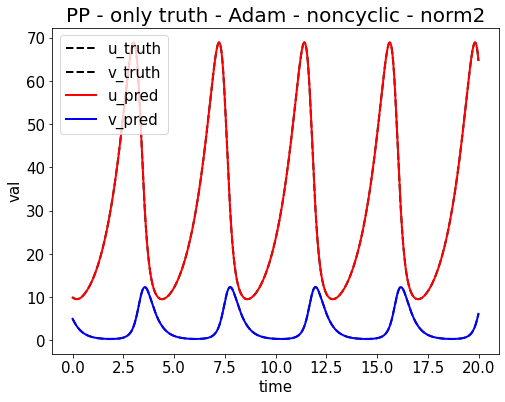

Saved as /content/drive/My Drive/Workspace/PINN//figure/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-03-04-22-15_1654230340.png


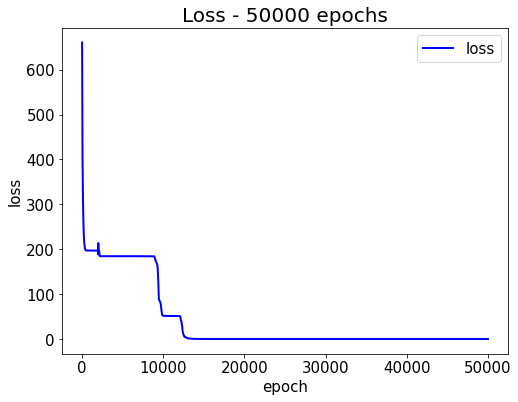

Epoch [51000/100000] Loss:0.001570 Loss_1:0.001570 Lr:0.000164 Time:4.885933s (3.49min in total, 3.35min remains)
Epoch [52000/100000] Loss:0.000092 Loss_1:0.000092 Lr:0.000161 Time:3.895203s (3.55min in total, 3.28min remains)
Epoch [53000/100000] Loss:0.000778 Loss_1:0.000778 Lr:0.000159 Time:3.891011s (3.62min in total, 3.21min remains)
Epoch [54000/100000] Loss:0.000052 Loss_1:0.000052 Lr:0.000156 Time:3.881544s (3.68min in total, 3.14min remains)
Epoch [55000/100000] Loss:0.000114 Loss_1:0.000114 Lr:0.000154 Time:3.871477s (3.75min in total, 3.07min remains)
Testing & drawing...
u= [9.920281, 9.890053, 9.860903, 9.832863, 9.805984, 9.780302, 9.755857, 9.732689, 9.710841, 9.690348] ... [68.156136, 67.9056, 67.61056, 67.27218, 66.895386, 66.48962, 66.068306, 65.64738, 65.24266, 64.86743]
v= [4.9855723, 4.889247, 4.793885, 4.699619, 4.606579, 4.514864, 4.4245553, 4.3357086, 4.2483892, 4.1626205] ... [4.4657965, 4.640335, 4.8206444, 5.006332, 5.1968403, 5.391374, 5.589001, 5.78861, 5.

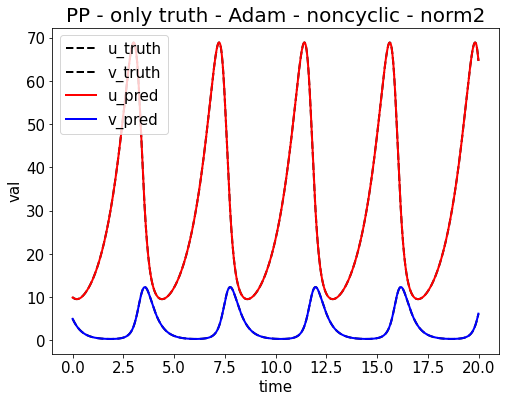

Saved as /content/drive/My Drive/Workspace/PINN//figure/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-03-04-22-15_1654230360.png


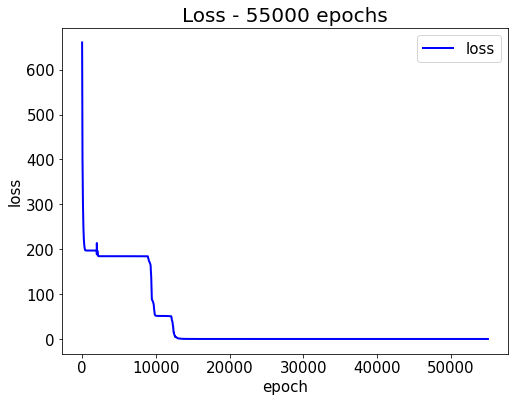

Epoch [56000/100000] Loss:0.000724 Loss_1:0.000724 Lr:0.000152 Time:4.849601s (3.83min in total, 3.01min remains)
Epoch [57000/100000] Loss:0.000036 Loss_1:0.000036 Lr:0.000149 Time:3.905464s (3.89min in total, 2.94min remains)
Epoch [58000/100000] Loss:0.000203 Loss_1:0.000203 Lr:0.000147 Time:3.907982s (3.96min in total, 2.87min remains)
Epoch [59000/100000] Loss:0.001192 Loss_1:0.001192 Lr:0.000145 Time:3.976099s (4.02min in total, 2.80min remains)
Epoch [60000/100000] Loss:0.003324 Loss_1:0.003324 Lr:0.000143 Time:3.885911s (4.09min in total, 2.73min remains)
Testing & drawing...
u= [9.905054, 9.873624, 9.84333, 9.814205, 9.7863, 9.75965, 9.734297, 9.710282, 9.687647, 9.666424] ... [68.17628, 67.9326, 67.64385, 67.31032, 66.936005, 66.529495, 66.10382, 65.675095, 65.25992, 64.87278]
v= [4.9824724, 4.8859777, 4.7904563, 4.696045, 4.6028886, 4.511082, 4.4207125, 4.331835, 4.244512, 4.158762] ... [4.426316, 4.599466, 4.7784376, 4.9629, 5.1523447, 5.3460436, 5.543121, 5.7425237, 5.9430

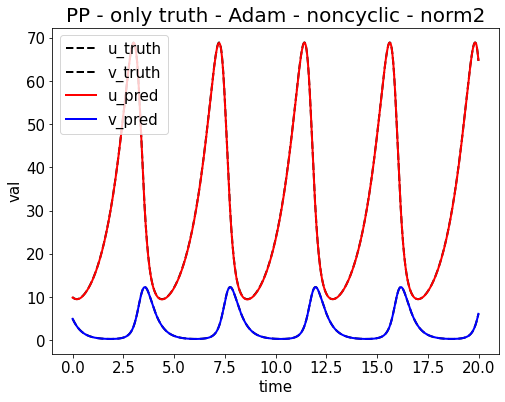

Saved as /content/drive/My Drive/Workspace/PINN//figure/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-03-04-22-15_1654230381.png


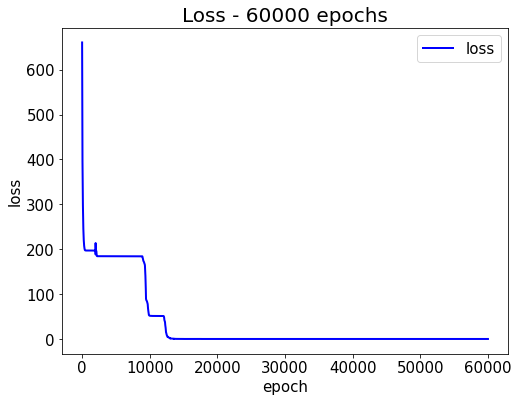

Epoch [61000/100000] Loss:0.000040 Loss_1:0.000040 Lr:0.000141 Time:4.910867s (4.17min in total, 2.67min remains)
Epoch [62000/100000] Loss:0.000039 Loss_1:0.000039 Lr:0.000139 Time:3.953852s (4.24min in total, 2.60min remains)
Epoch [63000/100000] Loss:0.000105 Loss_1:0.000105 Lr:0.000137 Time:3.914967s (4.30min in total, 2.53min remains)
Epoch [64000/100000] Loss:0.000089 Loss_1:0.000089 Lr:0.000135 Time:3.905597s (4.37min in total, 2.46min remains)
Epoch [65000/100000] Loss:0.000165 Loss_1:0.000165 Lr:0.000133 Time:3.910549s (4.43min in total, 2.39min remains)
Testing & drawing...
u= [9.921682, 9.889371, 9.858248, 9.828348, 9.79973, 9.772421, 9.7464695, 9.721906, 9.698778, 9.677122] ... [68.16632, 67.91998, 67.62819, 67.291115, 66.91273, 66.50173, 66.071396, 65.63816, 65.21902, 64.828735]
v= [4.9954367, 4.898689, 4.802914, 4.7082586, 4.614867, 4.5228477, 4.4322815, 4.3432355, 4.255764, 4.169891] ... [4.4226737, 4.5956817, 4.7745175, 4.958852, 5.148211, 5.341882, 5.5390162, 5.738573,

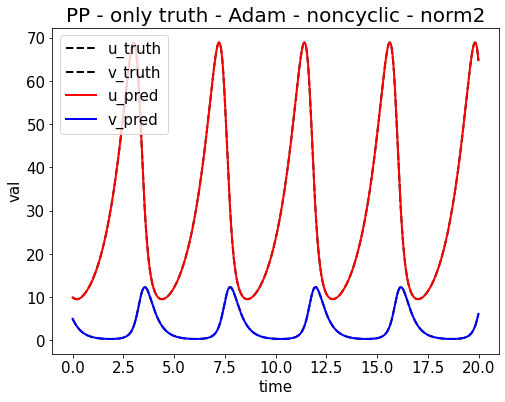

Saved as /content/drive/My Drive/Workspace/PINN//figure/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-03-04-22-15_1654230401.png


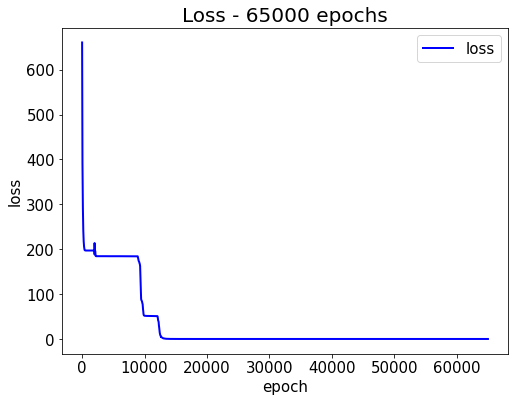

Epoch [66000/100000] Loss:0.000047 Loss_1:0.000047 Lr:0.000132 Time:5.118629s (4.52min in total, 2.33min remains)
Epoch [67000/100000] Loss:0.000026 Loss_1:0.000026 Lr:0.000130 Time:3.932642s (4.58min in total, 2.26min remains)
Epoch [68000/100000] Loss:0.000046 Loss_1:0.000046 Lr:0.000128 Time:3.908841s (4.65min in total, 2.19min remains)
Epoch [69000/100000] Loss:0.000035 Loss_1:0.000035 Lr:0.000127 Time:3.913305s (4.71min in total, 2.12min remains)
Epoch [70000/100000] Loss:0.000568 Loss_1:0.000568 Lr:0.000125 Time:3.886983s (4.78min in total, 2.05min remains)
Testing & drawing...
u= [9.956171, 9.923262, 9.891599, 9.861225, 9.832188, 9.804522, 9.778268, 9.753464, 9.730151, 9.708366] ... [68.17142, 67.927925, 67.63887, 67.30406, 66.92703, 66.51604, 66.08406, 65.64756, 65.22381, 64.828125]
v= [4.994358, 4.897474, 4.801569, 4.7068005, 4.613316, 4.521223, 4.43061, 4.341539, 4.2540627, 4.168202] ... [4.4237766, 4.5967035, 4.775455, 4.9597163, 5.1490283, 5.3427014, 5.5399017, 5.739616, 5.

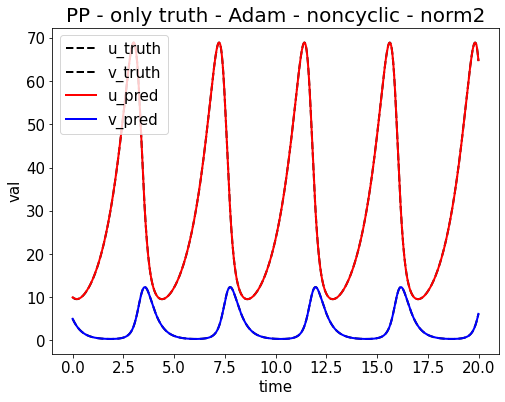

Saved as /content/drive/My Drive/Workspace/PINN//figure/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-03-04-22-15_1654230422.png


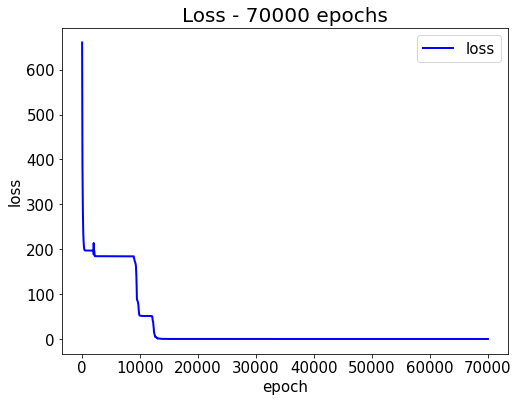

Epoch [71000/100000] Loss:0.000037 Loss_1:0.000037 Lr:0.000123 Time:4.913943s (4.86min in total, 1.99min remains)
Epoch [72000/100000] Loss:0.000195 Loss_1:0.000195 Lr:0.000122 Time:3.904392s (4.93min in total, 1.92min remains)
Epoch [73000/100000] Loss:0.000025 Loss_1:0.000025 Lr:0.000120 Time:3.884290s (4.99min in total, 1.85min remains)
Epoch [74000/100000] Loss:0.000026 Loss_1:0.000026 Lr:0.000119 Time:3.904387s (5.06min in total, 1.78min remains)
Epoch [75000/100000] Loss:0.000023 Loss_1:0.000023 Lr:0.000118 Time:3.901306s (5.12min in total, 1.71min remains)
Testing & drawing...
u= [9.943175, 9.909386, 9.876891, 9.845725, 9.815938, 9.787566, 9.760652, 9.735231, 9.711345, 9.689028] ... [68.168495, 67.92476, 67.63542, 67.30016, 66.92235, 66.51017, 66.076546, 65.63797, 65.21191, 64.81384]
v= [4.9963174, 4.8992896, 4.8032484, 4.7083564, 4.6147666, 4.5225873, 4.431908, 4.34279, 4.2552857, 4.1694126] ... [4.422966, 4.5957923, 4.774437, 4.95861, 5.1478586, 5.34152, 5.538782, 5.7386456, 5

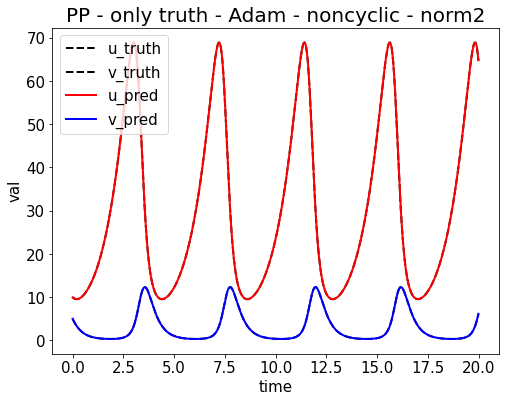

Saved as /content/drive/My Drive/Workspace/PINN//figure/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-03-04-22-15_1654230442.png


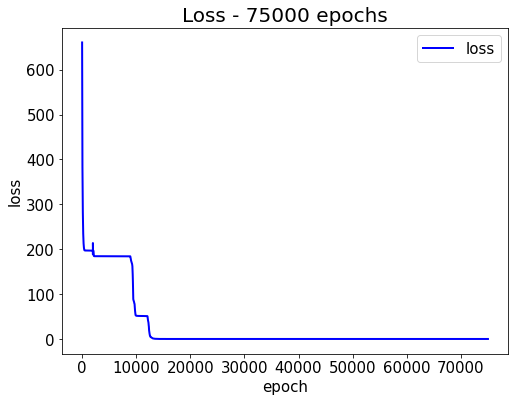

Epoch [76000/100000] Loss:0.000030 Loss_1:0.000030 Lr:0.000116 Time:4.917953s (5.20min in total, 1.64min remains)
Epoch [77000/100000] Loss:0.000081 Loss_1:0.000081 Lr:0.000115 Time:3.939578s (5.27min in total, 1.57min remains)
Epoch [78000/100000] Loss:0.000023 Loss_1:0.000023 Lr:0.000114 Time:3.902244s (5.33min in total, 1.50min remains)
Epoch [79000/100000] Loss:0.000025 Loss_1:0.000025 Lr:0.000112 Time:3.889384s (5.40min in total, 1.43min remains)
Epoch [80000/100000] Loss:0.000023 Loss_1:0.000023 Lr:0.000111 Time:3.889601s (5.46min in total, 1.37min remains)
Testing & drawing...
u= [9.9463415, 9.911994, 9.878975, 9.847324, 9.817091, 9.788313, 9.761026, 9.735272, 9.711086, 9.688505] ... [68.16828, 67.92521, 67.63656, 67.301895, 66.924416, 66.51212, 66.077774, 65.63786, 65.2099, 64.809555]
v= [4.9940805, 4.8969584, 4.8008327, 4.705863, 4.61221, 4.519983, 4.429274, 4.3401413, 4.2526393, 4.166783] ... [4.4244776, 4.597187, 4.7757096, 4.9597654, 5.148925, 5.342534, 5.5398116, 5.739774,

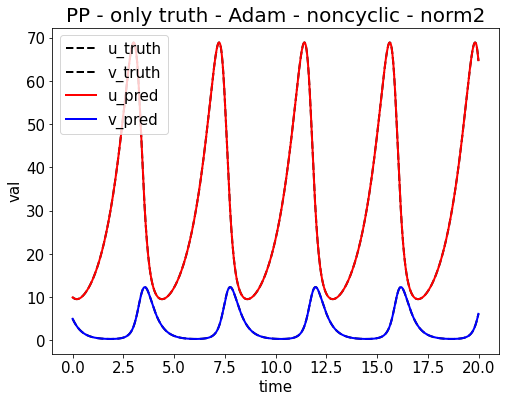

Saved as /content/drive/My Drive/Workspace/PINN//figure/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-03-04-22-15_1654230463.png


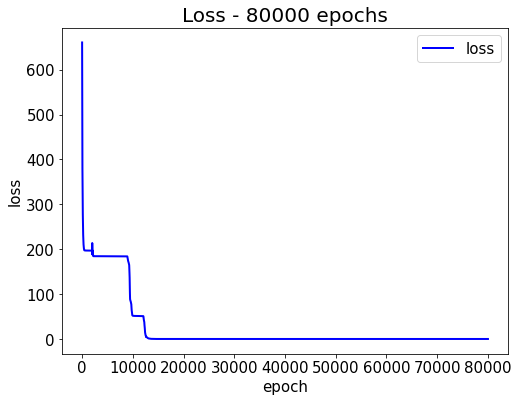

Epoch [81000/100000] Loss:0.000021 Loss_1:0.000021 Lr:0.000110 Time:4.923034s (5.55min in total, 1.30min remains)
Epoch [82000/100000] Loss:0.000290 Loss_1:0.000290 Lr:0.000109 Time:3.894892s (5.61min in total, 1.23min remains)
Epoch [83000/100000] Loss:0.000021 Loss_1:0.000021 Lr:0.000108 Time:3.873203s (5.67min in total, 1.16min remains)
Epoch [84000/100000] Loss:0.000020 Loss_1:0.000020 Lr:0.000106 Time:3.901772s (5.74min in total, 1.09min remains)
Epoch [85000/100000] Loss:0.000264 Loss_1:0.000264 Lr:0.000105 Time:3.894297s (5.80min in total, 1.02min remains)
Testing & drawing...
u= [9.939309, 9.904374, 9.870802, 9.838628, 9.807903, 9.778661, 9.750944, 9.724786, 9.700227, 9.677302] ... [68.17367, 67.9328, 67.64647, 67.31403, 66.9384, 66.527214, 66.09298, 65.651985, 65.22181, 64.818375]
v= [4.9967127, 4.899511, 4.8032975, 4.708246, 4.6145163, 4.522223, 4.4314604, 4.3422866, 4.2547545, 4.16888] ... [4.423189, 4.5958657, 4.7743487, 4.958373, 5.14751, 5.3411365, 5.538472, 5.7385607, 5.

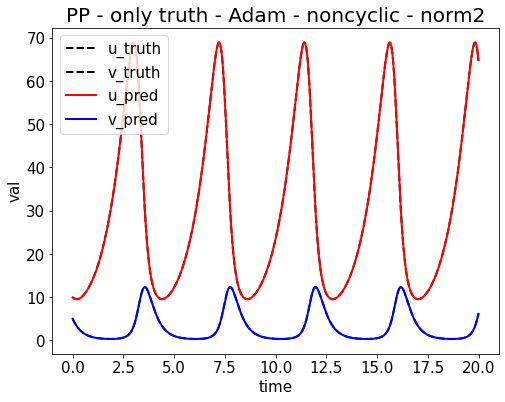

Saved as /content/drive/My Drive/Workspace/PINN//figure/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-03-04-22-15_1654230484.png


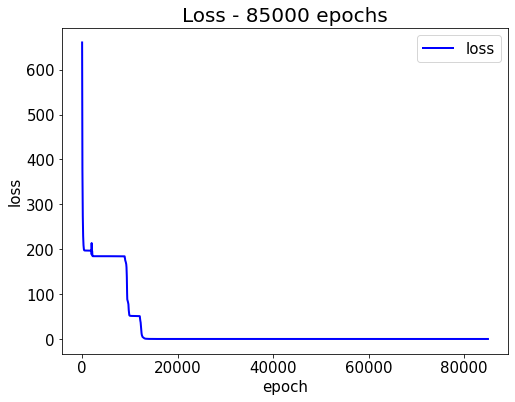

Epoch [86000/100000] Loss:0.000020 Loss_1:0.000020 Lr:0.000104 Time:4.908844s (5.89min in total, 0.96min remains)
Epoch [87000/100000] Loss:0.000022 Loss_1:0.000022 Lr:0.000103 Time:3.889131s (5.95min in total, 0.89min remains)
Epoch [88000/100000] Loss:0.000028 Loss_1:0.000028 Lr:0.000102 Time:3.868559s (6.02min in total, 0.82min remains)
Epoch [89000/100000] Loss:0.000033 Loss_1:0.000033 Lr:0.000101 Time:3.910988s (6.08min in total, 0.75min remains)
Epoch [90000/100000] Loss:0.000019 Loss_1:0.000019 Lr:0.000100 Time:3.887335s (6.15min in total, 0.68min remains)
Testing & drawing...
u= [9.951692, 9.916368, 9.88244, 9.849953, 9.818951, 9.789467, 9.761548, 9.735225, 9.710535, 9.687517] ... [68.167595, 67.92554, 67.63799, 67.30433, 66.92747, 66.51509, 66.07975, 65.63776, 65.20676, 64.80268]
v= [4.99639, 4.899123, 4.802847, 4.7077394, 4.6139584, 4.521628, 4.430837, 4.341647, 4.25411, 4.1682405] ... [4.424313, 4.596943, 4.7753797, 4.9593544, 5.1484666, 5.3421006, 5.5394964, 5.7397156, 5.94

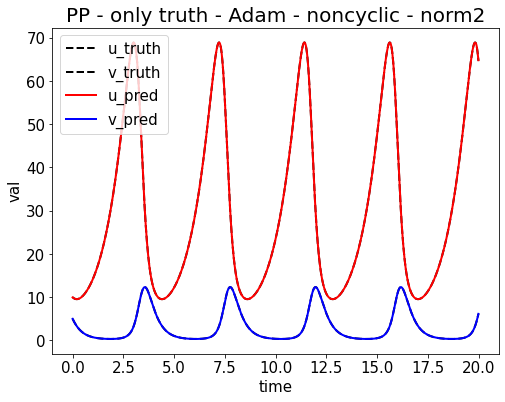

Saved as /content/drive/My Drive/Workspace/PINN//figure/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-03-04-22-15_1654230504.png


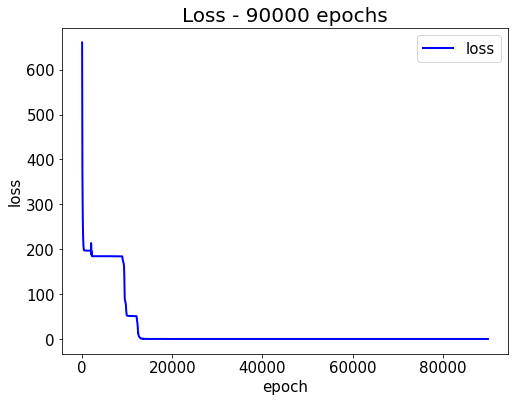

Epoch [91000/100000] Loss:0.000019 Loss_1:0.000019 Lr:0.000099 Time:4.941947s (6.23min in total, 0.62min remains)
Epoch [92000/100000] Loss:0.000019 Loss_1:0.000019 Lr:0.000098 Time:3.894092s (6.29min in total, 0.55min remains)
Epoch [93000/100000] Loss:0.000018 Loss_1:0.000018 Lr:0.000097 Time:3.901440s (6.36min in total, 0.48min remains)
Epoch [94000/100000] Loss:0.001448 Loss_1:0.001448 Lr:0.000096 Time:3.890136s (6.42min in total, 0.41min remains)
Epoch [95000/100000] Loss:0.000018 Loss_1:0.000018 Lr:0.000095 Time:3.865006s (6.49min in total, 0.34min remains)
Testing & drawing...
u= [9.954201, 9.918419, 9.884074, 9.851197, 9.819841, 9.790036, 9.761825, 9.735243, 9.710319, 9.687102] ... [68.167496, 67.925896, 67.63887, 67.30568, 66.929146, 66.5168, 66.081055, 65.63819, 65.20584, 64.80009]
v= [4.996838, 4.899515, 4.803185, 4.7080216, 4.614193, 4.521821, 4.4309983, 4.3417873, 4.2542367, 4.1683636] ... [4.423642, 4.5961885, 4.7745323, 4.9584217, 5.147464, 5.3410606, 5.53847, 5.7387686,

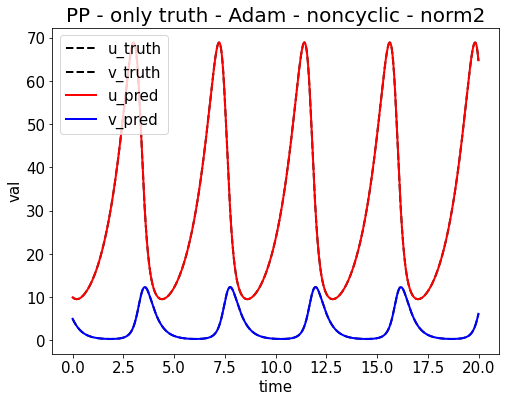

Saved as /content/drive/My Drive/Workspace/PINN//figure/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-03-04-22-15_1654230524.png


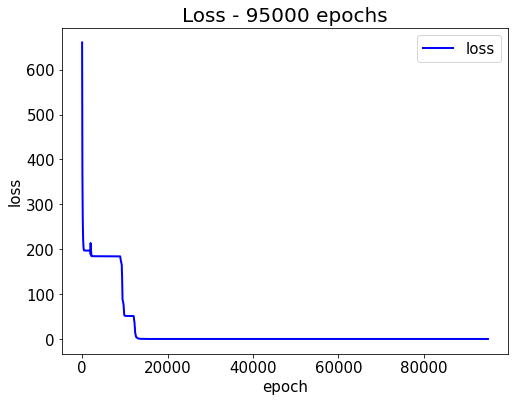

Epoch [96000/100000] Loss:0.000074 Loss_1:0.000074 Lr:0.000094 Time:4.918779s (6.57min in total, 0.27min remains)
Epoch [97000/100000] Loss:0.000136 Loss_1:0.000136 Lr:0.000093 Time:3.885440s (6.63min in total, 0.21min remains)
Epoch [98000/100000] Loss:0.000018 Loss_1:0.000018 Lr:0.000093 Time:3.941940s (6.70min in total, 0.14min remains)
Epoch [99000/100000] Loss:0.003036 Loss_1:0.003036 Lr:0.000092 Time:3.915741s (6.76min in total, 0.07min remains)
Epoch [100000/100000] Loss:0.000017 Loss_1:0.000017 Lr:0.000091 Time:3.895382s (6.83min in total, 0.00min remains)
Testing & drawing...
u= [9.956367, 9.920154, 9.885406, 9.852166, 9.820474, 9.790365, 9.7618885, 9.735063, 9.709934, 9.686536] ... [68.16704, 67.925766, 67.63914, 67.306335, 66.93007, 66.51776, 66.081696, 65.638084, 65.204575, 64.79731]
v= [4.995826, 4.898458, 4.8020854, 4.706884, 4.6130238, 4.5206265, 4.4297905, 4.340572, 4.253023, 4.1671596] ... [4.425909, 4.598442, 4.7767663, 4.9606376, 5.149674, 5.3432865, 5.5407505, 5.741

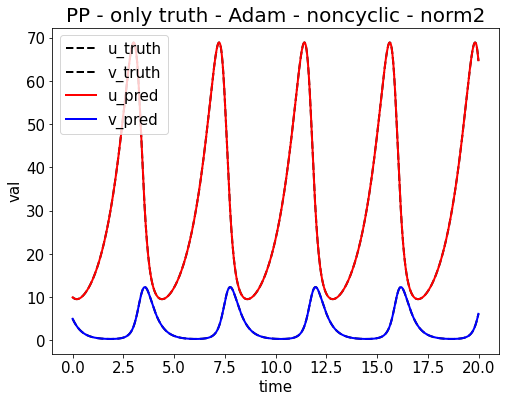

Saved as /content/drive/My Drive/Workspace/PINN//figure/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-03-04-22-15_1654230545.png


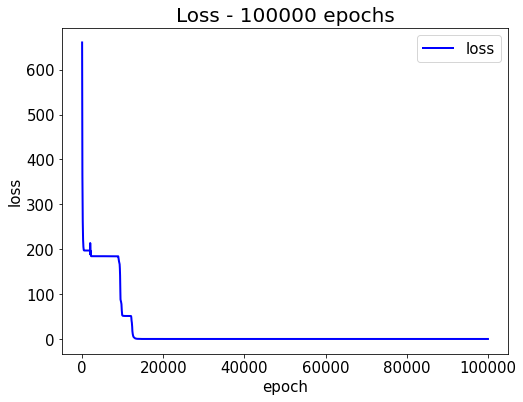

tensor board path: /content/drive/My Drive/Workspace/PINN//board/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-03-04-22-15_board
%load_ext tensorboard
%tensorboard --logdir=/content/drive/My\ Drive/Workspace/PINN//board/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-03-04-22-15_board


In [ ]:
# PP - only truth
main_path = '/content/drive/My Drive/Workspace/PINN/' # ENZE marked: you need to change your main_path if it's not here
run_pp_truth(main_path)

continue_id = None: [0, 20.0] is mapped to [[-1. -1.], [0.999 0.999]]
using cuda
epoch = 100000
epoch_step = 1000
model_name = SimpleNetworkPP_Truth
now_string = 2022-06-01-23-35-44
model_save_path_last = /content/drive/My Drive/Workspace/PINN//train/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-01-23-35-44_last.pt
model_save_path_best = /content/drive/My Drive/Workspace/PINN//train/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-01-23-35-44_best.pt
loss_save_path = /content/drive/My Drive/Workspace/PINN//loss/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-01-23-35-44_loss_100000.npy
args = {'epoch': 100000, 'epoch_step': 1000, 'lr': 0.001, 'main_path': '/content/drive/My Drive/Workspace/PINN/', 'save_step': 5000}
config = {'model_name': 'SimpleNetworkPP_Truth', 'T': 20.0, 'T_all': 20.0, 'T_unit': 0.01, 'N': 2000, 'U_start': 10.0, 'V_start': 5.0, 'alpha': 1.0, 'beta': 3.0, 'gamma': 0.3, 'e': 0.333, 'ub': 20.0, 'lb': 0.0, 'continue_period': 0.2, 'round_bit': 3, 'continue_id': None, '

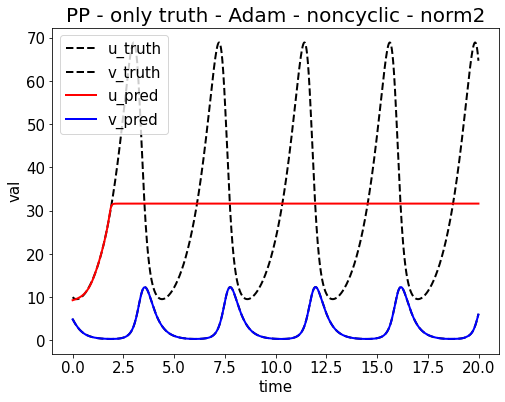

Saved as /content/drive/My Drive/Workspace/PINN//figure/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-01-23-35-44_1654126574.png


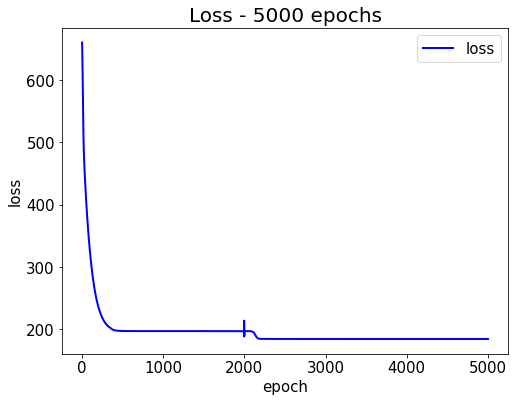

Epoch [06000/100000] Loss:184.340408 Loss_1:184.340408 Lr:0.000625 Time:7.156426s (0.62min in total, 9.73min remains)
Epoch [07000/100000] Loss:184.339584 Loss_1:184.339584 Lr:0.000588 Time:5.946580s (0.72min in total, 9.57min remains)
Epoch [08000/100000] Loss:184.339035 Loss_1:184.339035 Lr:0.000556 Time:5.910815s (0.82min in total, 9.41min remains)
Epoch [09000/100000] Loss:177.923325 Loss_1:177.923325 Lr:0.000526 Time:5.897659s (0.92min in total, 9.27min remains)
Epoch [10000/100000] Loss:51.724339 Loss_1:51.724339 Lr:0.000500 Time:5.877500s (1.01min in total, 9.13min remains)
Testing & drawing...
u= [8.703646, 8.740668, 8.777735, 8.814839, 8.851991, 8.889189, 8.926441, 8.96376, 9.001136, 9.038583] ... [64.58944, 64.61794, 64.644966, 64.6706, 64.69495, 64.71808, 64.74004, 64.760925, 64.78079, 64.79968]
v= [4.930226, 4.844087, 4.7584233, 4.673284, 4.5887337, 4.504811, 4.4215717, 4.3390517, 4.257311, 4.176386] ... [4.4541473, 4.6247993, 4.799251, 4.9770923, 5.1578655, 5.341024, 5.525

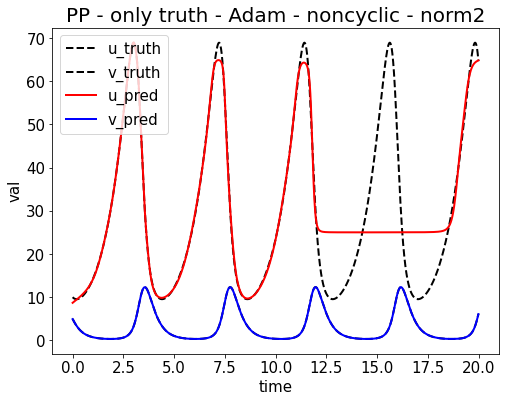

Saved as /content/drive/My Drive/Workspace/PINN//figure/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-01-23-35-44_1654126605.png


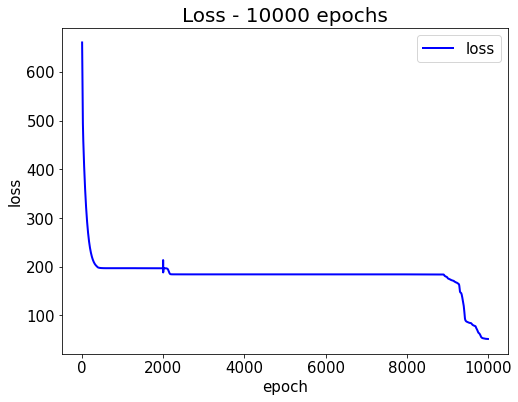

Epoch [11000/100000] Loss:51.204994 Loss_1:51.204994 Lr:0.000476 Time:7.074252s (1.13min in total, 9.16min remains)
Epoch [12000/100000] Loss:51.173611 Loss_1:51.173611 Lr:0.000455 Time:5.952987s (1.23min in total, 9.03min remains)
Epoch [13000/100000] Loss:1.470284 Loss_1:1.470284 Lr:0.000435 Time:6.085942s (1.33min in total, 8.92min remains)
Epoch [14000/100000] Loss:0.166076 Loss_1:0.166076 Lr:0.000417 Time:6.045084s (1.43min in total, 8.81min remains)
Epoch [15000/100000] Loss:0.026877 Loss_1:0.026877 Lr:0.000400 Time:5.910142s (1.53min in total, 8.68min remains)
Testing & drawing...
u= [9.717802, 9.708244, 9.69911, 9.690416, 9.682194, 9.674454, 9.6672325, 9.660545, 9.654423, 9.648888] ... [68.373825, 68.444275, 68.51193, 68.57694, 68.63943, 68.699524, 68.75733, 68.81297, 68.86656, 68.918175]
v= [4.9558873, 4.867129, 4.7789154, 4.691307, 4.6043715, 4.5181637, 4.432739, 4.348148, 4.26445, 4.181688] ... [4.4235363, 4.5960255, 4.773733, 4.9563093, 5.1432896, 5.3340297, 5.527806, 5.723

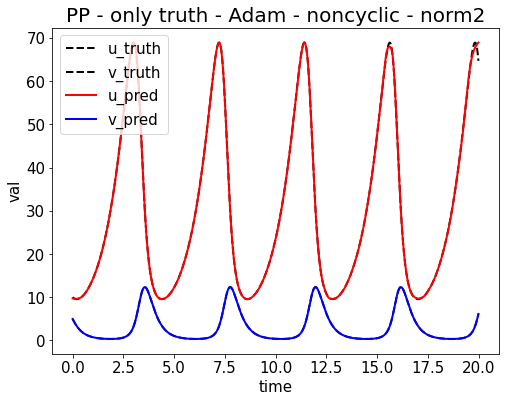

Saved as /content/drive/My Drive/Workspace/PINN//figure/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-01-23-35-44_1654126636.png


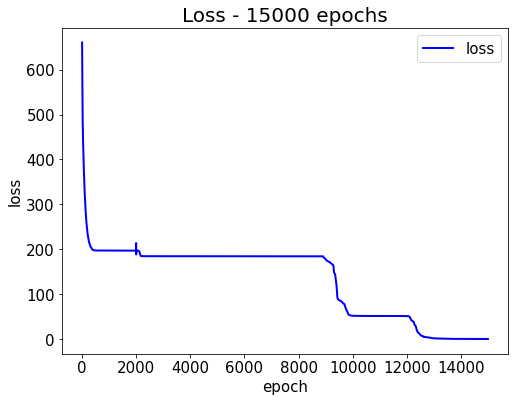

Epoch [16000/100000] Loss:0.019141 Loss_1:0.019141 Lr:0.000385 Time:7.122633s (1.65min in total, 8.67min remains)
Epoch [17000/100000] Loss:0.015523 Loss_1:0.015523 Lr:0.000370 Time:5.954350s (1.75min in total, 8.55min remains)
Epoch [18000/100000] Loss:0.014299 Loss_1:0.014299 Lr:0.000357 Time:5.960896s (1.85min in total, 8.43min remains)
Epoch [19000/100000] Loss:0.012694 Loss_1:0.012694 Lr:0.000345 Time:5.953211s (1.95min in total, 8.31min remains)
Epoch [20000/100000] Loss:0.011508 Loss_1:0.011508 Lr:0.000333 Time:5.952876s (2.05min in total, 8.19min remains)
Testing & drawing...
u= [9.827802, 9.811359, 9.795486, 9.780203, 9.765539, 9.75153, 9.738198, 9.7255745, 9.713688, 9.702574] ... [67.93521, 67.94068, 67.94534, 67.94933, 67.95277, 67.955734, 67.95835, 67.960655, 67.96271, 67.96456]
v= [4.9593935, 4.868754, 4.7787566, 4.689461, 4.6009445, 4.513261, 4.4264717, 4.3406286, 4.2557945, 4.1720123] ... [4.432886, 4.6064353, 4.7856145, 4.9700184, 5.1590815, 5.3520384, 5.5479865, 5.7458

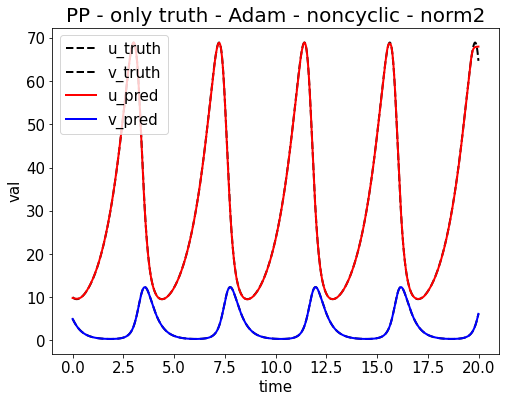

Saved as /content/drive/My Drive/Workspace/PINN//figure/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-01-23-35-44_1654126667.png


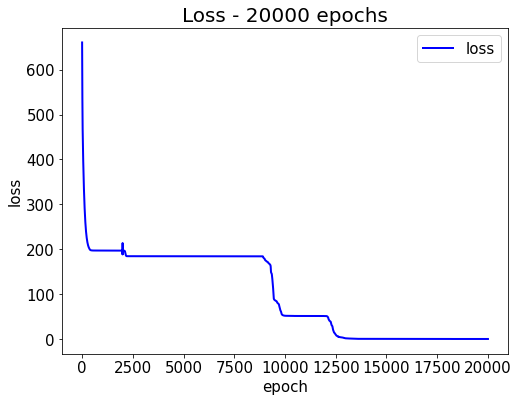

Epoch [21000/100000] Loss:0.010051 Loss_1:0.010051 Lr:0.000323 Time:7.139487s (2.17min in total, 8.15min remains)
Epoch [22000/100000] Loss:0.012686 Loss_1:0.012686 Lr:0.000313 Time:5.960465s (2.27min in total, 8.04min remains)
Epoch [23000/100000] Loss:0.008042 Loss_1:0.008042 Lr:0.000303 Time:6.006469s (2.37min in total, 7.92min remains)
Epoch [24000/100000] Loss:0.006482 Loss_1:0.006482 Lr:0.000294 Time:5.915306s (2.47min in total, 7.81min remains)
Epoch [25000/100000] Loss:0.004722 Loss_1:0.004722 Lr:0.000286 Time:5.902528s (2.56min in total, 7.69min remains)
Testing & drawing...
u= [9.841125, 9.821622, 9.802752, 9.784548, 9.767041, 9.750269, 9.734261, 9.719051, 9.704675, 9.691165] ... [67.722664, 67.63874, 67.55553, 67.473915, 67.39467, 67.31839, 67.24557, 67.17654, 67.1115, 67.05062]
v= [4.975927, 4.8837156, 4.792223, 4.7015195, 4.6116824, 4.5227737, 4.4348526, 4.3479743, 4.2622037, 4.1775846] ... [4.4240046, 4.5976863, 4.777076, 4.9617434, 5.1510863, 5.3442917, 5.5403986, 5.7383

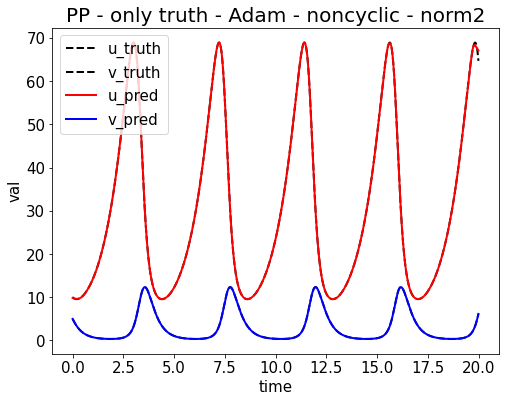

Saved as /content/drive/My Drive/Workspace/PINN//figure/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-01-23-35-44_1654126698.png


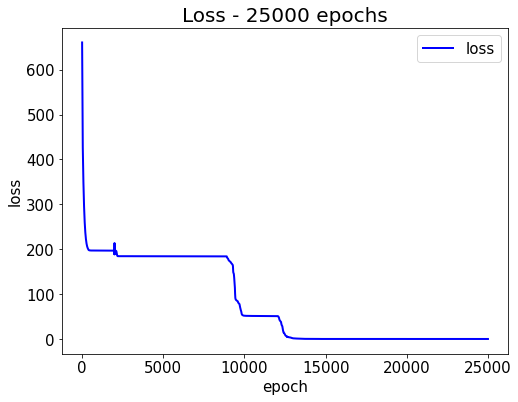

Epoch [26000/100000] Loss:0.004715 Loss_1:0.004715 Lr:0.000278 Time:7.049353s (2.68min in total, 7.63min remains)
Epoch [27000/100000] Loss:0.002316 Loss_1:0.002316 Lr:0.000270 Time:5.907525s (2.78min in total, 7.52min remains)
Epoch [28000/100000] Loss:0.001983 Loss_1:0.001983 Lr:0.000263 Time:5.880502s (2.88min in total, 7.40min remains)
Epoch [29000/100000] Loss:0.001683 Loss_1:0.001683 Lr:0.000256 Time:5.895545s (2.98min in total, 7.29min remains)
Epoch [30000/100000] Loss:0.005241 Loss_1:0.005241 Lr:0.000250 Time:5.924498s (3.07min in total, 7.17min remains)
Testing & drawing...
u= [9.829618, 9.8076725, 9.786417, 9.765886, 9.746117, 9.72714, 9.708999, 9.691721, 9.675348, 9.659918] ... [67.784935, 67.55343, 67.31404, 67.07178, 66.8316, 66.598175, 66.37545, 66.16647, 65.97333, 65.79715]
v= [4.9822206, 4.888813, 4.7961864, 4.7044187, 4.613593, 4.5237784, 4.435039, 4.34743, 4.2610197, 4.1758513] ... [4.4234786, 4.597221, 4.776718, 4.961537, 5.151067, 5.3444743, 5.540785, 5.7388606, 5.

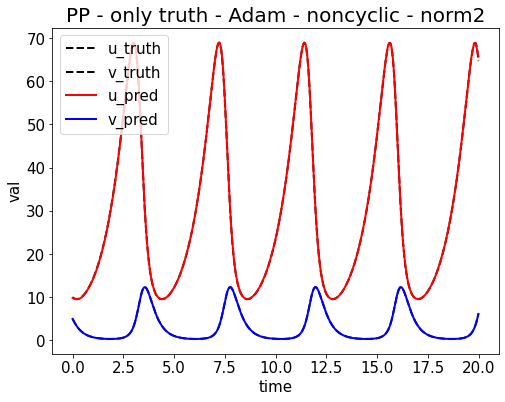

Saved as /content/drive/My Drive/Workspace/PINN//figure/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-01-23-35-44_1654126729.png


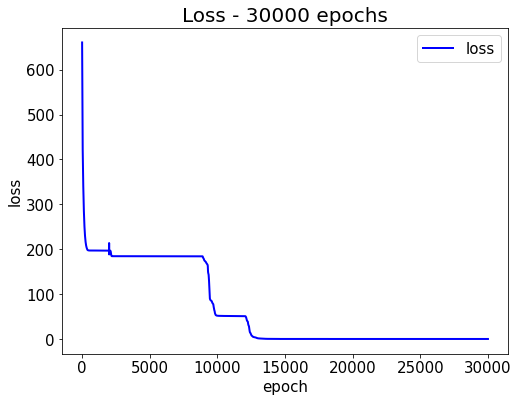

Epoch [31000/100000] Loss:0.005178 Loss_1:0.005178 Lr:0.000244 Time:7.140928s (3.19min in total, 7.11min remains)
Epoch [32000/100000] Loss:0.000987 Loss_1:0.000987 Lr:0.000238 Time:6.062831s (3.29min in total, 7.00min remains)
Epoch [33000/100000] Loss:0.000378 Loss_1:0.000378 Lr:0.000233 Time:5.957384s (3.39min in total, 6.89min remains)
Epoch [34000/100000] Loss:0.003357 Loss_1:0.003357 Lr:0.000227 Time:5.963933s (3.49min in total, 6.78min remains)
Epoch [35000/100000] Loss:0.000268 Loss_1:0.000268 Lr:0.000222 Time:5.943158s (3.59min in total, 6.67min remains)
Testing & drawing...
u= [9.876205, 9.85209, 9.828771, 9.806272, 9.78464, 9.763909, 9.744117, 9.725297, 9.707494, 9.690738] ... [67.98272, 67.71986, 67.43162, 67.12377, 66.80378, 66.480255, 66.16199, 65.85709, 65.572075, 65.311455]
v= [4.9795737, 4.8854685, 4.79218, 4.699788, 4.6083927, 4.5180635, 4.428873, 4.3408775, 4.254148, 4.168729] ... [4.4224358, 4.59606, 4.7754683, 4.960242, 5.1497746, 5.3432417, 5.5396705, 5.7379127, 5

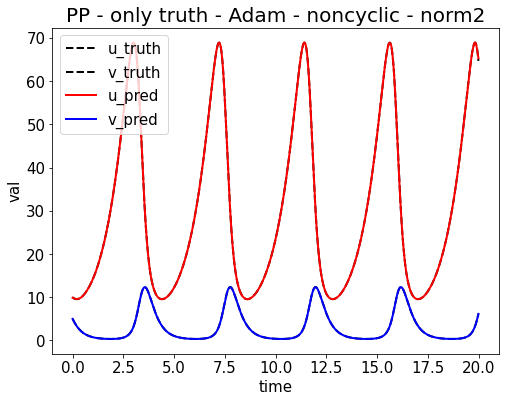

Saved as /content/drive/My Drive/Workspace/PINN//figure/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-01-23-35-44_1654126760.png


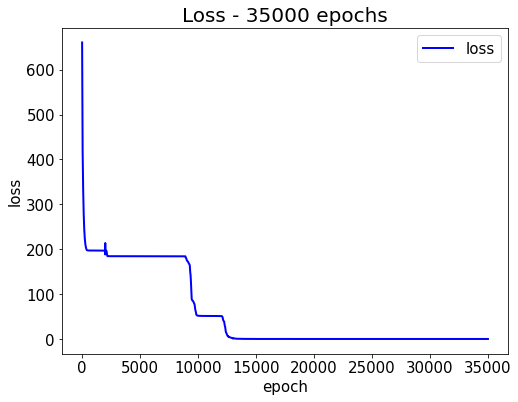

Epoch [36000/100000] Loss:0.000301 Loss_1:0.000301 Lr:0.000217 Time:7.336036s (3.71min in total, 6.60min remains)
Epoch [37000/100000] Loss:0.000795 Loss_1:0.000795 Lr:0.000213 Time:5.941998s (3.81min in total, 6.49min remains)
Epoch [38000/100000] Loss:0.000181 Loss_1:0.000181 Lr:0.000208 Time:5.941752s (3.91min in total, 6.38min remains)
Epoch [39000/100000] Loss:0.000168 Loss_1:0.000168 Lr:0.000204 Time:5.967853s (4.01min in total, 6.28min remains)
Epoch [40000/100000] Loss:0.000147 Loss_1:0.000147 Lr:0.000200 Time:5.884329s (4.11min in total, 6.17min remains)
Testing & drawing...
u= [9.890204, 9.864132, 9.838934, 9.814642, 9.791303, 9.76895, 9.747621, 9.727359, 9.7081995, 9.690177] ... [68.069885, 67.80816, 67.511246, 67.18349, 66.83203, 66.46673, 66.098976, 65.740524, 65.40167, 65.09025]
v= [4.9824424, 4.8873916, 4.793217, 4.700012, 4.6078887, 4.516923, 4.427193, 4.3387594, 4.251688, 4.166022] ... [4.4263716, 4.5999637, 4.779354, 4.964139, 5.1537266, 5.3473043, 5.5439153, 5.742422

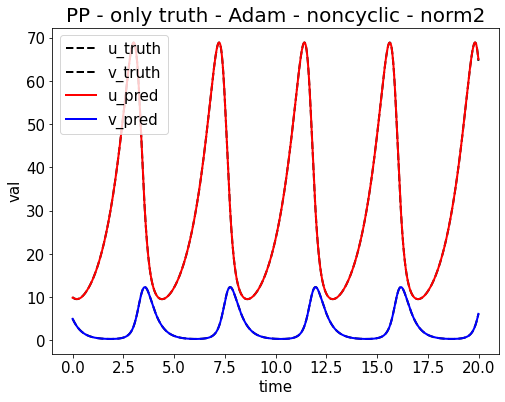

Saved as /content/drive/My Drive/Workspace/PINN//figure/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-01-23-35-44_1654126791.png


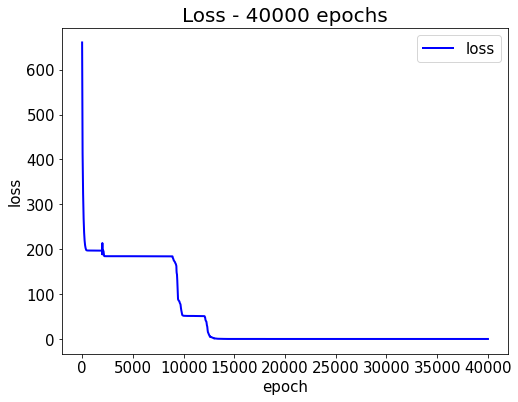

Epoch [41000/100000] Loss:0.000309 Loss_1:0.000309 Lr:0.000196 Time:7.180423s (4.23min in total, 6.09min remains)
Epoch [42000/100000] Loss:0.001684 Loss_1:0.001684 Lr:0.000192 Time:6.001225s (4.33min in total, 5.98min remains)
Epoch [43000/100000] Loss:0.000105 Loss_1:0.000105 Lr:0.000189 Time:5.949564s (4.43min in total, 5.87min remains)
Epoch [44000/100000] Loss:0.001442 Loss_1:0.001442 Lr:0.000185 Time:5.813183s (4.53min in total, 5.76min remains)
Epoch [45000/100000] Loss:0.003673 Loss_1:0.003673 Lr:0.000182 Time:5.859803s (4.62min in total, 5.65min remains)
Testing & drawing...
u= [9.912034, 9.884507, 9.85793, 9.832349, 9.807797, 9.784319, 9.761949, 9.74073, 9.720698, 9.701898] ... [68.12946, 67.87535, 67.58069, 67.24822, 66.884094, 66.49806, 66.102715, 65.71195, 65.338905, 64.99411]
v= [4.992501, 4.8966703, 4.801768, 4.7079077, 4.6152034, 4.523745, 4.433612, 4.3448606, 4.2575574, 4.171734] ... [4.422818, 4.596269, 4.775534, 4.9602256, 5.149785, 5.3434224, 5.5401917, 5.738986, 5.

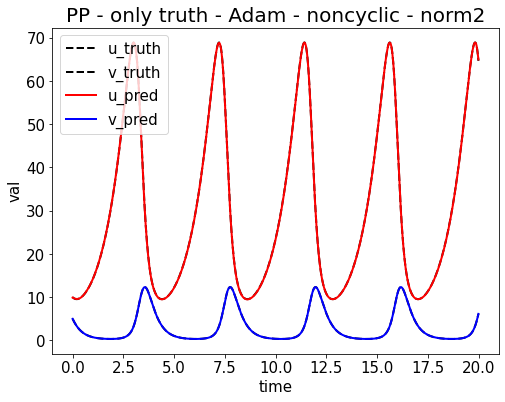

Saved as /content/drive/My Drive/Workspace/PINN//figure/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-01-23-35-44_1654126822.png


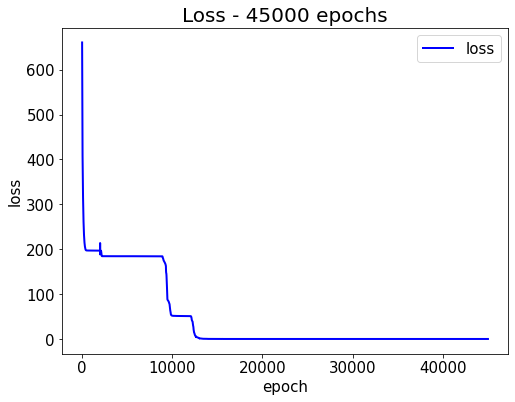

Epoch [46000/100000] Loss:0.000837 Loss_1:0.000837 Lr:0.000179 Time:7.115590s (4.74min in total, 5.57min remains)
Epoch [47000/100000] Loss:0.000376 Loss_1:0.000376 Lr:0.000175 Time:6.708990s (4.85min in total, 5.47min remains)
Epoch [48000/100000] Loss:0.000056 Loss_1:0.000056 Lr:0.000172 Time:7.027166s (4.97min in total, 5.39min remains)
Epoch [49000/100000] Loss:0.000080 Loss_1:0.000080 Lr:0.000169 Time:5.982467s (5.07min in total, 5.28min remains)
Epoch [50000/100000] Loss:0.000046 Loss_1:0.000046 Lr:0.000167 Time:5.893843s (5.17min in total, 5.17min remains)
Testing & drawing...
u= [9.912861, 9.883846, 9.855838, 9.828886, 9.803029, 9.778306, 9.754757, 9.732422, 9.711339, 9.691548] ... [68.14498, 67.89177, 67.5954, 67.257774, 66.88448, 66.485275, 66.073425, 65.66418, 65.27223, 64.90969]
v= [4.9944105, 4.8983, 4.803131, 4.7090235, 4.616104, 4.5244684, 4.4341936, 4.345346, 4.257984, 4.1721416] ... [4.4225793, 4.595921, 4.7750835, 4.9596987, 5.1492224, 5.3428845, 5.5397654, 5.738766, 

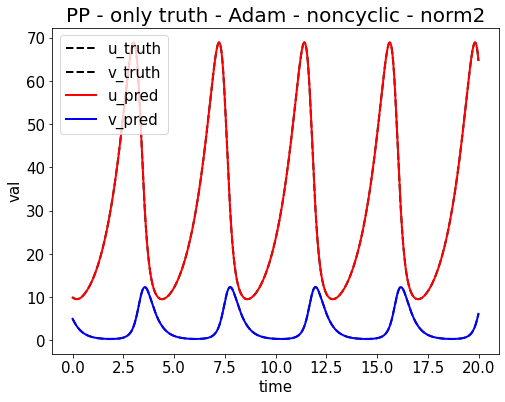

Saved as /content/drive/My Drive/Workspace/PINN//figure/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-01-23-35-44_1654126854.png


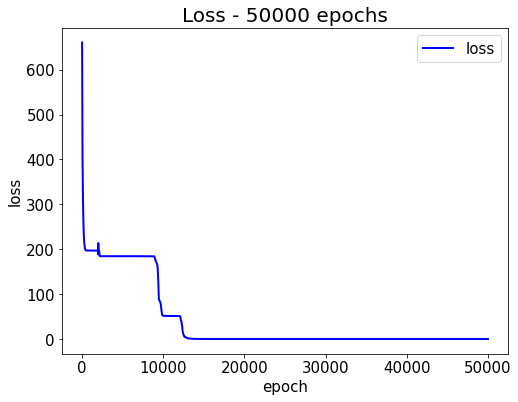

Epoch [51000/100000] Loss:0.001570 Loss_1:0.001570 Lr:0.000164 Time:7.180723s (5.29min in total, 5.08min remains)
Epoch [52000/100000] Loss:0.000092 Loss_1:0.000092 Lr:0.000161 Time:5.863396s (5.39min in total, 4.97min remains)
Epoch [53000/100000] Loss:0.000778 Loss_1:0.000778 Lr:0.000159 Time:5.938287s (5.49min in total, 4.86min remains)
Epoch [54000/100000] Loss:0.000052 Loss_1:0.000052 Lr:0.000156 Time:6.003108s (5.59min in total, 4.76min remains)
Epoch [55000/100000] Loss:0.000114 Loss_1:0.000114 Lr:0.000154 Time:5.907152s (5.68min in total, 4.65min remains)
Testing & drawing...
u= [9.920281, 9.890053, 9.860903, 9.832863, 9.805984, 9.780302, 9.755857, 9.732689, 9.710841, 9.690348] ... [68.156136, 67.9056, 67.61056, 67.27218, 66.895386, 66.48962, 66.068306, 65.64738, 65.24266, 64.86743]
v= [4.9855723, 4.889247, 4.793885, 4.699619, 4.606579, 4.514864, 4.4245553, 4.3357086, 4.2483892, 4.1626205] ... [4.4657965, 4.640335, 4.8206444, 5.006332, 5.1968403, 5.391374, 5.589001, 5.78861, 5.

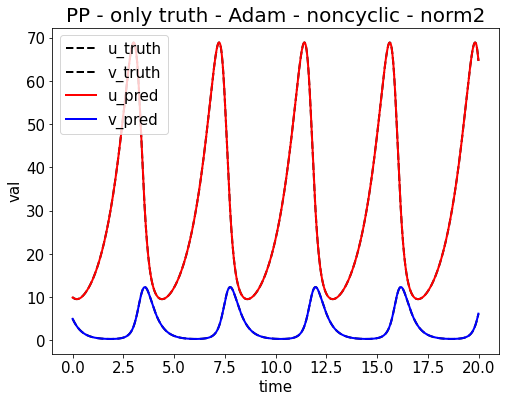

Saved as /content/drive/My Drive/Workspace/PINN//figure/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-01-23-35-44_1654126885.png


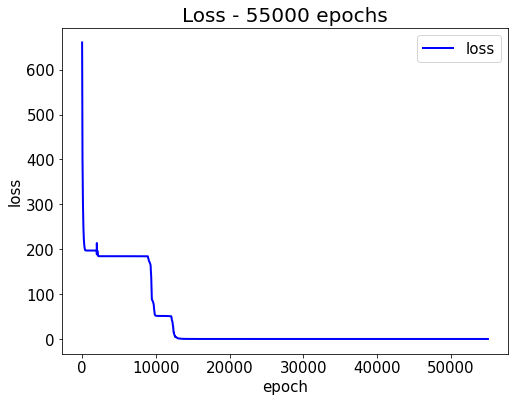

Epoch [56000/100000] Loss:0.000724 Loss_1:0.000724 Lr:0.000152 Time:7.241252s (5.81min in total, 4.56min remains)
Epoch [57000/100000] Loss:0.000036 Loss_1:0.000036 Lr:0.000149 Time:5.989912s (5.90min in total, 4.45min remains)
Epoch [58000/100000] Loss:0.000203 Loss_1:0.000203 Lr:0.000147 Time:5.915270s (6.00min in total, 4.35min remains)
Epoch [59000/100000] Loss:0.001192 Loss_1:0.001192 Lr:0.000145 Time:5.876203s (6.10min in total, 4.24min remains)
Epoch [60000/100000] Loss:0.003324 Loss_1:0.003324 Lr:0.000143 Time:5.970558s (6.20min in total, 4.13min remains)
Testing & drawing...
u= [9.905054, 9.873624, 9.84333, 9.814205, 9.7863, 9.75965, 9.734297, 9.710282, 9.687647, 9.666424] ... [68.17628, 67.9326, 67.64385, 67.31032, 66.936005, 66.529495, 66.10382, 65.675095, 65.25992, 64.87278]
v= [4.9824724, 4.8859777, 4.7904563, 4.696045, 4.6028886, 4.511082, 4.4207125, 4.331835, 4.244512, 4.158762] ... [4.426316, 4.599466, 4.7784376, 4.9629, 5.1523447, 5.3460436, 5.543121, 5.7425237, 5.9430

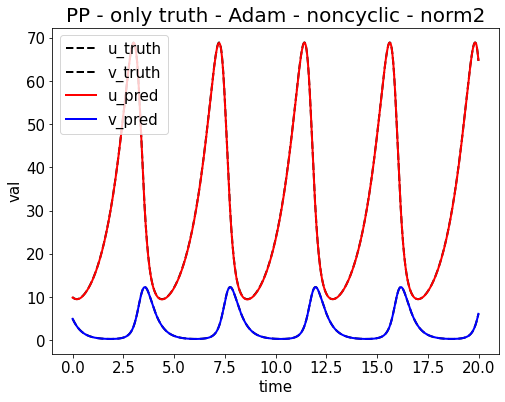

Saved as /content/drive/My Drive/Workspace/PINN//figure/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-01-23-35-44_1654126916.png


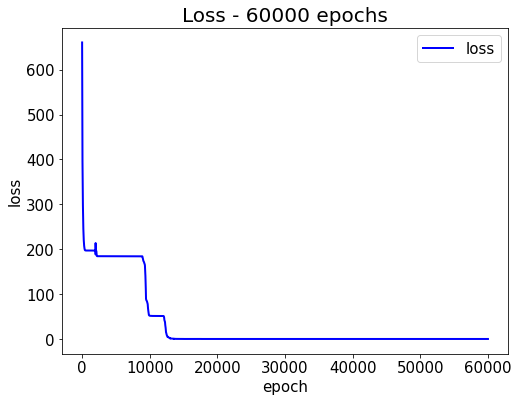

Epoch [61000/100000] Loss:0.000040 Loss_1:0.000040 Lr:0.000141 Time:7.181865s (6.32min in total, 4.04min remains)
Epoch [62000/100000] Loss:0.000039 Loss_1:0.000039 Lr:0.000139 Time:5.935735s (6.42min in total, 3.93min remains)
Epoch [63000/100000] Loss:0.000105 Loss_1:0.000105 Lr:0.000137 Time:5.897797s (6.52min in total, 3.83min remains)
Epoch [64000/100000] Loss:0.000089 Loss_1:0.000089 Lr:0.000135 Time:5.946761s (6.62min in total, 3.72min remains)
Epoch [65000/100000] Loss:0.000165 Loss_1:0.000165 Lr:0.000133 Time:5.888857s (6.72min in total, 3.62min remains)
Testing & drawing...
u= [9.921682, 9.889371, 9.858248, 9.828348, 9.79973, 9.772421, 9.7464695, 9.721906, 9.698778, 9.677122] ... [68.16632, 67.91998, 67.62819, 67.291115, 66.91273, 66.50173, 66.071396, 65.63816, 65.21902, 64.828735]
v= [4.9954367, 4.898689, 4.802914, 4.7082586, 4.614867, 4.5228477, 4.4322815, 4.3432355, 4.255764, 4.169891] ... [4.4226737, 4.5956817, 4.7745175, 4.958852, 5.148211, 5.341882, 5.5390162, 5.738573,

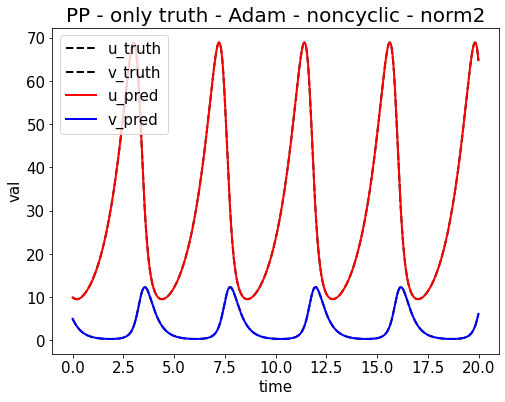

Saved as /content/drive/My Drive/Workspace/PINN//figure/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-01-23-35-44_1654126947.png


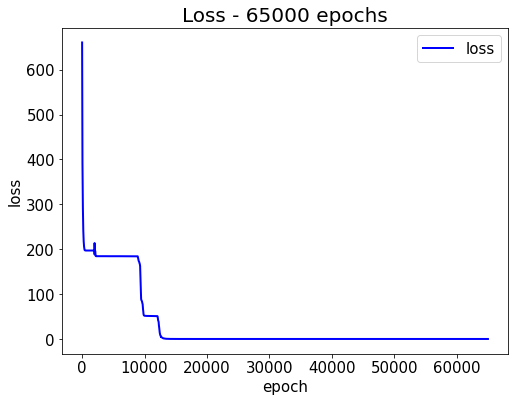

Epoch [66000/100000] Loss:0.000047 Loss_1:0.000047 Lr:0.000132 Time:7.062587s (6.83min in total, 3.52min remains)
Epoch [67000/100000] Loss:0.000026 Loss_1:0.000026 Lr:0.000130 Time:5.885262s (6.93min in total, 3.41min remains)
Epoch [68000/100000] Loss:0.000046 Loss_1:0.000046 Lr:0.000128 Time:5.896455s (7.03min in total, 3.31min remains)
Epoch [69000/100000] Loss:0.000035 Loss_1:0.000035 Lr:0.000127 Time:5.954658s (7.13min in total, 3.20min remains)
Epoch [70000/100000] Loss:0.000568 Loss_1:0.000568 Lr:0.000125 Time:5.925714s (7.23min in total, 3.10min remains)
Testing & drawing...
u= [9.956171, 9.923262, 9.891599, 9.861225, 9.832188, 9.804522, 9.778268, 9.753464, 9.730151, 9.708366] ... [68.17142, 67.927925, 67.63887, 67.30406, 66.92703, 66.51604, 66.08406, 65.64756, 65.22381, 64.828125]
v= [4.994358, 4.897474, 4.801569, 4.7068005, 4.613316, 4.521223, 4.43061, 4.341539, 4.2540627, 4.168202] ... [4.4237766, 4.5967035, 4.775455, 4.9597163, 5.1490283, 5.3427014, 5.5399017, 5.739616, 5.

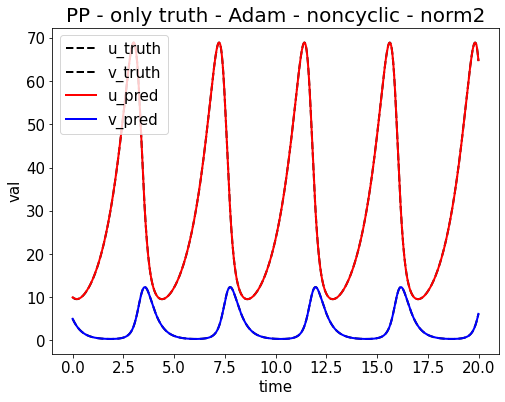

Saved as /content/drive/My Drive/Workspace/PINN//figure/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-01-23-35-44_1654126978.png


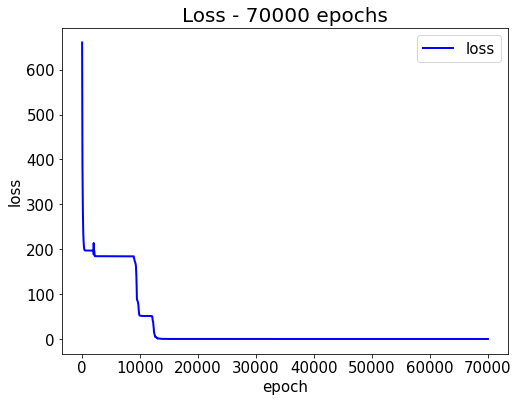

Epoch [71000/100000] Loss:0.000037 Loss_1:0.000037 Lr:0.000123 Time:7.089480s (7.35min in total, 3.00min remains)
Epoch [72000/100000] Loss:0.000195 Loss_1:0.000195 Lr:0.000122 Time:5.898012s (7.44min in total, 2.89min remains)
Epoch [73000/100000] Loss:0.000025 Loss_1:0.000025 Lr:0.000120 Time:5.919430s (7.54min in total, 2.79min remains)
Epoch [74000/100000] Loss:0.000026 Loss_1:0.000026 Lr:0.000119 Time:5.982173s (7.64min in total, 2.69min remains)
Epoch [75000/100000] Loss:0.000023 Loss_1:0.000023 Lr:0.000118 Time:5.921160s (7.74min in total, 2.58min remains)
Testing & drawing...
u= [9.943175, 9.909386, 9.876891, 9.845725, 9.815938, 9.787566, 9.760652, 9.735231, 9.711345, 9.689028] ... [68.168495, 67.92476, 67.63542, 67.30016, 66.92235, 66.51017, 66.076546, 65.63797, 65.21191, 64.81384]
v= [4.9963174, 4.8992896, 4.8032484, 4.7083564, 4.6147666, 4.5225873, 4.431908, 4.34279, 4.2552857, 4.1694126] ... [4.422966, 4.5957923, 4.774437, 4.95861, 5.1478586, 5.34152, 5.538782, 5.7386456, 5

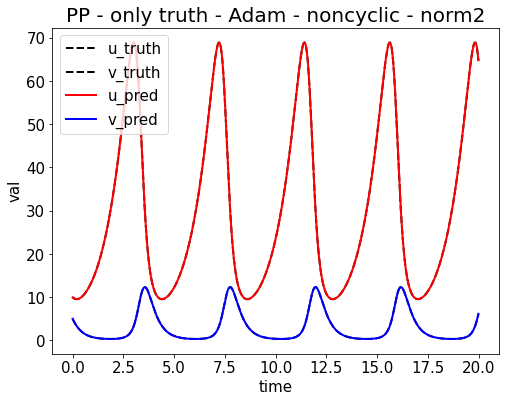

Saved as /content/drive/My Drive/Workspace/PINN//figure/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-01-23-35-44_1654127009.png


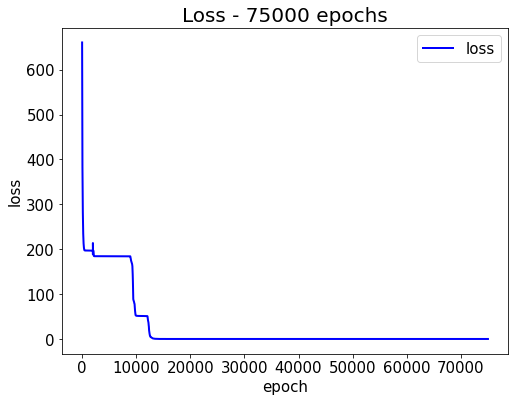

Epoch [76000/100000] Loss:0.000030 Loss_1:0.000030 Lr:0.000116 Time:7.005848s (7.86min in total, 2.48min remains)
Epoch [77000/100000] Loss:0.000081 Loss_1:0.000081 Lr:0.000115 Time:5.889579s (7.96min in total, 2.38min remains)
Epoch [78000/100000] Loss:0.000023 Loss_1:0.000023 Lr:0.000114 Time:5.866107s (8.05min in total, 2.27min remains)
Epoch [79000/100000] Loss:0.000025 Loss_1:0.000025 Lr:0.000112 Time:5.880634s (8.15min in total, 2.17min remains)
Epoch [80000/100000] Loss:0.000023 Loss_1:0.000023 Lr:0.000111 Time:5.905426s (8.25min in total, 2.06min remains)
Testing & drawing...
u= [9.9463415, 9.911994, 9.878975, 9.847324, 9.817091, 9.788313, 9.761026, 9.735272, 9.711086, 9.688505] ... [68.16828, 67.92521, 67.63656, 67.301895, 66.924416, 66.51212, 66.077774, 65.63786, 65.2099, 64.809555]
v= [4.9940805, 4.8969584, 4.8008327, 4.705863, 4.61221, 4.519983, 4.429274, 4.3401413, 4.2526393, 4.166783] ... [4.4244776, 4.597187, 4.7757096, 4.9597654, 5.148925, 5.342534, 5.5398116, 5.739774,

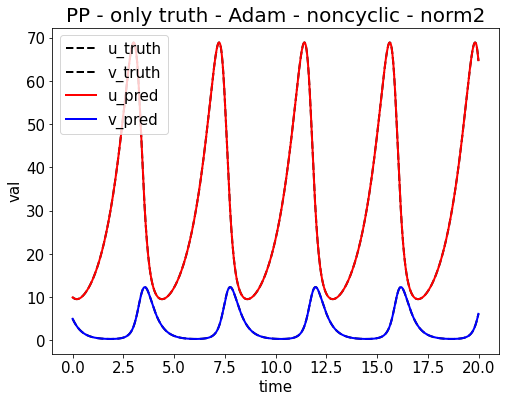

Saved as /content/drive/My Drive/Workspace/PINN//figure/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-01-23-35-44_1654127039.png


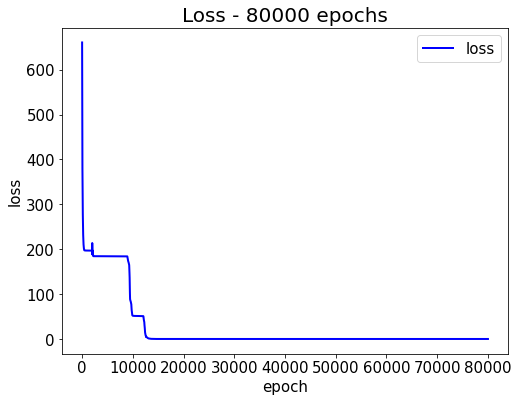

Epoch [81000/100000] Loss:0.000021 Loss_1:0.000021 Lr:0.000110 Time:7.117036s (8.37min in total, 1.96min remains)
Epoch [82000/100000] Loss:0.000290 Loss_1:0.000290 Lr:0.000109 Time:5.943291s (8.47min in total, 1.86min remains)
Epoch [83000/100000] Loss:0.000021 Loss_1:0.000021 Lr:0.000108 Time:6.042456s (8.57min in total, 1.75min remains)
Epoch [84000/100000] Loss:0.000020 Loss_1:0.000020 Lr:0.000106 Time:5.980229s (8.67min in total, 1.65min remains)
Epoch [85000/100000] Loss:0.000264 Loss_1:0.000264 Lr:0.000105 Time:5.912235s (8.77min in total, 1.55min remains)
Testing & drawing...
u= [9.939309, 9.904374, 9.870802, 9.838628, 9.807903, 9.778661, 9.750944, 9.724786, 9.700227, 9.677302] ... [68.17367, 67.9328, 67.64647, 67.31403, 66.9384, 66.527214, 66.09298, 65.651985, 65.22181, 64.818375]
v= [4.9967127, 4.899511, 4.8032975, 4.708246, 4.6145163, 4.522223, 4.4314604, 4.3422866, 4.2547545, 4.16888] ... [4.423189, 4.5958657, 4.7743487, 4.958373, 5.14751, 5.3411365, 5.538472, 5.7385607, 5.

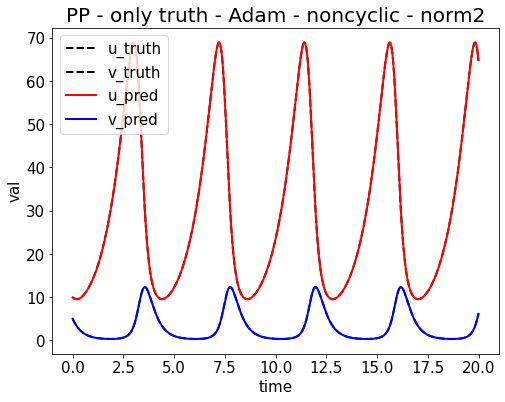

Saved as /content/drive/My Drive/Workspace/PINN//figure/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-01-23-35-44_1654127070.png


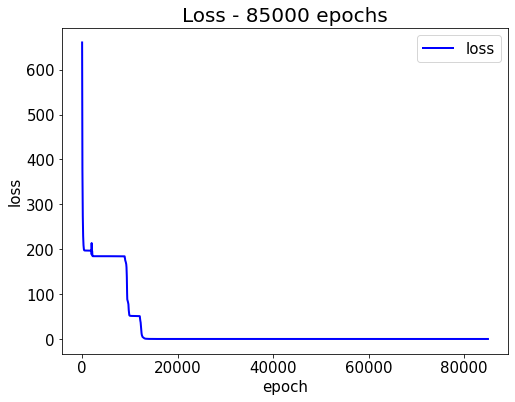

Epoch [86000/100000] Loss:0.000020 Loss_1:0.000020 Lr:0.000104 Time:7.324504s (8.89min in total, 1.45min remains)
Epoch [87000/100000] Loss:0.000022 Loss_1:0.000022 Lr:0.000103 Time:6.016917s (8.99min in total, 1.34min remains)
Epoch [88000/100000] Loss:0.000028 Loss_1:0.000028 Lr:0.000102 Time:5.943044s (9.09min in total, 1.24min remains)
Epoch [89000/100000] Loss:0.000033 Loss_1:0.000033 Lr:0.000101 Time:5.920406s (9.19min in total, 1.14min remains)
Epoch [90000/100000] Loss:0.000019 Loss_1:0.000019 Lr:0.000100 Time:5.976639s (9.29min in total, 1.03min remains)
Testing & drawing...
u= [9.951692, 9.916368, 9.88244, 9.849953, 9.818951, 9.789467, 9.761548, 9.735225, 9.710535, 9.687517] ... [68.167595, 67.92554, 67.63799, 67.30433, 66.92747, 66.51509, 66.07975, 65.63776, 65.20676, 64.80268]
v= [4.99639, 4.899123, 4.802847, 4.7077394, 4.6139584, 4.521628, 4.430837, 4.341647, 4.25411, 4.1682405] ... [4.424313, 4.596943, 4.7753797, 4.9593544, 5.1484666, 5.3421006, 5.5394964, 5.7397156, 5.94

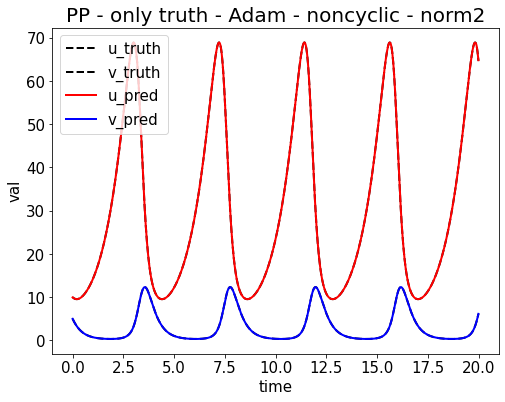

Saved as /content/drive/My Drive/Workspace/PINN//figure/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-01-23-35-44_1654127101.png


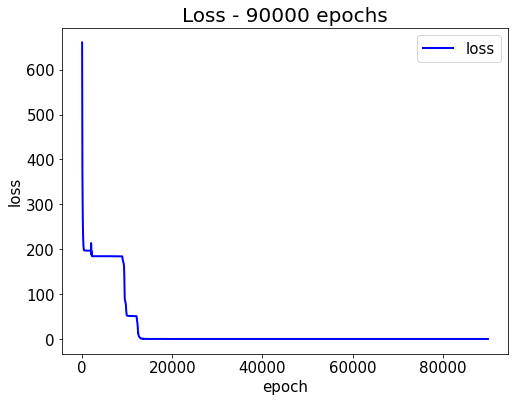

Epoch [91000/100000] Loss:0.000019 Loss_1:0.000019 Lr:0.000099 Time:7.225246s (9.41min in total, 0.93min remains)
Epoch [92000/100000] Loss:0.000019 Loss_1:0.000019 Lr:0.000098 Time:5.960035s (9.51min in total, 0.83min remains)
Epoch [93000/100000] Loss:0.000018 Loss_1:0.000018 Lr:0.000097 Time:5.901273s (9.60min in total, 0.72min remains)
Epoch [94000/100000] Loss:0.001448 Loss_1:0.001448 Lr:0.000096 Time:5.894272s (9.70min in total, 0.62min remains)
Epoch [95000/100000] Loss:0.000018 Loss_1:0.000018 Lr:0.000095 Time:5.796037s (9.80min in total, 0.52min remains)
Testing & drawing...
u= [9.954201, 9.918419, 9.884074, 9.851197, 9.819841, 9.790036, 9.761825, 9.735243, 9.710319, 9.687102] ... [68.167496, 67.925896, 67.63887, 67.30568, 66.929146, 66.5168, 66.081055, 65.63819, 65.20584, 64.80009]
v= [4.996838, 4.899515, 4.803185, 4.7080216, 4.614193, 4.521821, 4.4309983, 4.3417873, 4.2542367, 4.1683636] ... [4.423642, 4.5961885, 4.7745323, 4.9584217, 5.147464, 5.3410606, 5.53847, 5.7387686,

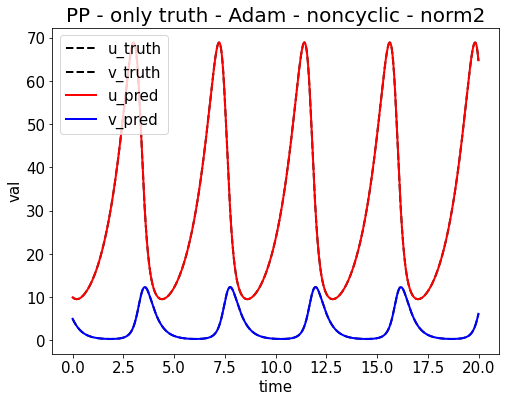

Saved as /content/drive/My Drive/Workspace/PINN//figure/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-01-23-35-44_1654127132.png


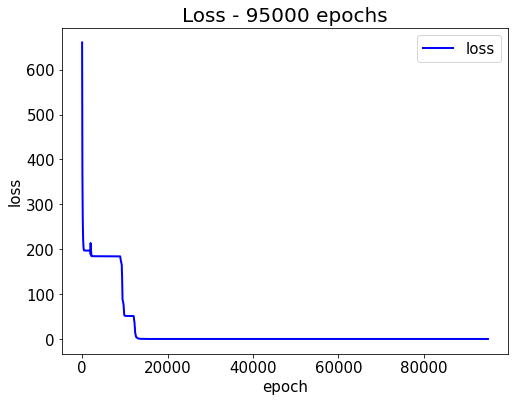

Epoch [96000/100000] Loss:0.000074 Loss_1:0.000074 Lr:0.000094 Time:7.139634s (9.92min in total, 0.41min remains)
Epoch [97000/100000] Loss:0.000136 Loss_1:0.000136 Lr:0.000093 Time:5.909419s (10.02min in total, 0.31min remains)
Epoch [98000/100000] Loss:0.000018 Loss_1:0.000018 Lr:0.000093 Time:5.835344s (10.11min in total, 0.21min remains)
Epoch [99000/100000] Loss:0.003036 Loss_1:0.003036 Lr:0.000092 Time:5.927054s (10.21min in total, 0.10min remains)
Epoch [100000/100000] Loss:0.000017 Loss_1:0.000017 Lr:0.000091 Time:5.963554s (10.31min in total, 0.00min remains)
Testing & drawing...
u= [9.956367, 9.920154, 9.885406, 9.852166, 9.820474, 9.790365, 9.7618885, 9.735063, 9.709934, 9.686536] ... [68.16704, 67.925766, 67.63914, 67.306335, 66.93007, 66.51776, 66.081696, 65.638084, 65.204575, 64.79731]
v= [4.995826, 4.898458, 4.8020854, 4.706884, 4.6130238, 4.5206265, 4.4297905, 4.340572, 4.253023, 4.1671596] ... [4.425909, 4.598442, 4.7767663, 4.9606376, 5.149674, 5.3432865, 5.5407505, 5

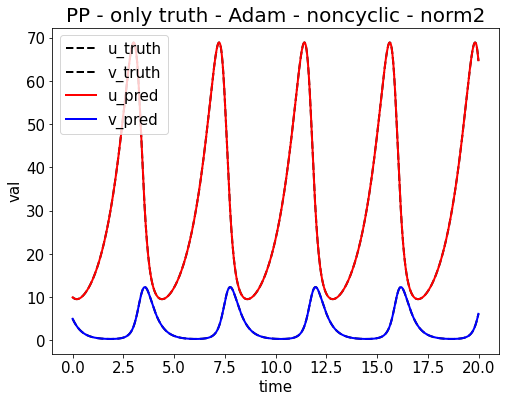

Saved as /content/drive/My Drive/Workspace/PINN//figure/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-01-23-35-44_1654127163.png


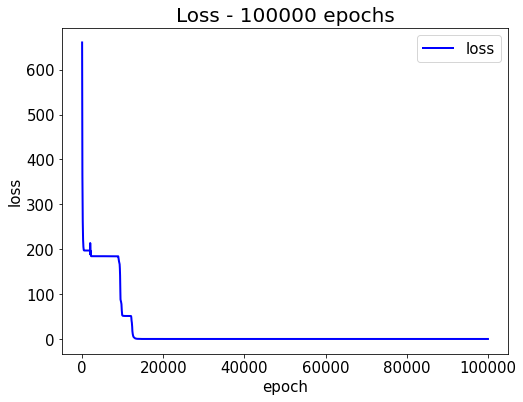

tensor board path: /content/drive/My Drive/Workspace/PINN//board/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-01-23-35-44_board
%load_ext tensorboard
%tensorboard --logdir=/content/drive/My\ Drive/Workspace/PINN//board/SimpleNetworkPP_Truth_100000_1000_0.001_2022-06-01-23-35-44_board


In [ ]:
# PP - only truth
main_path = '/content/drive/My Drive/Workspace/PINN/' # ENZE marked: you need to change your main_path if it's not here
run_pp_truth(main_path)